<a href="https://colab.research.google.com/github/marcinwolter/MachineLearnin2019/blob/master/dnn_tracking_2D_mdn_multimod.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
'''
Reconstructs straight tracks in 2D (with noise and inefficiency) using MDN
Authors: Karol Bialas, Mateusz Słysz 
Link to PPSS-Particle-Tracking Repository:
https://github.com/Matek1731/PPSS-Particle-Tracking

'''

from __future__ import print_function, division


!pip install keras_sequential_ascii
!pip install keras-mdn-layer



import matplotlib.pyplot as plt
# Package imports
import numpy as np
from scipy.stats import norm
import scipy.stats as stats
import scipy as sp
import logging


#import tensorflow as tf

import os
import pprint

###import keras
from tensorflow.compat.v1 import keras 

import mdn



#from keras.layers import Dense, Dropout, Flatten
#from keras.layers import Conv2D, MaxPooling2D, RepeatVector, LSTM, TimeDistributed
#from keras.layers import Conv3D, MaxPooling3D
#from keras.layers import Reshape
#from keras.models import Sequential
from keras_sequential_ascii import sequential_model_to_ascii_printout
from tensorflow.compat.v1.keras.utils import plot_model
from tensorflow.compat.v1.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.compat.v1.keras.models import load_model
from tensorflow.compat.v1.keras.optimizers import SGD, RMSprop, Adam, Nadam

from matplotlib.pyplot import imshow

import sys
import time

np.random.seed(2348)

batch_size = 5000
batch_size_NN = 2*128 #2*128
epochs = 512 #512
pre_epochs =  16 #32 epochs for pre-traing using rms optimizer
post_epochs = 16 #64 post-training using SGD
steps_per_epoch = 2*8 #4*8

# input image dimensions
img_rows, img_cols = 28, 28  #28, 28


In [0]:


####################################################################################################

# Data parameters
det_width = img_rows  # stupid, to be changed
det_depth = img_cols
det_shape = (det_width, det_width, det_depth)


# Number of tracks in each event follows Poisson distribution
mean_tracks = 2
max_tracks  = 2

#probability of noise and the efficiency<1
prob_noise = 0.2
efficiency = 0.90

#slope multiplicator - reduce the slope to slope_mult*max_slope
slope_mult = 0.4

#MDN parameters
mdn_out=2
mdn_mix=3

y_new = []

################################matplotlib-hep########################################### 


def calc_nbins(x, maximum=150):
    n =  (max(x) - min(x)) / (2 * len(x)**(-1/3) * (np.percentile(x, 75) - np.percentile(x, 25)))
    print(f"bins_proposed: {n}")
    return np.floor(min(n, maximum))

def poisson_limits(N, kind, confidence=0.6827):
    alpha = 1 - confidence
    upper = np.zeros(len(N))
    lower = np.zeros(len(N))
    if kind == 'gamma':
        lower = stats.gamma.ppf(alpha / 2, N)
        upper = stats.gamma.ppf(1 - alpha / 2, N + 1)
    elif kind == 'sqrt':
        err = np.sqrt(N)
        lower = N - err
        upper = N + err
    else:
        raise ValueError('Unknown errorbar kind: {}'.format(kind))
    # clip lower bars
    lower[N==0] = 0
    return N - lower, upper - N

def histpoints(x, bins=None, xerr=None, yerr='gamma', normed=False, **kwargs):
    """
    Plot a histogram as a series of data points.
    Compute and draw the histogram of *x* using individual (x,y) points
    for the bin contents.
    By default, vertical poisson error bars are calculated using the
    gamma distribution.
    Horizontal error bars are omitted by default.
    These can be enabled using the *xerr* argument.
    Use ``xerr='binwidth'`` to draw horizontal error bars that indicate
    the width of each histogram bin.
    Parameters
    ---------
    x : (n,) array or sequence of (n,) arrays
        Input values. This takes either a single array or a sequence of
        arrays, which are not required to be of the same length.
    """
    import matplotlib.pyplot as plt

    if bins is None:
        bins = int(calc_nbins(x))

    h, bins = np.histogram(x, bins=bins)
    width = bins[1] - bins[0]
    center = (bins[:-1] + bins[1:]) / 2
    area = sum(h * width)

    if isinstance(yerr, str):
        yerr = poisson_limits(h, yerr)

    if xerr == 'binwidth':
        xerr = width / 2

    if normed:
        h = h / area
        yerr = yerr / area
        area = 1.

    if not 'color' in kwargs:
        kwargs['color'] = 'black'

    if not 'fmt' in kwargs:
        kwargs['fmt'] = 'o'

    plt.errorbar(center, h, xerr=xerr, yerr=yerr, **kwargs)

    return center, (yerr[0], h, yerr[1]), area

def make_split(ratio, gap=0.12):
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    from matplotlib.ticker import MaxNLocator
    cax = plt.gca()
    box = cax.get_position()
    xmin, ymin = box.xmin, box.ymin
    xmax, ymax = box.xmax, box.ymax
    gs = GridSpec(2, 1, height_ratios=[ratio, 1 - ratio], left=xmin, right=xmax, bottom=ymin, top=ymax)
    gs.update(hspace=gap)

    ax = plt.subplot(gs[0])
    plt.setp(ax.get_xticklabels(), visible=False)
    bx = plt.subplot(gs[1], sharex=ax)

    return ax, bx

def plot_pull(data, func, title):

    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.ticker import MaxNLocator

    ax, bx = make_split(0.8)

    plt.sca(ax)

    x, y, norm = histpoints(data)

    lower, upper = ax.get_xlim()

    xs = np.linspace(-min(abs(lower), upper), min(abs(lower), upper), 200)
    plt.plot(xs, norm * func(xs), 'b-')

    #plt.gca().yaxis.set_major_locator(MaxNLocator(prune='lower'))
    plt.title(title, fontsize = 25)
    plt.sca(bx)

    resid = y[1] - norm * func(x)
    err = np.zeros_like(resid)
    err[resid >= 0] = y[0][resid >= 0]
    err[resid < 0] = y[2][resid < 0]

    pull = resid / err

    plt.errorbar(x, pull, yerr=1, color='k', fmt='o')
    plt.ylim(-5, 5)
    plt.axhline(0, color='b')

    plt.sca(ax)

    return ax, bx
  
# ### Functions for toy data generation


def simulate_straight_track(b2x, bx, b2y, by, det_shape):
    """
    Simulate detector data for one straight track.
    Parameters:
        b2x, b2y: track last layer intercept
        bx, by: track first-layer intercept parameter (detector entry point)
        det_shape: tuple of detector shape: (width, width, depth)
    Returns:
        ndarray of binary detector data for one track.
    """
    x = np.zeros(det_shape)
    idz = np.arange(det_shape[2])
    hitsx = (idz*(b2x-bx)/det_depth + bx +0.5).astype(int)  ## +0.5 to get rounding, not clipping
    hitsy = (idz*(b2y-by)/det_depth + by +0.5).astype(int)  ## +0.5 to get rounding, not clipping
    # implement hit efficiency
    for i in range(det_shape[0]):
        if (np.random.random() > efficiency):
            hitsx[i]=0
            hitsy[i]=0
    #print ("HITS = ",hits)
    valid = (hitsx > 0) & (hitsx < det_shape[0]) & (hitsy > 0) & (hitsy < det_shape[1])
    x[hitsx[valid], hitsy[valid], idz[valid]] = 1
    return x

# Generator for single-track events
def gen_tracks(batch_size=batch_size, det_shape=det_shape):
    """Arguments:
         batch_size: number of events to yield for each call
       Yields: batches of training data for use with the keras fit_generator function
    """
    while True:
        # Entry and exit points are randomized
        bsx = np.random.random_sample(size=batch_size)*(det_width-6)+3
        b2sx = np.random.random_sample(size=batch_size)*(det_width-6)+3
        # restrict the slope of a track to slope_mult*slope
        b2sx = bsx + slope_mult*(b2sx-bsx)
        
        bsy = np.random.random_sample(size=batch_size)*(det_width-6)+3
        b2sy = np.random.random_sample(size=batch_size)*(det_width-6)+3
        # restrict the slope of a track to slope_mult*slope
        b2sy = bsy + slope_mult*(b2sy-bsy)
        
        tracks = np.zeros((batch_size, 1, det_depth, det_width, det_width))
        params = zip(bsx, b2sx, bsy, b2sy )
        for i, (pbx, pb2x, pby, pb2y) in enumerate(params):
            tracks[i,0] = simulate_straight_track(pb2x, pbx, pb2y, pby, det_shape)
###        targets = zip(bsx, msx, bsy, msy)
#         targets = list(zip(bsx/det_width, (b2sx-bsx)/det_depth/slope_mult, 
#                       bsy/det_width, (b2sy-bsy)/det_depth/slope_mult ))  # save b and b2 as targets
        targets = list(zip(bsx/det_width, b2sx/det_width, 
                      bsy/det_width, b2sy/det_width))  # save b and b2 as targets
        targets = np.asarray(targets)
        yield tracks, targets

# Generator for multi-track events.
# Each event contains exactly n_tracks tracks.
# The target track parameters are sorted in increasing order of X intercept.
def gen_n_tracks(batch_size=batch_size, det_shape=det_shape, n_tracks=mean_tracks, train = True):
    gen_single = gen_tracks(batch_size=n_tracks, det_shape=det_shape)
    while True:
        batch_events = np.zeros((batch_size, 1, det_depth, det_width, det_width))
#        batch_targets = -np.ones((batch_size, n_tracks, 4))
        if train:
          batch_targets = -np.ones((batch_size, 1, 4))
        else:
          batch_targets = -np.ones((batch_size, n_tracks, 4))

        #print("batch_targets 0 ",batch_targets.shape)
        for n in range(batch_size):
            tracks,targets = gen_single.__next__()
            batch_events[n,0] = np.clip( sum( tracks ), 0, 1)
            
            event_targets = np.asarray(targets)
            #print(event_targets.shape)
            #event_targets = event_targets[:,:,0]
            #print("event_targets",event_targets,targets)
            if train:
              batch_targets[n] = event_targets[0]#[event_targets[:,0].argsort()] # sort by first column
            else:
              batch_targets[n] = event_targets[event_targets[:,0].argsort()] # sort by first column

            #add empty rows to get the size of max_tracks
            #for k in range(max_tracks-n_tracks):
            ###batch_targets[n] = event_targets  #do not sort
            #print("batch_events ",batch_events.shape)
            #print("batch_targets ",batch_targets.shape)
        yield batch_events, batch_targets

# Generator for multi-track events.
# Each event contains up to max_tracks tracks.
# The target track parameters are sorted in increasing order of intercept.
def gen_multi_tracks(batch_size=batch_size, det_shape=det_shape, mean_tracks=mean_tracks):
    gen_single = gen_tracks(batch_size=max_tracks, det_shape=det_shape)
    while True:
        batch_events = np.zeros((batch_size, 1, det_depth, det_width, det_width))
        batch_targets = -np.ones((batch_size, max_tracks, 4))
        for n in range(batch_size):
            num_tracks = min( max_tracks, np.random.poisson(mean_tracks) )
            tracks,targets = gen_single.__next__()
            batch_events[n,0] = np.clip( sum( tracks[:num_tracks] ), 0, 1)
            event_targets = np.asarray(targets[:num_tracks])
            batch_targets[n,:num_tracks] = event_targets[event_targets[:,0].argsort()] # sort by first column            
        yield batch_events, batch_targets


def gen_noise(batch_size=batch_size, det_shape=det_shape, prob_noise=prob_noise, dims = 3):

        batch_events = np.zeros((batch_size, 1, det_depth, det_width, det_width))
        for n in range(batch_size):
        
            for i in range(det_depth):
               for j in range(det_width):
                  if dims == 3:
                    for k in range(det_width):
                       if np.random.random()<prob_noise:
                          batch_events[n,0,i,j,k]=1
                  elif dims == 2:
                      if np.random.random()<prob_noise:
                            batch_events[n,0,i,0,j]=1


        yield batch_events


####################################################################################################





##########################################################################################

def get_activations(model, model_inputs, print_shape_only=False, layer_name=None):
    print('----- activations -----')
    activations = []
    inp = model.input

    model_multi_inputs_cond = True
    if not isinstance(inp, list):
        # only one input! let's wrap it in a list.
        inp = [inp]
        model_multi_inputs_cond = False

    outputs = [layer.output for layer in model.layers if
               layer.name == layer_name or layer_name is None]  # all layer outputs



    funcs = [K.function(inp + [K.learning_phase()], [out]) for out in outputs]  # evaluation functions

    if model_multi_inputs_cond:
        list_inputs = []
        list_inputs.extend(model_inputs)
        list_inputs.append(0.)
    else:
        list_inputs = [model_inputs, 0.]

    # Learning phase. 0 = Test mode (no dropout or batch normalization)
    # layer_outputs = [func([model_inputs, 0.])[0] for func in funcs]
    layer_outputs = [func(list_inputs)[0] for func in funcs]
    for layer_activations in layer_outputs:
        activations.append(layer_activations)
        if print_shape_only:
            print(layer_activations.shape)
        else:
            print(layer_activations)
    return activations




#####################################################################################
def data_generator(batch_size_gen=batch_size_NN,prob_noise=prob_noise,n_tracks=mean_tracks):
  
  while True: 
   # the data, split between train and test sets
    x_train, y_train = gen_n_tracks(batch_size=batch_size_gen,n_tracks=n_tracks, train = True).__next__()
    y_train = y_train[:, :, 0:2]

     # add noise
    noise_train = np.sum(gen_noise(batch_size=batch_size_gen,prob_noise=prob_noise, dims = 2).__next__(), axis = 3)
    x_train = np.sum(x_train, axis=3)+noise_train
    
    x_train = np.clip(x_train, 0, 1)
#     print(x_train.shape)
    
#     fig = plt.figure()
#     ax = fig.add_subplot(111)
#     x, y = x_train[0,0,:,:]
#     ax.scatter(x, y)
#     plt.show()
    
#     plt.imshow(np.asarray(x_train[0,0,:,:]))
   
     #print("x_train: ",x_train.shape)
     #print("y_train: ",y_train.shape)
    yield x_train, y_train
   

# dg = data_generator(batch_size_gen=2, prob_noise = 0.05)
# x, y = dg.__next__()



######################################################################################

def train_model(model, prob_noise=prob_noise,epochs=epochs):

  print("Training with ADAM optimizer, efficiency, prob_noise = ",efficiency,prob_noise)
  
  #recompile the model with Adam optimizer 
  #model.compile(optimizer='Adam', loss=mdn.get_mixture_loss_func(mdn_out,mdn_mix))
  
  #model.load_weights("model.h5")
  print("Model loaded from disk") 

  # patient early stopping
  es_noise = EarlyStopping(monitor='loss', mode='min', verbose=1, patience=12)  # 'val_loss'
  mc_noise = ModelCheckpoint('best_model.h5', monitor='loss', mode='min', verbose=1,
                     save_best_only=True)  # 'val_loss'

  
  

  #train with fit_generator - generate events on flight
  history=model.fit_generator(data_generator(prob_noise=prob_noise, n_tracks=mean_tracks),
                            steps_per_epoch=steps_per_epoch,
                            #validation_data=data_generator(), 
                            #validation_steps=steps_per_epoch,
                            epochs = epochs, callbacks=[es_noise
#                                                         , mc_noise
                                                       ])

  
  # serialize weights to HDF5
  #model.save_weights("model.h5")
  print("Saved model to disk")
  

#   # load the saved model
#   model = load_model('best_model.h5')

  # summarize history for loss
  plt.plot(history.history['loss'])
  ###plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.xlim(3, None)
  plt.ylim(ymax = 1.2*history.history['loss'][min(len(history.history['loss']),3)-1], ymin = 0)
  print("history",history.history['loss'])

  auxName = 'training_'+str(efficiency)+'_'+str(prob_noise)+'.png'
  plt.savefig(auxName)
  
  plt.show()
  plt.clf()
  
  


  auxName = 'trainingSGD_'+str(efficiency)+'_'+str(prob_noise)+'.png'
  plt.savefig(auxName)
  
  plt.show()
  plt.clf()
  
  
#####################################################################################################

def generate_testdata(prob_noise = prob_noise):

  print("Generate test data, efficiency, prob_noise = ",efficiency,prob_noise)

  ###x_train, y_train = gen_n_tracks(batch_size=batch_size).__next__()
  x_test, y_test = gen_n_tracks(batch_size=batch_size, n_tracks=mean_tracks, train = False).__next__()
  
  y_test = y_test[:, :, 0:2]

  # add noise
  #noise_test = gen_noise(batch_size=batch_size, prob_noise=prob_noise).__next__()
  #x_test  = x_test+noise_test
  
  noise_test = np.sum(gen_noise(batch_size=batch_size,prob_noise=prob_noise, dims = 2).__next__(), axis = 3)
  x_test = np.sum(x_test, axis=3)+noise_test
    
  x_test = np.clip(x_test, 0, 1)
 
  print(x_test.size)

  x_test = x_test.astype('int')
  #clip to 1
  x_test = np.clip(x_test, 0, 1)

  return x_test, y_test

#####################################################################################################




def plot_sample():

  #plot sample events
  print("plotting sample events, efficiency, prob_noise = ",efficiency,prob_noise)

  for n in range(1):
    for k in range(int(100*(prob_noise+0.10))):
      rnumber = np.random.randint(0,len(x_test))
      x,z = x_test[rnumber,0].nonzero()
      from mpl_toolkits.mplot3d import Axes3D
      fig = plt.figure()
      ax = fig.add_subplot(111)
      ax.scatter(x, z, c= 'red', s=5, alpha=0.9)
    
    
      ax.set_xlabel('X')
      #ax.set_ylabel('Y')
      ax.set_ylabel('Z (depth)')
  
    
      for j in range(len(y_test[rnumber])):
      # Data for a three-dimensional line

        zline = np.linspace(0, det_depth, 100)
        xline = np.linspace(y_test[rnumber,j,0]*det_width,y_test[rnumber,j,1]*det_width,100)

        ax.plot(xline, zline,  'red', alpha=0.5)
    
      #ax.view_init(elev=35., azim=45)
      ax.scatter([0,det_width],[0,det_depth], c= 'blue', s=0)

      # set axes range
      ax.set_xlim(0,det_width)
      ax.set_ylim(0,det_depth)
      #ax.set_xlim3d(0,det_depth)
      #ax.axis('equal')

      print('event_'+str(efficiency)+"_"+str(prob_noise)+"_"+str(k)+'.png')
      plt.savefig('event_'+str(efficiency)+"_"+str(prob_noise)+"_"+str(k)+'.png')
      plt.show()
  
#  plt.imshow(x_train[np.random.randint(0,len(x_train)),0])
#  plt.show()
#plt.savefig('event.png')
#plt.clf()






#sys.exit("Stopping here")

####################################################################################################

def predict(model):

  print("Predict with trained NN, efficiency, prob_noise = ",efficiency,prob_noise)

  start_pattern_time = time.time()

  if 'COLAB_TPU_ADDR'  in os.environ:
  # converting tpu_model to the cpu_model
   model = model.sync_to_cpu()


# make a prediction
#batch_size=2
#   print("x_test.shape", x_test.shape)

  y_new = model.predict(x_test)

  print (model.summary())
#   print("y_new.shape", y_new.shape)

  end_pattern_time = time.time()

  return y_new

###################################################################################################

def plot_predict(y_new = y_new):

  print("Plot fitted parameters, efficiency, prob_noise = ",efficiency,prob_noise)

#   print("y_new shape :: ",y_new.shape)
#   print(y_test.shape)
  # plot fitted parameters
  y0_true = []
  y0_pred = []
  y0_pred_std = []

  best_fitted_index = []

  for i in range(len(x_test)):
    y0_true.append((y_test[i])
                   [np.random.randint(0,len(y_test[i])-1)]#0
                  )
#     if i < 6:
#       print("(y_test[i])[0].shape: ", (y_test[i])[0].shape)
#     y0_pred.append((y_new[i])[0])
#     if i<6:
#         print ("true ",y_test[i])
#         print ("pred ",y_new[i])
#         print (y0_true[i], y0_pred[i])
    index_distances = []
    for j in range(mdn_mix):
#       print("y_new[i, j:j+2]: ", y_new[i, j:j+2])
#       print("y0_true[0]: ", y0_true[i])
#       print("y_new: ", y_new)
#       if i < 6:
#         print("Sumy kwadratów (tablica): ", (y_new[i, 2*j:2*j+2] - y0_true[i]) ** 2)
      sum_of_squares = np.sum((y_new[i, 2*j:2*j+2] - y0_true[i]) ** 2)
#       if i < 6:
#         print("sum_of_squares: ", sum_of_squares)
      index_distances.append(sum_of_squares)
    best_fitted_index.append(np.argmin(index_distances))
#     if i < 6:
#       print("best_fitted_index: ", best_fitted_index)
    
#       print("y_new[i][best_fitted_index[i]:best_fitted_index[i]+2]: ", y_new[i][best_fitted_index[i]:best_fitted_index[i]+2])
#       print("y_new[i][best_fitted_index[i] + 2 * mdn_mix : best_fitted_index[i] + 2 + 2 * mdn_mix]: ", y_new[i][best_fitted_index[i] + 2 * mdn_mix : best_fitted_index[i] + 2 + 2 * mdn_mix])

    y0_pred.append(y_new[i][2*best_fitted_index[i]:2*best_fitted_index[i]+2])
    y0_pred_std.append(y_new[i][2*best_fitted_index[i] + 2 * mdn_mix : 2*best_fitted_index[i] + 2 + 2 * mdn_mix])
#     if i < 6:
#       print("y0_pred[i]: ", y0_pred[i])
#       print("y0_pred_std[i]: ", y0_pred_std[i])

    
      
    
#   print(np.asarray(y0_true)[:, 1])
#   print(np.asarray(y0_pred)[:, 1])

#   print("shapes: ", np.asarray(y0_true).shape,  np.asarray(y0_pred).shape)
#   print("tabs: ", np.asarray(y0_pred))

   
  plt.plot(np.asarray(y0_true)[:,:], np.asarray(y0_pred)[:, :], ".")
  plt.ylabel('predicted')
  plt.xlabel('true')
  print('params_scatter_'+str(efficiency)+'_'+str(prob_noise)+'.png')
  plt.savefig('params_scatter_'+str(efficiency)+'_'+str(prob_noise)+'.png')
 
  plt.show()
  plt.clf()
  
   


  # the histogram of the data
  columns_true = list(zip(*y0_true)) #transpose rows to columns
  columns_pred = list(zip(*y0_pred)) #transpose rows to columns
  #diff = columns_pred-columns_true
  diff = tuple(np.subtract(columns_pred,columns_true) / list(zip(*y0_pred_std)))
  
  plt.figure(figsize=(20,10))
  plt.subplot(1, 2, 1)
  n, bins, patches = plt.hist(diff[0], 50, normed=1, facecolor='green', alpha=0.30)
  # Fit a normal distribution to the data:
  mu, std = norm.fit(diff[0],loc=0)
  print("mu, std: ", mu, std)
  new_diff_0 = diff[0][diff[0] < mu + 3*std]
  new_diff_0 = new_diff_0[new_diff_0 > mu - 3*std]
  print("new_diff_0: ", new_diff_0)
  mu, std = norm.fit(new_diff_0,loc=0)
  print("new mu, std: ", mu, std)
  # Plot the PDF.
  xmin, xmax = plt.xlim()
  x = np.linspace(xmin, xmax, 100)
  p = norm.pdf(x, mu, std)
  plt.title("$b_1$: $\mu_G$ = %.2f,  $\sigma_G$ = %.2f" % (mu, std), fontsize = 25)
  plt.plot(x, p, 'k', linewidth=2)
  
  func = lambda x: sp.stats.norm.pdf(x, mu, std)
  plot_pull(diff[0],func,"$b_1$: $\mu_G$ = %.2f,  $\sigma_G$ = %.2f" % (mu, std))
  
  plt.subplot(1, 2, 2)
  n, bins, patches = plt.hist(diff[1], 50, normed=1, facecolor='green', alpha=0.30)
  # Fit a normal distribution to the data:
  mu, std = norm.fit(diff[1],loc=0)
  print("mu, std: ", mu, std)
  new_diff_1 = diff[1][diff[1] < mu + 3*std]
  new_diff_1 = new_diff_1[new_diff_1 > mu - 3*std]
  print("new_diff_1: ", new_diff_1)
  mu, std = norm.fit(new_diff_1,loc=0)
  # Plot the PDF.
  xmin, xmax = plt.xlim()
  x = np.linspace(xmin, xmax, 100)
  p = norm.pdf(x, mu, std)
  plt.title("$b_2$: $\mu_G$ = %.2f,  $\sigma_G$ = %.2f" % (mu, std), fontsize = 25)
  plt.plot(x, p, 'k', linewidth=2)
  
  func = lambda x: sp.stats.norm.pdf(x,mu,std)
  plot_pull(diff[1],func,"$b_2$: $\mu_G$ = %.2f,  $\sigma_G$ = %.2f" % (mu, std))


  print('params_1_'+str(efficiency)+'_'+str(prob_noise)+'.png')
  plt.savefig('params_1_'+str(efficiency)+'_'+str(prob_noise)+'.png')

  plt.show()
  plt.clf()
   

###########################################################################################


def plot_predict_event(y_new = y_new):

  
  total_accuracy_nominator = 0
  total_accuracy_denominator = 0
  #plot sample events with true and reconstructed tracks
  print("Plot events with predicted tracks, efficiency, prob_noise = ",efficiency,prob_noise)
  
  print("y_new shape :: ",y_new.shape)
  

  for n in range(8):
    for k in range(int(100*(prob_noise+0.10))):
      rnumber = np.random.randint(0,len(x_test))
      x,z = x_test[rnumber,0].nonzero()
      from mpl_toolkits.mplot3d import Axes3D
      fig = plt.figure()
      ax = fig.add_subplot(111)
      ax.scatter(z, x, c= 'red', s=5, alpha=0.9)
    
      ax.set_xlabel('Z (depth)')
      #ax.set_ylabel('Y')
      ax.set_ylabel('X')
      
      ax.set_title("Noise probability = " + str(prob_noise), fontsize = 20)
  
  
      for j in range(mdn_mix):
         zline = np.linspace(0, 28, 100)

         if j < max_tracks:
          xline2 = np.linspace(y_test[rnumber,j,0] * det_width, y_test[rnumber,j,1] * det_width, 100)
          

          ax.plot(zline, xline2, 'red', alpha=0.5)


         if y_new[rnumber, j + 4*mdn_mix] > 0:
          xline3 = np.linspace(y_new[rnumber,2*j] * det_width, y_new[rnumber,2*j+1] * det_width, 100)

          xline = y_new[rnumber,2*j]*det_width+y_new[rnumber,2*j+1]*slope_mult*zline
          xline_below = np.linspace((y_new[rnumber,2*j] - y_new[rnumber,2*j + 2*mdn_mix])* det_width, (y_new[rnumber,2*j+1] - y_new[rnumber,2*j + 2*mdn_mix+1]) * det_width, 100)
          xline_above = np.linspace((y_new[rnumber,2*j] + y_new[rnumber,2*j + 2*mdn_mix])* det_width, (y_new[rnumber,2*j+1] + y_new[rnumber,2*j + 2*mdn_mix+1]) * det_width, 100)

          b1 = y_new[rnumber,2*j] * det_width
          b2 = y_new[rnumber,2*j] * det_width+y_new[rnumber,2*j+1]*slope_mult*det_depth
         
                
          ax.plot(zline, xline_below,  'blue', alpha=0.2)
          ax.plot(zline, xline_above,  'blue', alpha=0.2)
          ax.fill_between(zline, xline_below, xline_above, alpha = 0.1, color='blue')
      
      
         
      ax.scatter([0,det_width],[0,det_depth], c= 'blue', s=0)

      # set axes range
      ax.set_xlim(0,det_width)
      #ax.set_xlim3d(0,det_width)
      ax.set_ylim(0,det_depth)
      #ax.axis('equal')
      
      

      print('event_res_'+str(efficiency)+"_"+str(prob_noise)+"_"+str(k)+'.png')
      plt.savefig('event_res_'+str(efficiency)+"_"+str(prob_noise)+"_"+str(k)+'.png')
      

      
      plt.show()
  
#############################################################################################################

def get_accuracy(y_new = y_new, sigmas = 3):
  total_accuracy_nominator = 0
  total_accuracy_denominator = 0
  for rnumber in range(len(x_test)):
    tmp_array = [el for el in y_new[rnumber, 4*mdn_mix:4*mdn_mix + mdn_mix]]

    is_good = True
#     for j in range(len(y_test[rnumber])):
#     print(y_new[rnumber, 4*mdn_mix:4*mdn_mix + mdn_mix])
    max_index = np.argmax(tmp_array)
    sorted_indexes = np.argsort(tmp_array)
#     print(max_index)

    for j in range(len(y_test[rnumber])):
      if(is_good and
#           abs(y_new[rnumber,2*j] - y_test[rnumber,j,0]) < sigmas * y_new[rnumber,2*j + 2*mdn_mix] and
#                 abs(y_new[rnumber,2*j+1] - y_test[rnumber,j,1]) < sigmas * y_new[rnumber,2*j + 2*mdn_mix+1]):
                  
          (abs(y_new[rnumber,2*sorted_indexes[-1]] - y_test[rnumber,j,0]) < sigmas * y_new[rnumber,2*sorted_indexes[-1] + 2*mdn_mix] and
                          abs(y_new[rnumber,2*sorted_indexes[-1]+1] - y_test[rnumber,j,1]) < sigmas * y_new[rnumber,2*sorted_indexes[-1] + 2*mdn_mix+1]) or
          (abs(y_new[rnumber,2*sorted_indexes[-2]] - y_test[rnumber,j,0]) < sigmas * y_new[rnumber,2*sorted_indexes[-2] + 2*mdn_mix] and
                          abs(y_new[rnumber,2*sorted_indexes[-2]+1] - y_test[rnumber,j,1]) < sigmas * y_new[rnumber,2*sorted_indexes[-2] + 2*mdn_mix+1])):

    #            xline2 = np.linspace(y_test[rnumber,j,0] * det_width, y_test[rnumber,j,1] * det_width, 100)
    #            xline3 = np.linspace(y_new[rnumber,2*j] * det_width, y_new[rnumber,2*j+1] * det_width, 100)
    #            xline_below = np.linspace((y_new[rnumber,2*j] - y_new[rnumber,2*j + 2*mdn_mix])* det_width, (y_new[rnumber,2*j+1] - y_new[rnumber,2*j + 2*mdn_mix+1]) * det_width, 100)
        total_accuracy_nominator += 1
      total_accuracy_denominator += 1
#       print("y_test[rnumber]: ", y_test[rnumber], y_new[rnumber])
    
  print("Total accuracy = ", total_accuracy_nominator/total_accuracy_denominator * 100, "%")
  return total_accuracy_nominator/total_accuracy_denominator * 100

# get_accuracy(y_new, 3)
  
###############################################################################################################

def get_std(y_new = y_new):
  std_nominator = np.zeros(2)
  std_denominator = 0.0
  for rnumber in range(len(x_test)):
#     for j in range(len(y_test[rnumber])):
    for j in range(mdn_mix):

      if(y_new[rnumber, j + 4*mdn_mix] > 0):
        std_nominator += np.asarray([y_new[rnumber,2*j + 2*mdn_mix], y_new[rnumber,2*j + 2*mdn_mix+1]])
    #            xline2 = np.linspace(y_test[rnumber,j,0] * det_width, y_test[rnumber,j,1] * det_width, 100)
    #            xline3 = np.linspace(y_new[rnumber,2*j] * det_width, y_new[rnumber,2*j+1] * det_width, 100)
    #            xline_below = np.linspace((y_new[rnumber,2*j] - y_new[rnumber,2*j + 2*mdn_mix])* det_width, (y_new[rnumber,2*j+1] - y_new[rnumber,2*j + 2*mdn_mix+1]) * det_width, 100)
        std_denominator += 1.0
#       print("y_test[rnumber]: ", y_test[rnumber], y_new[rnumber])
    
  print("Avg_std = ", np.asarray(std_nominator) / std_denominator)
  return np.asarray(std_nominator) / std_denominator
  
#############################################################################################################

def write_predict(y_new = y_new):

  print("Write output data, efficiency, prob_noise = ",efficiency,prob_noise)

  print("y_new shape :: ",y_new.shape)
  

  # write the output - true and reconstructed tracks	
  print("Writing dnn_output.txt by printing y_new and y_test: ",y_new.shape)  
  f= open("dnn_output"+str(efficiency)+"_"+str(prob_noise)+".txt","w+")
  for i in range(len(y_test)):
    k = len(y_test[i])
    f.write("%s \n" % k)
    for j in range(len(y_test[i])):
      for l in range(len(y_test[i][j])):
        f.write("%s " % y_test[i][j][l])
      f.write("\n")
    for j in range(len(y_new[i])):
      for l in range(len(y_new[i][j])):
        f.write("%s " % y_new[i][j][l])      
      f.write("\n")
    
  f.close()





In [0]:

# the data, split between train and test sets
#(x_train, y_train), (x_test, y_test) = mnist.load_data()


###x_train, y_train = gen_n_tracks(batch_size=batch_size).__next__()

x_test, y_test = gen_n_tracks(batch_size=batch_size, n_tracks=mean_tracks, train = True).__next__()



# add noise
###noise_train = gen_noise(batch_size=batch_size).__next__()

noise_test = gen_noise(batch_size=batch_size, prob_noise=prob_noise, dims = 2).__next__()

###x_train = x_train+noise_train
x_test  = x_test+noise_test


###print("x_train ",x_train.shape)
###print("y_train ",y_train.shape)




# print(x_train[0,0])
# print("Train targets ",y_train[0])
print(x_test[0,0])
print("Test targets ",y_test[0])


#
# if K.image_data_format() == 'channels_first':
#     x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
#     x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
#     y_train = y_train.reshape(y_train.shape[0], 1, 2)
#     y_test = y_test.reshape(y_test.shape[0], 1, 2)
#     input_shape = (1, img_rows, img_cols)
# else:
#     x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
#     x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
#     y_train = y_train.reshape(y_train.shape[0], 2, 1)
#     y_test = y_test.reshape(y_test.shape[0], 2, 1)
#     input_shape = (img_rows, img_cols, 1)

###x_train = x_train.astype('int')

x_test = x_test.astype('int')
###x_train = np.clip(x_train, 0, 1)

x_test = np.clip(x_test, 0, 1)
#x_train /= 255
#x_test /= 255
#print('x_train shape:', x_train.shape)
#print(x_train.shape[0], 'train samples')
#print(x_test.shape[0], 'test samples')
#print('y_train shape:', y_train.shape)
#print(y_train.shape[0], 'train samples')
#print(y_test.shape[0], 'test samples')

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[1. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 1.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 1. 1. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 1. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
Test targe

event_0.9_0.2_0.png


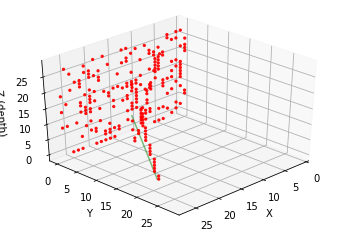

event_0.9_0.2_1.png


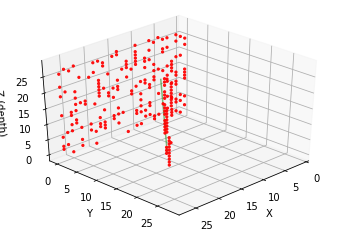

event_0.9_0.2_2.png


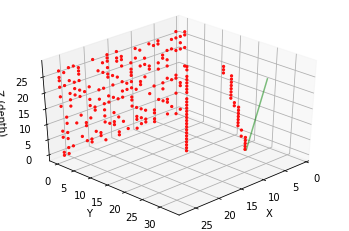

event_0.9_0.2_3.png


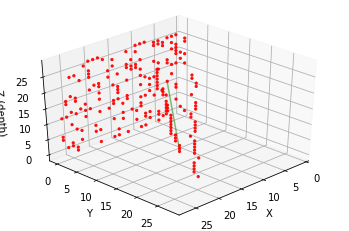

event_0.9_0.2_4.png


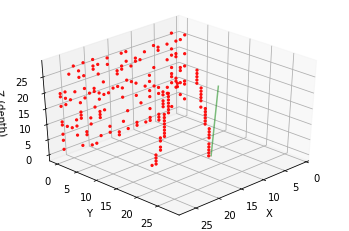

event_0.9_0.2_5.png


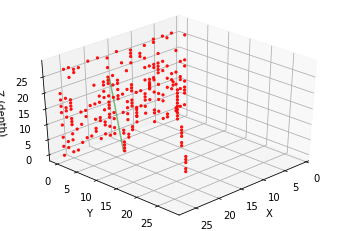

event_0.9_0.2_6.png


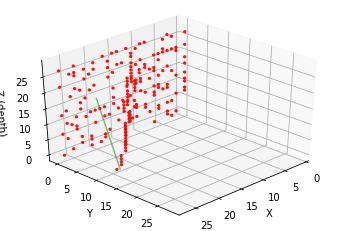

event_0.9_0.2_7.png


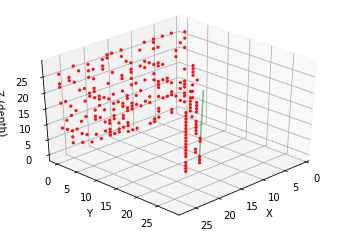

event_0.9_0.2_8.png


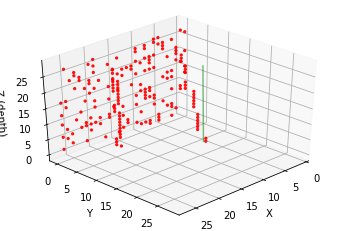

event_0.9_0.2_9.png


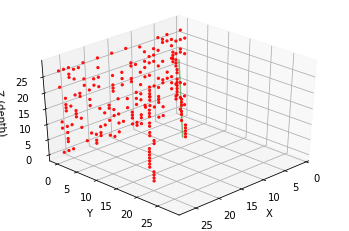

event_0.9_0.2_10.png


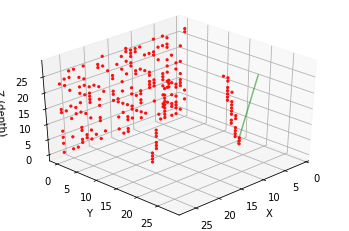

event_0.9_0.2_11.png


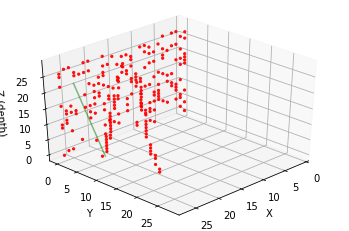

event_0.9_0.2_12.png


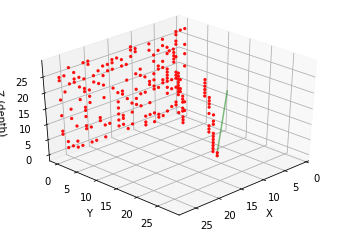

event_0.9_0.2_13.png


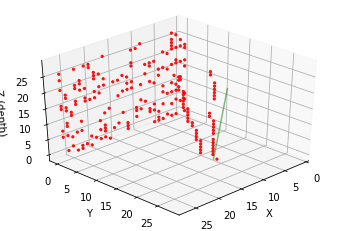

event_0.9_0.2_14.png


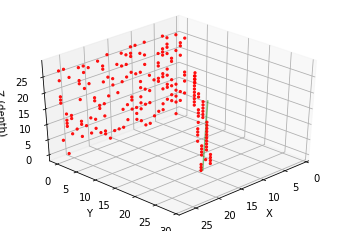

event_0.9_0.2_15.png


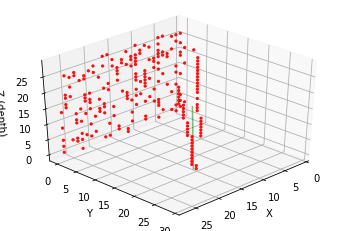

event_0.9_0.2_16.png


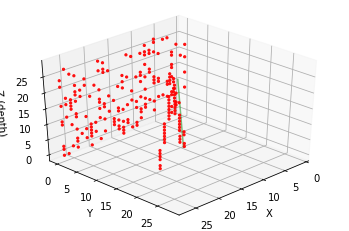

event_0.9_0.2_17.png


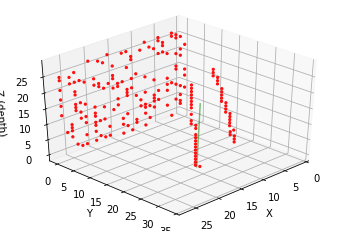

event_0.9_0.2_18.png


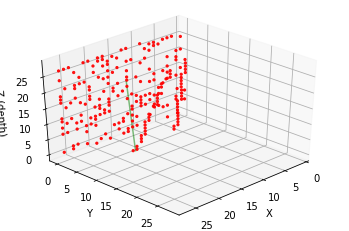

event_0.9_0.2_19.png


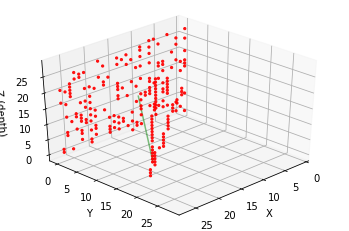

event_0.9_0.2_20.png


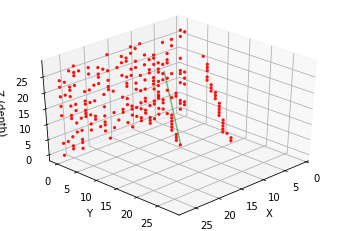

event_0.9_0.2_21.png


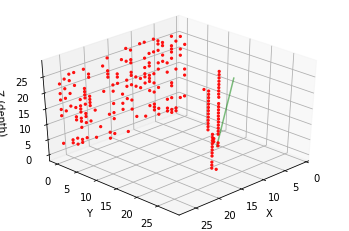

event_0.9_0.2_22.png


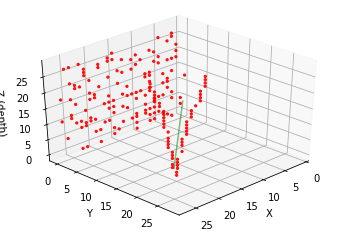

event_0.9_0.2_23.png


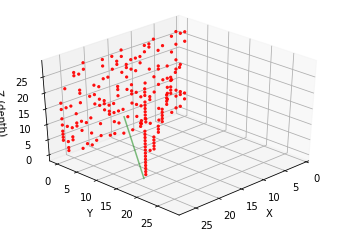

event_0.9_0.2_24.png


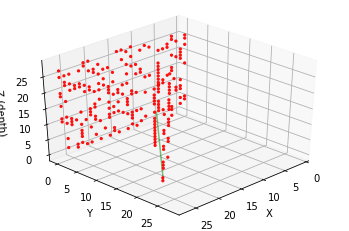

event_0.9_0.2_25.png


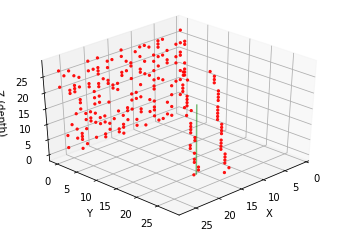

event_0.9_0.2_26.png


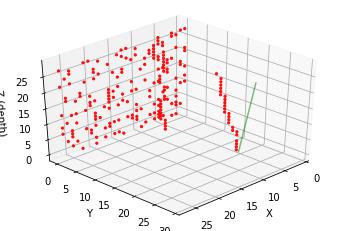

event_0.9_0.2_27.png


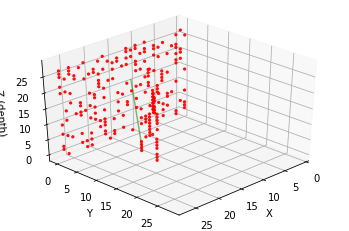

event_0.9_0.2_28.png


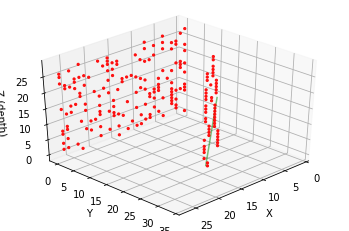

event_0.9_0.2_29.png


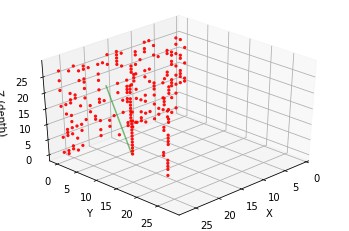

In [0]:
#plot sample events

#for n in range(min(16,len(x_train))):
#  plt.subplot(4, 4, n+1)
#  plt.imshow(x_train[n,0])


for n in range(1):
  for k in range(int(100*(prob_noise+0.10))):
    rnumber = np.random.randint(0,len(x_test))
    x,y,z = x_test[rnumber,0].nonzero()
    from mpl_toolkits.mplot3d import Axes3D
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z, zdir='z', c= 'red', s=5, alpha=0.9)
    
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z (depth)')
  
    
    for j in range(len(y_test[rnumber])):
    # Data for a three-dimensional line
       #print("index ",k,j)
       #print("ytrain ", y_train[rnumber])
      zline = np.linspace(0, 28, 100)
      xline = y_test[rnumber,j,0]*det_width+y_test[rnumber,j,1]*slope_mult*zline 
      yline = y_test[rnumber,j,2]*det_width+y_test[rnumber,j,3]*slope_mult*zline 
###       xline = 100*y_test[rnumber,k,0]+100/slope_scale*y_test[rnumber,k,1]*zline
###       yline = 100*y_test[rnumber,k,2]+100/slope_scale*y_test[rnumber,k,3]*zline
      ax.plot3D(xline, yline, zline,  'green', alpha=0.5)
    
    ax.view_init(elev=35., azim=45)
    ax.scatter([0,det_width],[0,det_width],[0,det_depth], c= 'blue', s=0)

    # set axes range
    ax.set_xlim3d(0,det_width)
    ax.set_xlim3d(0,det_width)
    ax.set_xlim3d(0,det_depth)
    #ax.axis('equal')
    
    print('event_'+str(efficiency)+"_"+str(prob_noise)+"_"+str(k)+'.png')
    plt.savefig('event_'+str(efficiency)+"_"+str(prob_noise)+"_"+str(k)+'.png')
    plt.show()
  
#  plt.imshow(x_train[np.random.randint(0,len(x_train)),0])
#  plt.show()
#   plt.savefig('event.png')
#plt.clf()





#for i in range(img_rows):
#    print (" ")
#    for j in range (img_cols):
#        print (x_train[0,0,i,j], end=' ')
#print (" ")
#print ("y_train[0] = ",y_train[0])
#print ("y_test[0] = ",y_test[0])


# convert class vectors to binary class matrices
#y_train = keras.utils.to_categorical(y_train, num_classes)
#y_test = keras.utils.to_categorical(y_test, num_classes)
#print ("Class = ",y_train[0])



#sys.exit("Stopping here")



In [0]:
#printing TPU information

if 'COLAB_TPU_ADDR' not in os.environ:
  print('ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!')
else:
  tpu_address = 'grpc://' + os.environ['COLAB_TPU_ADDR']
  print ('TPU address is', tpu_address)

  with tf.Session(tpu_address) as session:
    devices = session.list_devices()
    
  print('TPU devices:')
  pprint.pprint(devices)

ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!


input_shape  (1, 28, 28)
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
[<tf.Tensor 'reshape/Reshape:0' shape=(?, 28, 28, 1) dtype=float32>, <tf.Tensor 'conv2d/Relu:0' shape=(?, 26, 26, 32) dtype=float32>, <tf.Tensor 'conv2d_1/Relu:0' shape=(?, 24, 24, 32) dtype=float32>, <tf.Tensor 'conv2d_2/Relu:0' shape=(?, 22, 22, 32) dtype=float32>, <tf.Tensor 'max_pooling2d/MaxPool:0' shape=(?, 11, 11, 32) dtype=float32>, <tf.Tensor 'conv2d_3/Relu:0' shape=(?, 9, 9, 128) dtype=float32>, <tf.Tensor 'conv2d_4/Relu:0' shape=(?, 7, 7, 128) dtype=float32>, <tf.Tensor 'conv2d_5/Relu:0' shape=(?, 5, 5, 128) dtype=float32>, <tf.Tensor 'dropout/cond/Merge:0' shape=(?, 5, 5, 128) dtype=float32>, <tf.Tensor 'flatten/Reshape:0' shape=(?, 3200) dtype=float32>, <tf.Tensor 'dense/Relu:0' shape=(?, 400) dtype=float32>, <tf.Tensor 'dense_1/BiasAdd:0' shape=(?, 400) dtype=float32>, <tf.Tensor 'mdn_1/MDN/mdn_outputs/concat:0' shape=(?, 15) dtype=float32>]
Model: "sequential"
______

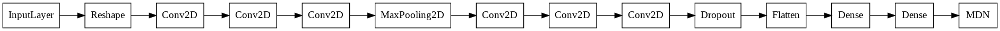

event_0.9_0.2_0.png   event_0.9_0.2_1.png   event_0.9_0.2_2.png
event_0.9_0.2_10.png  event_0.9_0.2_20.png  event_0.9_0.2_3.png
event_0.9_0.2_11.png  event_0.9_0.2_21.png  event_0.9_0.2_4.png
event_0.9_0.2_12.png  event_0.9_0.2_22.png  event_0.9_0.2_5.png
event_0.9_0.2_13.png  event_0.9_0.2_23.png  event_0.9_0.2_6.png
event_0.9_0.2_14.png  event_0.9_0.2_24.png  event_0.9_0.2_7.png
event_0.9_0.2_15.png  event_0.9_0.2_25.png  event_0.9_0.2_8.png
event_0.9_0.2_16.png  event_0.9_0.2_26.png  event_0.9_0.2_9.png
event_0.9_0.2_17.png  event_0.9_0.2_27.png  model.png
event_0.9_0.2_18.png  event_0.9_0.2_28.png  sample_data
event_0.9_0.2_19.png  event_0.9_0.2_29.png
Model shown
           OPERATION           DATA DIMENSIONS   WEIGHTS(N)   WEIGHTS(%)

               Input   #####      1   28   28
             Reshape     |   -------------------         0     0.0%
                       #####     28   28    1
              Conv2D    \|/  -------------------       320     0.0%
                relu 

In [0]:



start_training_time = time.time()

# if 'COLAB_TPU_ADDR' not in os.environ:

#   model = Sequential()
#   input_shape=(1,det_width, det_width, det_depth)

#   print("input_shape ",input_shape)

#   model.add(Reshape((det_width, det_width, det_depth,1),
#                                   input_shape=input_shape))
#   model.add(Conv3D(32, (3, 3, 3), activation='relu'))  #8
#   model.add(Conv3D(32, (3, 3, 3), activation='relu'))  #8
# #  model.add(Conv3D(32, (3, 3, 3), activation='relu'))  #added
#   model.add(MaxPooling3D(pool_size=(2, 2, 2)))
#   model.add(Conv3D(128, (3, 3, 3), activation='relu'))  #32
#   model.add(Conv3D(128, (3, 3, 3), activation='relu'))  #32
# #  model.add(Conv3D(128, (3, 3, 3), activation='relu'))  #added
#   model.add(Dropout(0.25))
#   model.add(Flatten())
#   model.add(Dense(400, activation='relu'))  # 400
# #  model.add(Dense(400))  # added
#   #model.add(Dropout(0.5))
#   #model.add(Dense(2, activation='tanh'))


#   model.add(RepeatVector(max_tracks))
#   model.add(LSTM(400, return_sequences=True))
#   model.add(TimeDistributed(Dense(4)))

#   # model.add(Flatten(input_shape=input_shape))
#   # #model.add(Reshape(input_shape - (1, ), input_shape=input_shape))
#   # model.add(Dense(32, activation='relu'))
#   # model.add(Dense(32, activation='relu'))
#   # model.add(Dense(32, activation='relu'))
#   # model.add(Dense(32, activation='relu'))
#   # #model.add(Dense(32, activation='relu'))
#   # #model.add(Dense(32, activation='relu'))
#   # model.add(Dropout(0.5))
#   # model.add(Dense(2, activation='tanh'))


#   #model.add(Reshape((1, 2),input_shape=(2,)))
#   model.add(Reshape((max_tracks, 4),input_shape=(4*max_tracks,)))

# else:
  ###stara sieć###
#   model = tf.keras.layers.Sequential()
#   input_shape=(1,det_width, det_width, det_depth)

#   print("input_shape ",input_shape)

#   model.add(Reshape((det_width, det_width, det_depth,1),
#                                   input_shape=input_shape))
#   model.add(Conv3D(32, (3, 3, 3), activation='relu'))  #8
#   model.add(tf.keras.layers.Conv3D(32, (3, 3, 3), activation='relu'))  #8
#   model.add(tf.keras.layers.Conv3D(32, (3, 3, 3), activation='relu'))  #added
#   model.add(tf.keras.layers.MaxPooling3D(pool_size=(2, 2, 2)))
#   model.add(tf.keras.layers.Conv3D(128, (3, 3, 3), activation='relu'))  #32
#   model.add(tf.keras.layers.Conv3D(128, (3, 3, 3), activation='relu'))  #32
#   model.add(tf.keras.layers.Conv3D(128, (3, 3, 3), activation='relu'))  #added
#   model.add(tf.keras.layers.Dropout(0.25))
#   model.add(tf.keras.layers.Flatten())
#   model.add(tf.keras.layers.Dense(400, activation='relu'))  # 400
#   model.add(tf.keras.layers.Dense(400))  # added
#   #model.add(Dropout(0.5))
#   #model.add(Dense(2, activation='tanh'))


#   model.add(tf.keras.layers.RepeatVector(max_tracks))
#   model.add(tf.keras.layers.LSTM(400, return_sequences=True))
#   model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(4)))

#   # model.add(Flatten(input_shape=input_shape))
#   # #model.add(Reshape(input_shape - (1, ), input_shape=input_shape))
#   # model.add(Dense(32, activation='relu'))
#   # model.add(Dense(32, activation='relu'))
#   # model.add(Dense(32, activation='relu'))
#   # model.add(Dense(32, activation='relu'))
#   # #model.add(Dense(32, activation='relu'))
#   # #model.add(Dense(32, activation='relu'))
#   # model.add(Dropout(0.5))
#   # model.add(Dense(2, activation='tanh'))p


#   #model.add(Reshape((1, 2),input_shape=(2,)))
#   model.add(tf.keras.layers.Reshape((max_tracks, 4),input_shape=(4*max_tracks,)))  

    ###zmiana na 2D###

model = keras.models.Sequential()
input_shape=(1,det_width, det_depth)

print("input_shape ",input_shape)

model.add(keras.layers.Reshape((det_width, det_depth,1),
                                input_shape=input_shape))
model.add(keras.layers.Conv2D(32, (3, 3), activation='relu'))  #8
model.add(keras.layers.Conv2D(32, (3, 3), activation='relu'))  #8
model.add(keras.layers.Conv2D(32, (3, 3), activation='relu'))  #added
model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
model.add(keras.layers.Conv2D(128, (3, 3), activation='relu'))  #32
model.add(keras.layers.Conv2D(128, (3, 3), activation='relu'))  #32
model.add(keras.layers.Conv2D(128, (3, 3), activation='relu'))  #added
model.add(keras.layers.Dropout(0.25))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(400, activation='relu'))  # 400
model.add(keras.layers.Dense(400))  # added
#model.add(Dropout(0.2))
#model.add(Dense(2, activation='tanh'))


#model.add(RepeatVector(max_tracks))
#model.add(LSTM(400, return_sequences=True))
# model.add(TimeDistributed(Dense(2)))
#model.add(TimeDistributed(mdn.MDN(mdn_out,mdn_mix)))

model.add(mdn.MDN(mdn_out,mdn_mix))

# model.add(Flatten(input_shape=input_shape))
# #model.add(Reshape(input_shape - (1, ), input_shape=input_shape))
# model.add(Dense(32, activation='relu'))
# model.add(Dense(32, activation='relu'))
# model.add(Dense(32, activation='relu'))
# model.add(Dense(32, activation='relu'))
# #model.add(Dense(32, activation='relu'))
# #model.add(Dense(32, activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(2, activation='tanh'))


#model.add(Reshape((1, 2),input_shape=(2,)))
#model.add(Reshape((max_tracks, 2),input_shape=(2*max_tracks,)))  

  
  

# print outputs for each layer
outputs =  [layer.output for layer in model.layers]
print (outputs)
print (model.summary())

print ("plotting model")
plot_model(model, to_file='model.png',rankdir='LR',show_shapes=False,show_layer_names=False )  ###, show_shapes=True

print ("Showing model")
from IPython.display import Image
display(Image(filename='model.png'))
!ls
print ("Model shown")

#sys.exit("Stopping here")



'''
    Converts a Keras model to dot format and save to a file.
    # Arguments
        model: A Keras model instance
        to_file: File name of the plot image.
        show_shapes: whether to display shape information.
        show_layer_names: whether to display layer names.
        rankdir: `rankdir` argument passed to PyDot,
            a string specifying the format of the plot:
            'TB' creates a vertical plot;
            'LR' creates a horizontal plot.
        expand_nested: whether to expand nested models into clusters.
        dpi: dot DPI.
'''

# Vizualizing model structure

sequential_model_to_ascii_printout(model)




In [0]:


#using TPU model!!!
# This address identifies the TPU we'll use when configuring TensorFlow.


# if 'COLAB_TPU_ADDR'  in os.environ:  
#   TPU_WORKER = 'grpc://' + os.environ['COLAB_TPU_ADDR']
#   tf.logging.set_verbosity(tf.logging.INFO)

#   model = tf.contrib.tpu.keras_to_tpu_model(
#      model,
#      strategy=tf.contrib.tpu.TPUDistributionStrategy(
#         tf.contrib.cluster_resolver.TPUClusterResolver(TPU_WORKER)))

#   model.compile(optimizer=tf.train.AdamOptimizer(), loss='mse')
# else:


#  model.compile(
#      optimizer=Adam(lr=0.001, beta_1=0.9, beta_2=0.999, 
#                                      epsilon=1e-8), loss='mse')
#  rms = RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.1)
#  model.compile(optimizer=rms, loss='mse')
#  model.compile(optimizer='Adam', loss='mean_squared_error')
  model.compile(optimizer='Adam', loss=mdn.get_mixture_loss_func(mdn_out,mdn_mix))

#model.compile(optimizer=tf.train.AdamOptimizer(), loss='mse')
#model.compile(loss='mean_squared_error', optimizer='Adam')

#model.compile(loss=keras.losses.categorical_crossentropy,
#              optimizer=keras.optimizers.Adadelta(),
#              metrics=['accuracy'])


Instructions for updating:
The `event_size` property is deprecated.  Use `num_categories` instead.  They have the same value, but `event_size` is misnamed.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/64
16/16 [==============================] - 13s 787ms/step - loss: 28.0288
Epoch 2/64
16/16 [==============================] - 5s 294ms/step - loss: 0.0106
Epoch 3/64
16/16 [==============================] - 5s 294ms/step - loss: -0.6351
Epoch 4/64
16/16 [==============================] - 5s 292ms/step - loss: -0.7835
Epoch 5/64
16/16 [==============================] - 5s 290ms/step - loss: -0.8634
Epoch 6/64
16/16 [==============================] - 5s 294ms/step - loss: -0.8982
Epoch 7/64
16/16 [==============================] - 5s 292ms/step - loss: -0.9679
Epoch 8/64
16/16 [==============================] - 5s 292ms/step - loss: -1.0848
Epoch 9/64
16/16 [==============================] - 5s 288ms/step - loss: -1.1781
Epoch 10/64
16/16 [==============================] - 5s 286ms/step - loss: -1.2142
Epoch 11/64
16/16 [==============================] - 5s 291ms/step - loss: -1.2082
Epoch 12/64
16/16 [==============================] - 5s 290ms/step - loss: -1.3236
Epoch 13/64
1

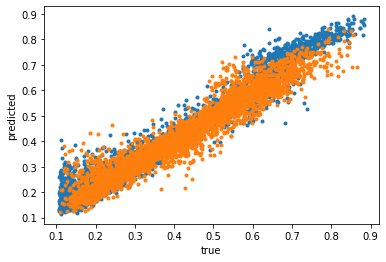

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:655: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:675: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


mu, std:  0.34613482006669327 0.7855160812163269
new_diff_0:  [-0.05317465  1.15608085 -0.12322466 ...  0.99450864  0.08952416
  0.34440005]
new mu, std:  0.3349535073480612 0.7245497225778488
bins_proposed: 87.7142678153862
mu, std:  0.06575331069298854 0.9462370916956943
new_diff_1:  [ 0.81313271 -2.236431    0.48568924 ... -1.08421453 -0.00682601
  0.99953932]
bins_proposed: 82.76628566523894
params_1_0.9_0.3.png


<Figure size 432x288 with 0 Axes>

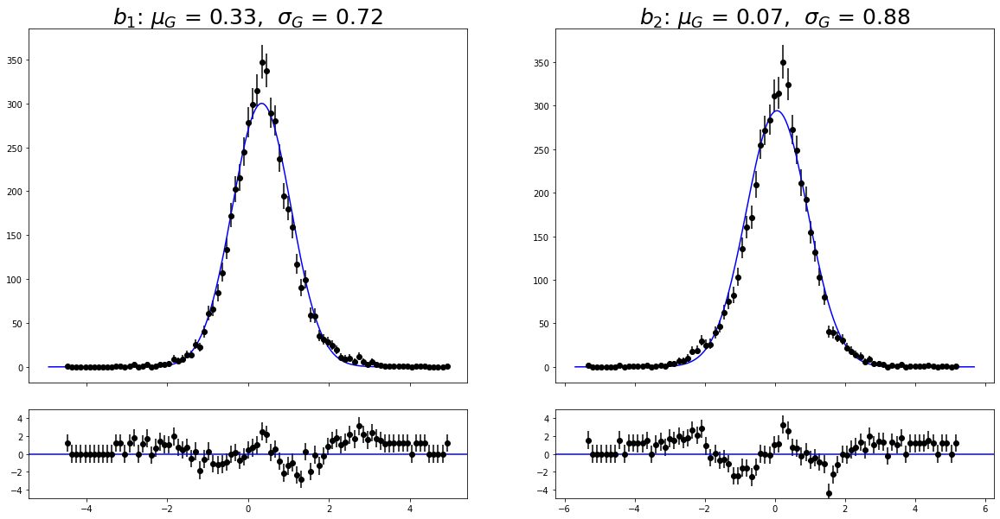

Plot events with predicted tracks, efficiency, prob_noise =  0.9 0.3
y_new shape ::  (5000, 15)
event_res_0.9_0.3_0.png


<Figure size 432x288 with 0 Axes>

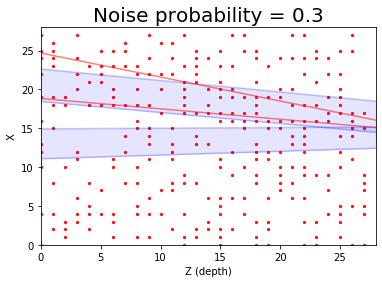

event_res_0.9_0.3_1.png


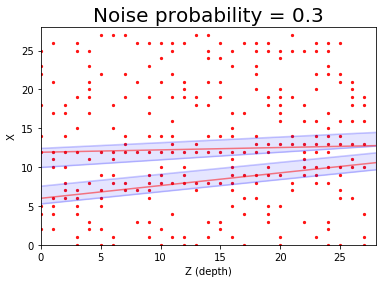

event_res_0.9_0.3_2.png


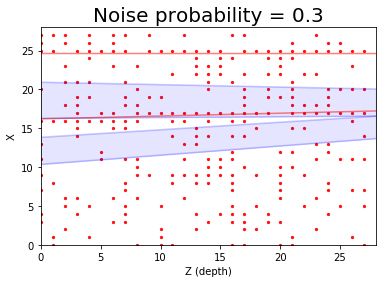

event_res_0.9_0.3_3.png


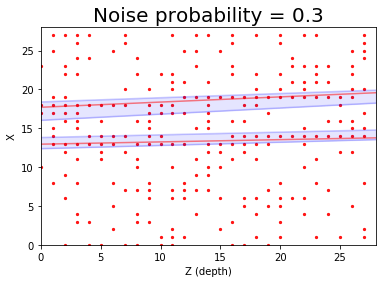

event_res_0.9_0.3_4.png


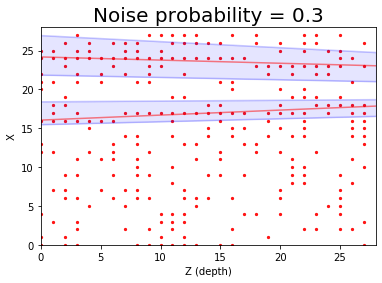

event_res_0.9_0.3_5.png


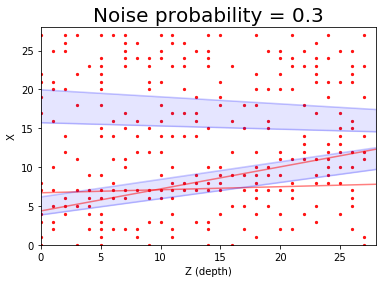

event_res_0.9_0.3_6.png


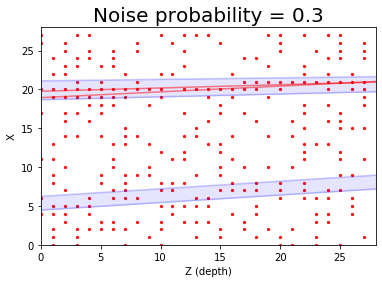

event_res_0.9_0.3_7.png


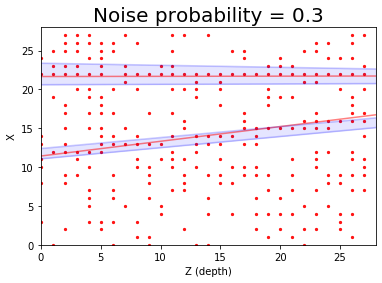

event_res_0.9_0.3_8.png


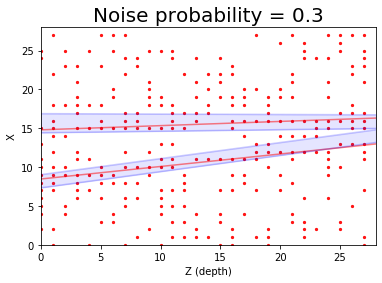

event_res_0.9_0.3_9.png


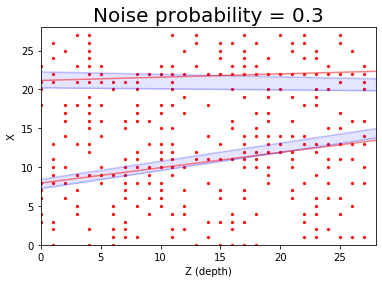

event_res_0.9_0.3_10.png


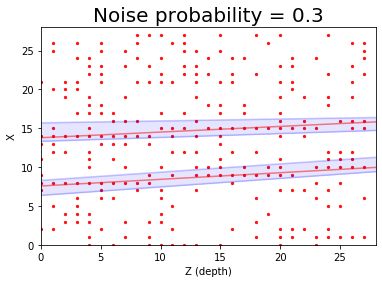

event_res_0.9_0.3_11.png


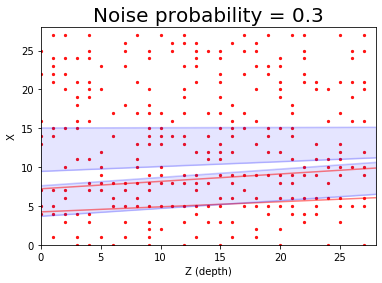

event_res_0.9_0.3_12.png


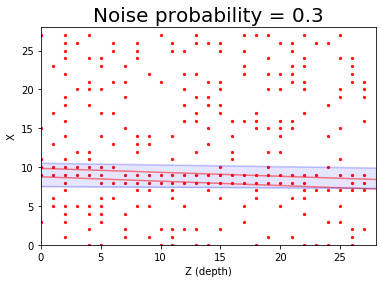

event_res_0.9_0.3_13.png


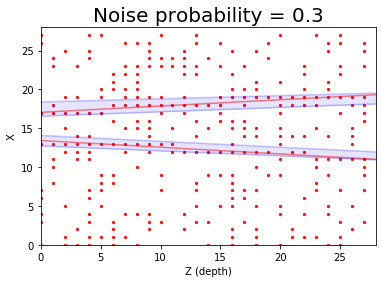

event_res_0.9_0.3_14.png


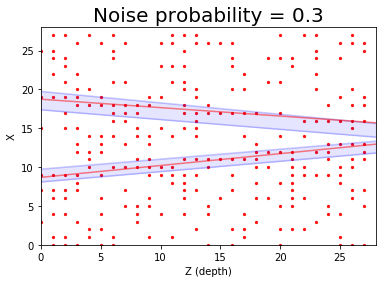

event_res_0.9_0.3_15.png


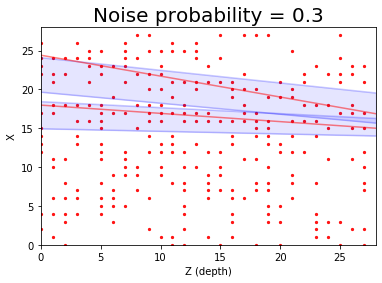

event_res_0.9_0.3_16.png


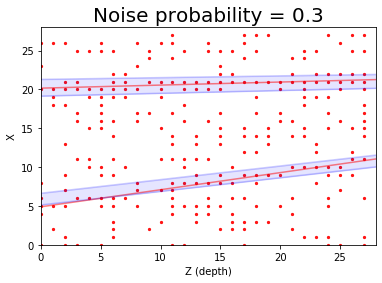

event_res_0.9_0.3_17.png


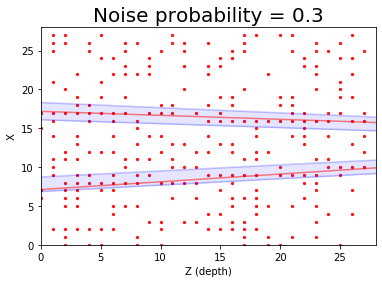

event_res_0.9_0.3_18.png


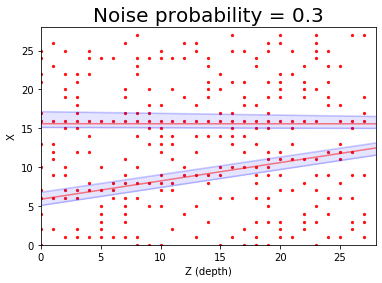

event_res_0.9_0.3_19.png


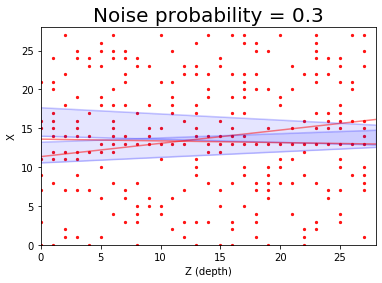

event_res_0.9_0.3_20.png


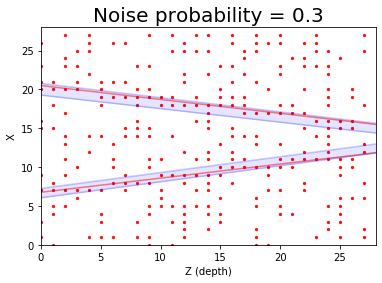

event_res_0.9_0.3_21.png


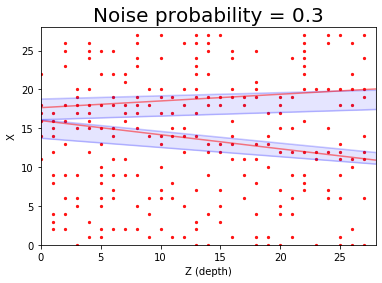

event_res_0.9_0.3_22.png


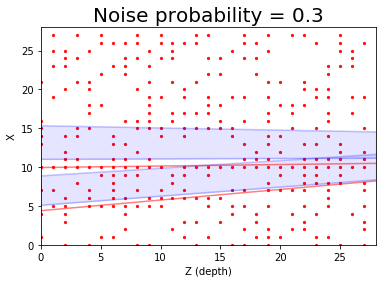

event_res_0.9_0.3_23.png


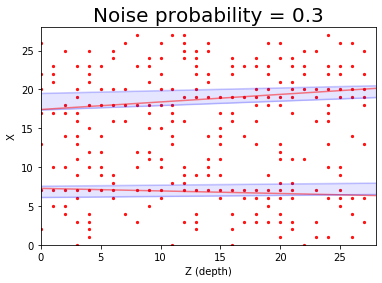

event_res_0.9_0.3_24.png


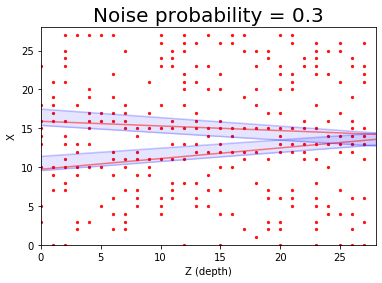

event_res_0.9_0.3_25.png


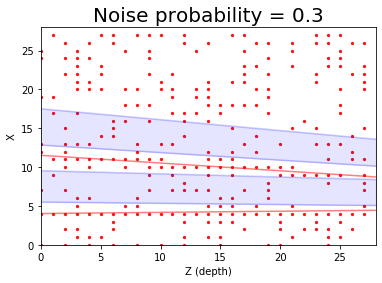

event_res_0.9_0.3_26.png


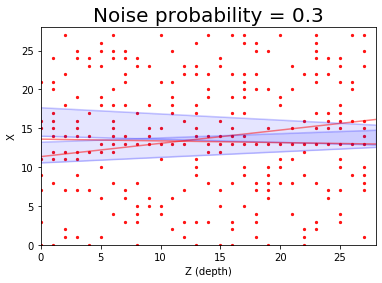

event_res_0.9_0.3_27.png


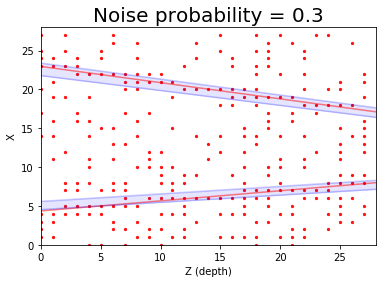

event_res_0.9_0.3_28.png


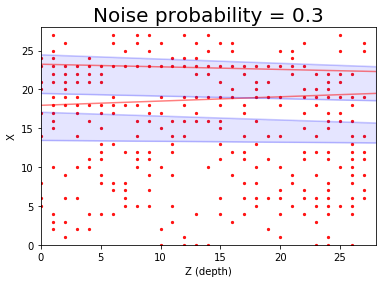

event_res_0.9_0.3_29.png


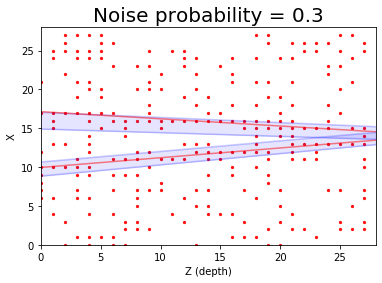

event_res_0.9_0.3_30.png


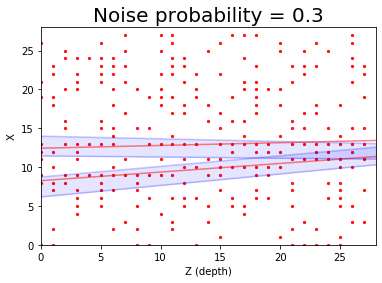

event_res_0.9_0.3_31.png


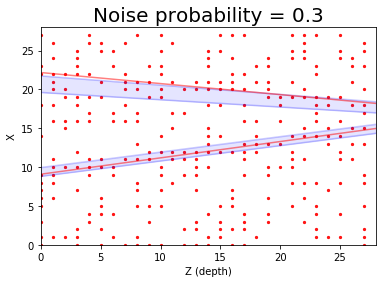

event_res_0.9_0.3_32.png


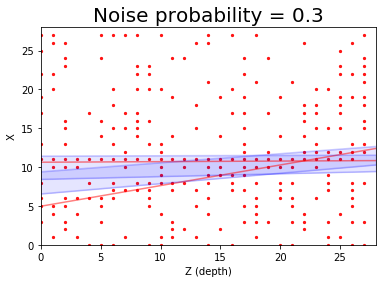

event_res_0.9_0.3_33.png


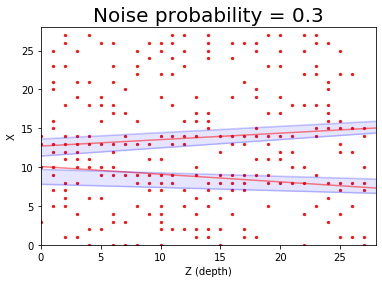

event_res_0.9_0.3_34.png


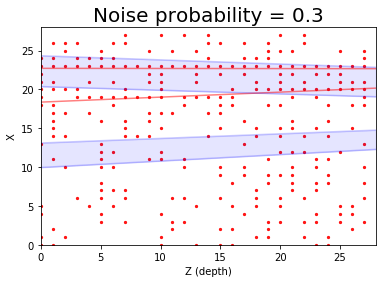

event_res_0.9_0.3_35.png


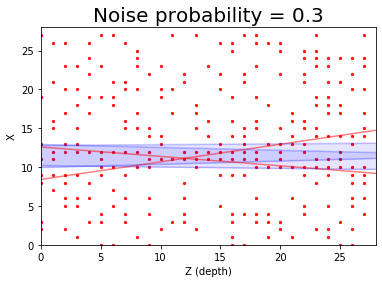

event_res_0.9_0.3_36.png


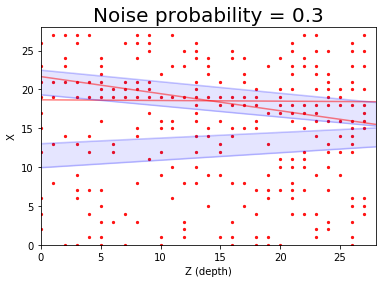

event_res_0.9_0.3_37.png


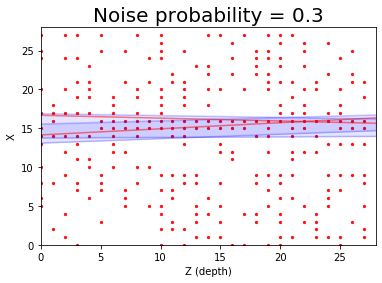

event_res_0.9_0.3_38.png


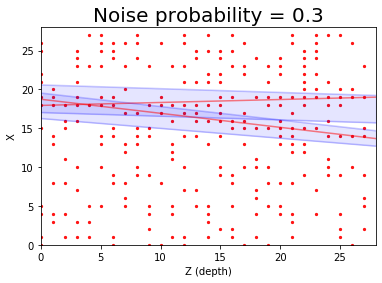

event_res_0.9_0.3_39.png


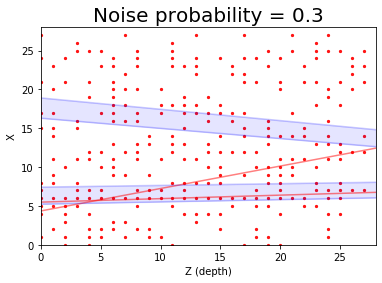

event_res_0.9_0.3_0.png


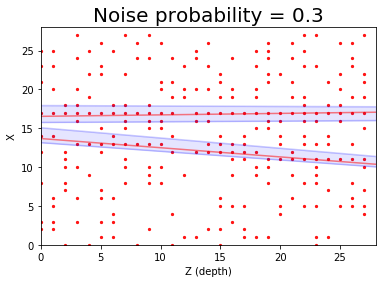

event_res_0.9_0.3_1.png


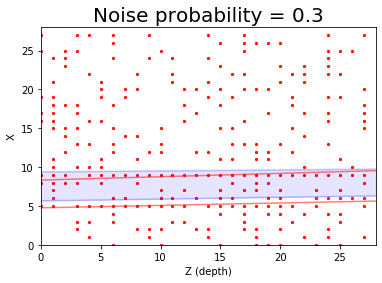

event_res_0.9_0.3_2.png


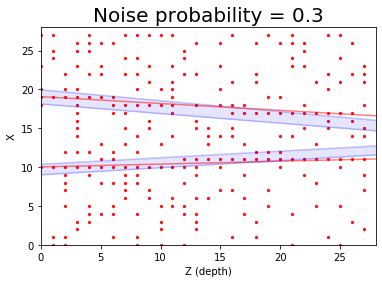

event_res_0.9_0.3_3.png


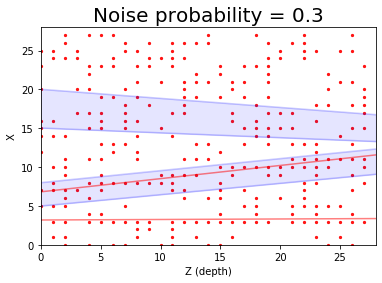

event_res_0.9_0.3_4.png


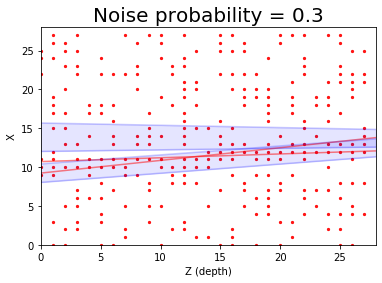

event_res_0.9_0.3_5.png


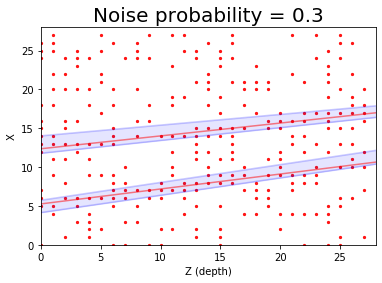

event_res_0.9_0.3_6.png


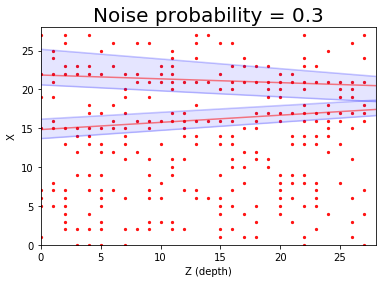

event_res_0.9_0.3_7.png


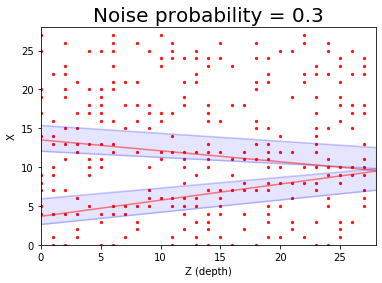

event_res_0.9_0.3_8.png


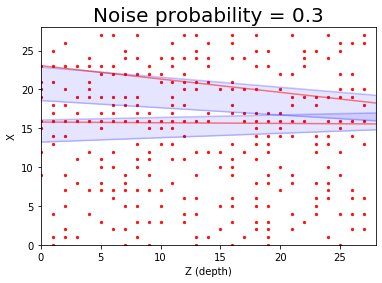

event_res_0.9_0.3_9.png


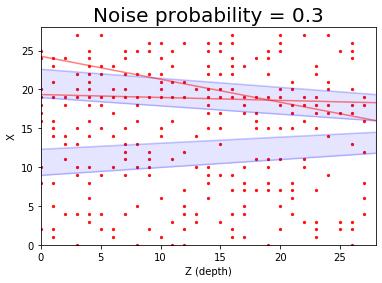

event_res_0.9_0.3_10.png


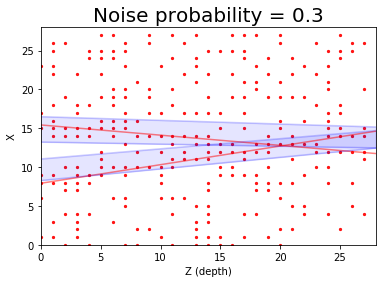

event_res_0.9_0.3_11.png


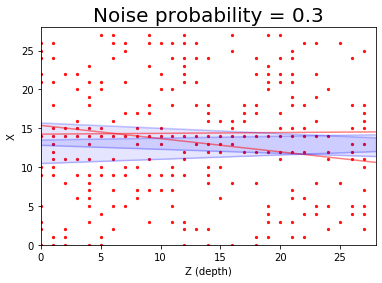

event_res_0.9_0.3_12.png


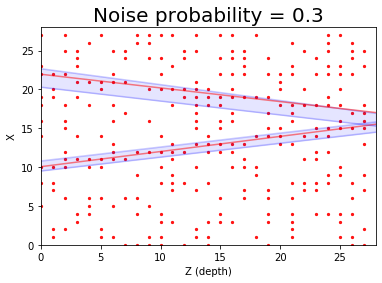

event_res_0.9_0.3_13.png


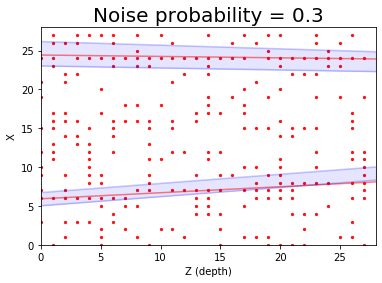

event_res_0.9_0.3_14.png


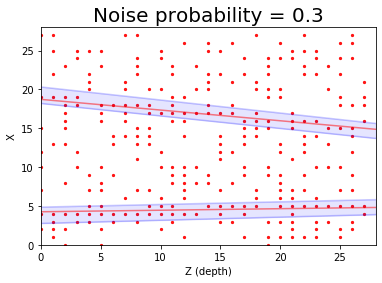

event_res_0.9_0.3_15.png


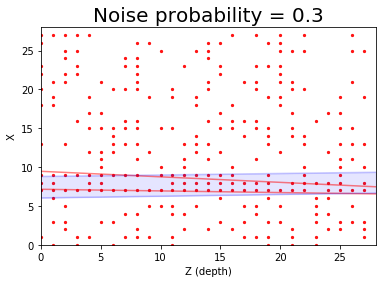

event_res_0.9_0.3_16.png


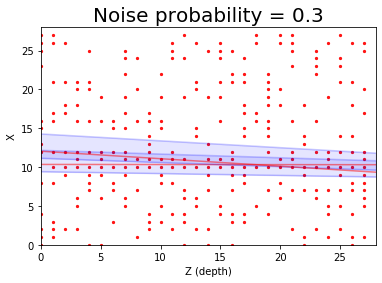

event_res_0.9_0.3_17.png


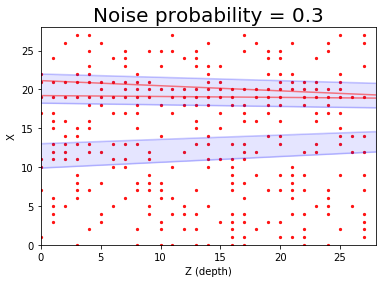

event_res_0.9_0.3_18.png


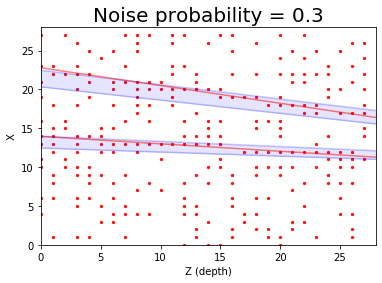

event_res_0.9_0.3_19.png


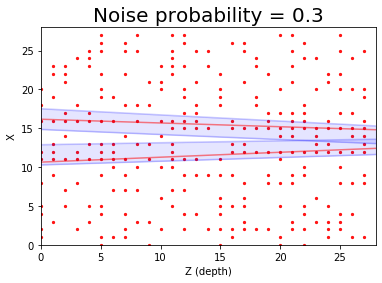

event_res_0.9_0.3_20.png


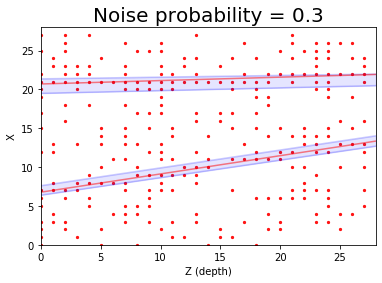

event_res_0.9_0.3_21.png


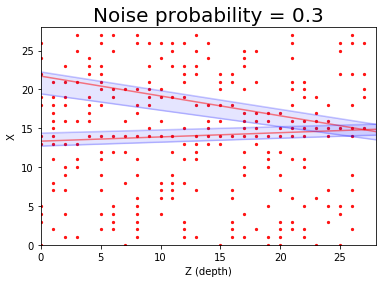

event_res_0.9_0.3_22.png


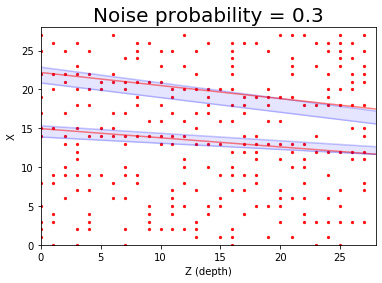

event_res_0.9_0.3_23.png


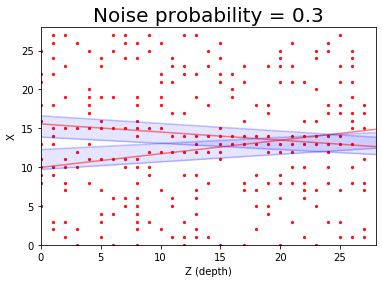

event_res_0.9_0.3_24.png


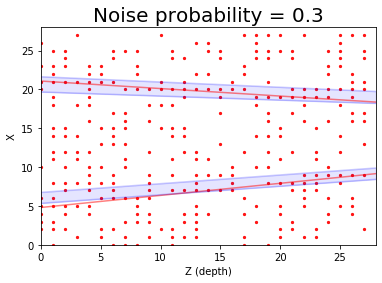

event_res_0.9_0.3_25.png


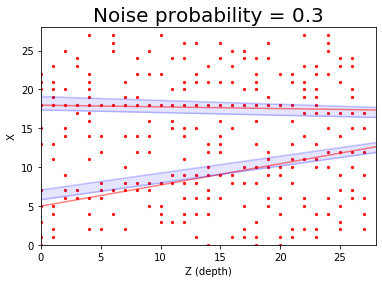

event_res_0.9_0.3_26.png


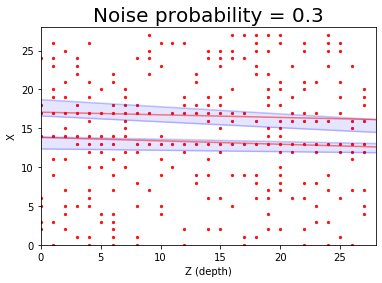

event_res_0.9_0.3_27.png


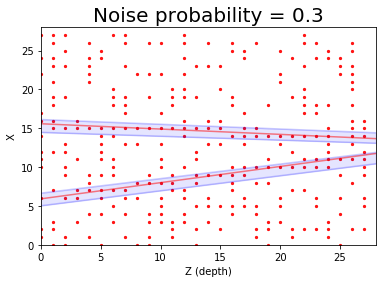

event_res_0.9_0.3_28.png


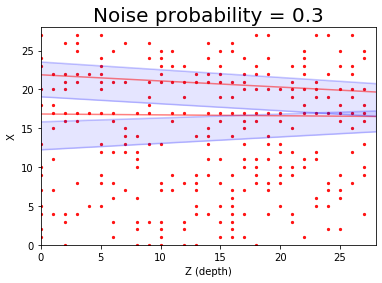

event_res_0.9_0.3_29.png


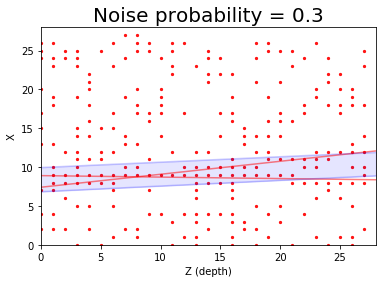

event_res_0.9_0.3_30.png


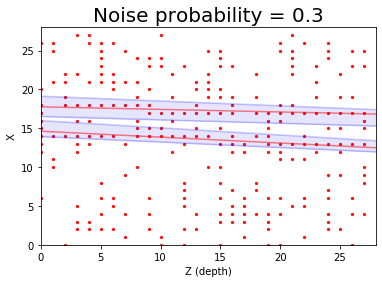

event_res_0.9_0.3_31.png


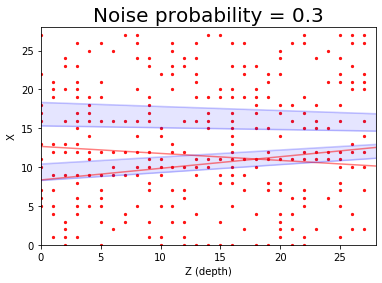

event_res_0.9_0.3_32.png


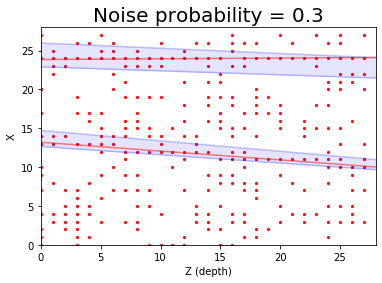

event_res_0.9_0.3_33.png


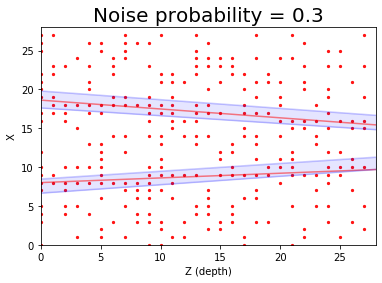

event_res_0.9_0.3_34.png


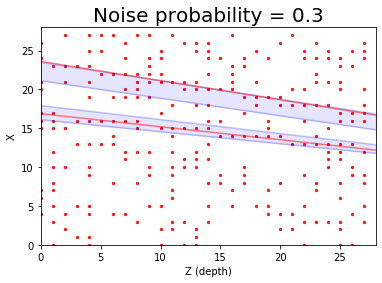

event_res_0.9_0.3_35.png


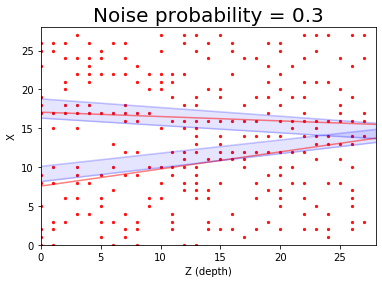

event_res_0.9_0.3_36.png


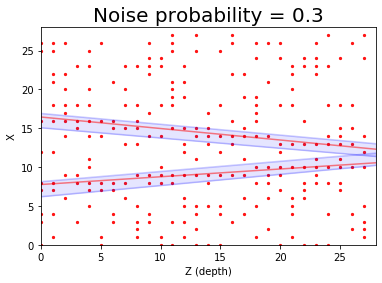

event_res_0.9_0.3_37.png


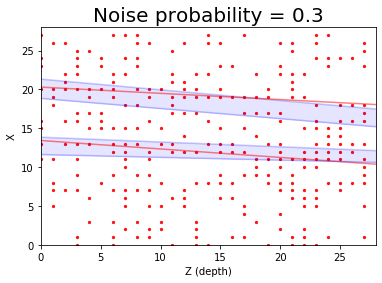

event_res_0.9_0.3_38.png


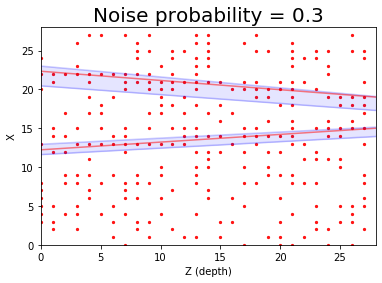

event_res_0.9_0.3_39.png


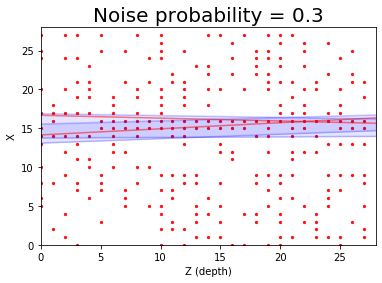

event_res_0.9_0.3_0.png


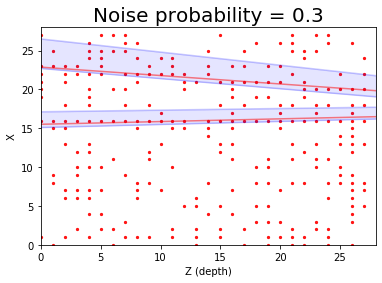

event_res_0.9_0.3_1.png


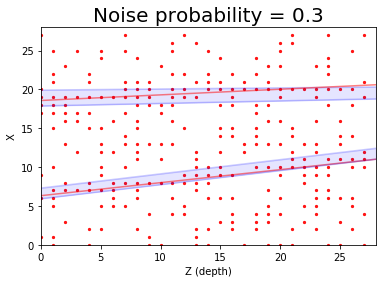

event_res_0.9_0.3_2.png


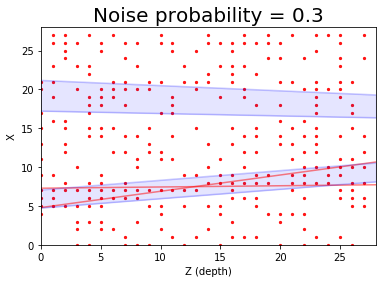

event_res_0.9_0.3_3.png


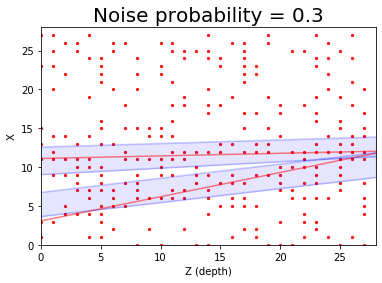

event_res_0.9_0.3_4.png


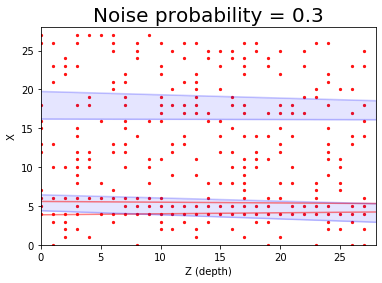

event_res_0.9_0.3_5.png


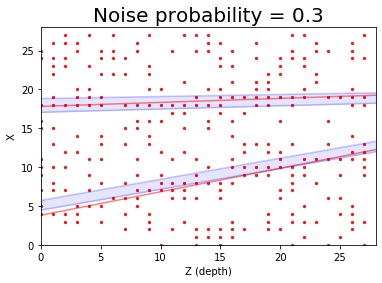

event_res_0.9_0.3_6.png


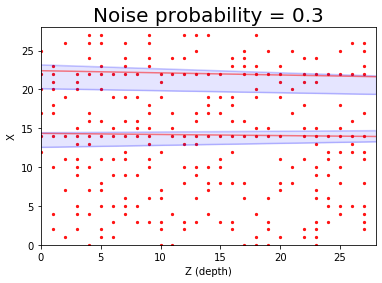

event_res_0.9_0.3_7.png


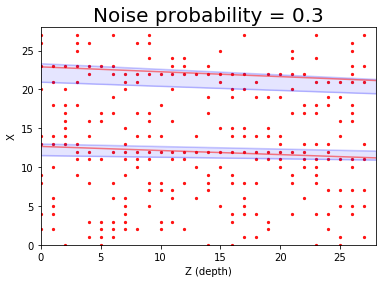

event_res_0.9_0.3_8.png


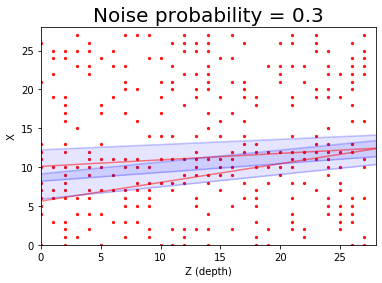

event_res_0.9_0.3_9.png


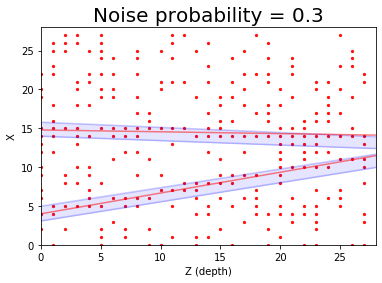

event_res_0.9_0.3_10.png


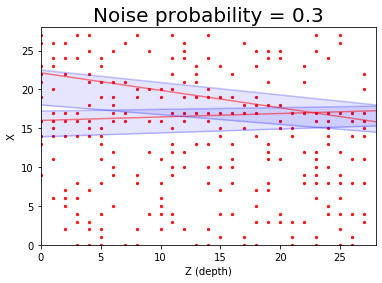

event_res_0.9_0.3_11.png


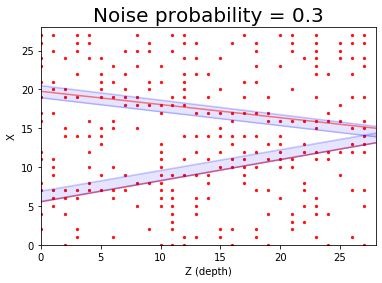

event_res_0.9_0.3_12.png


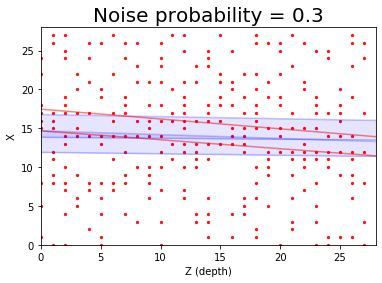

event_res_0.9_0.3_13.png


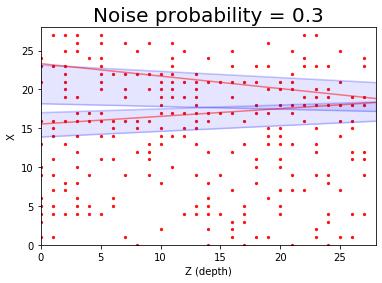

event_res_0.9_0.3_14.png


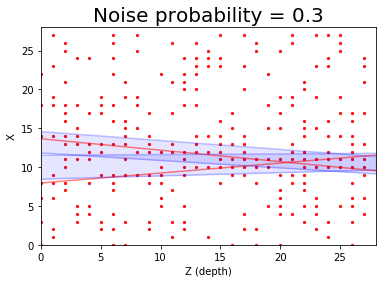

event_res_0.9_0.3_15.png


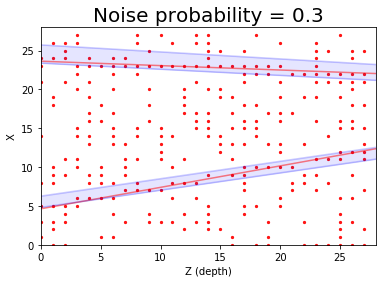

event_res_0.9_0.3_16.png


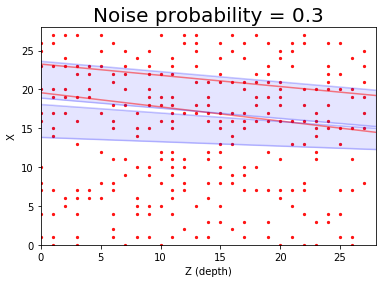

event_res_0.9_0.3_17.png


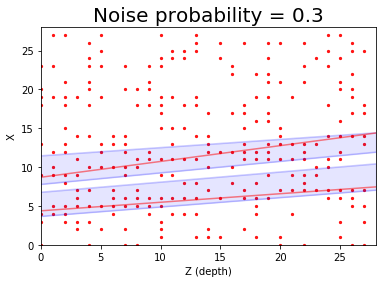

event_res_0.9_0.3_18.png


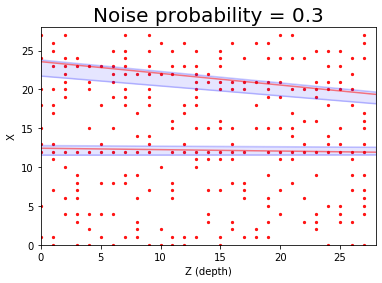

event_res_0.9_0.3_19.png


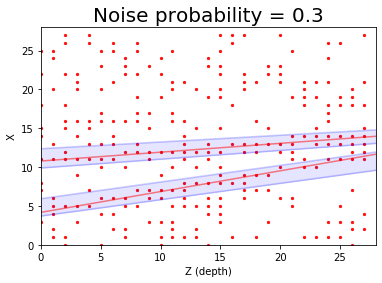

event_res_0.9_0.3_20.png


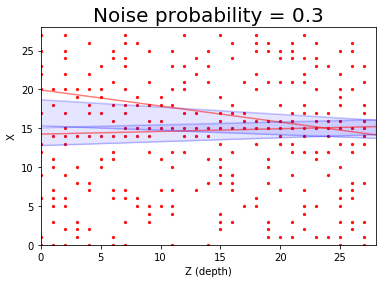

event_res_0.9_0.3_21.png


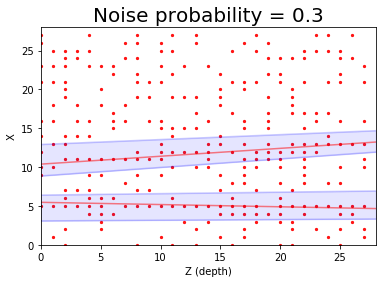

event_res_0.9_0.3_22.png


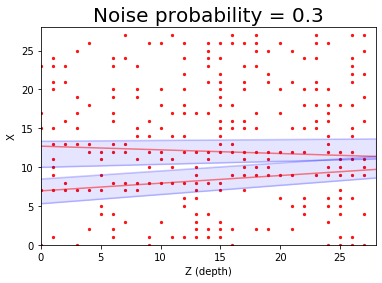

event_res_0.9_0.3_23.png


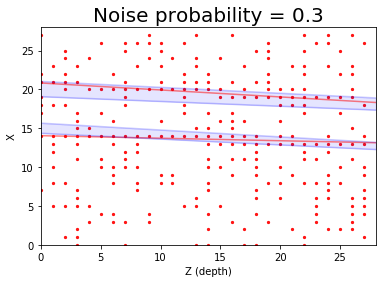

event_res_0.9_0.3_24.png


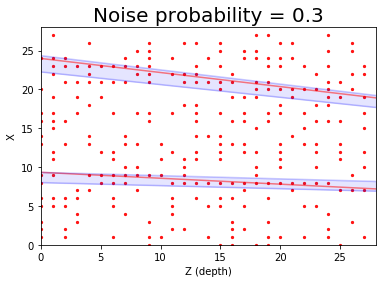

event_res_0.9_0.3_25.png


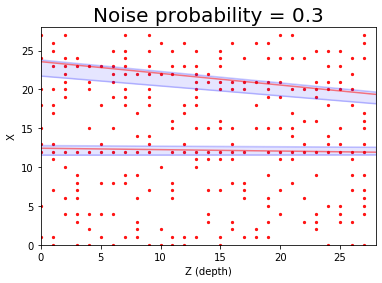

event_res_0.9_0.3_26.png


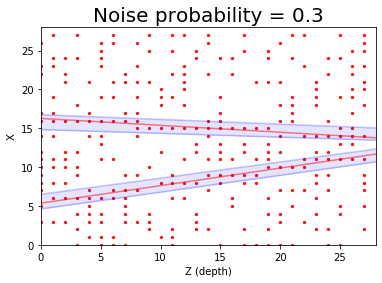

event_res_0.9_0.3_27.png


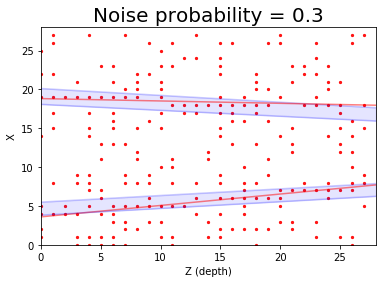

event_res_0.9_0.3_28.png


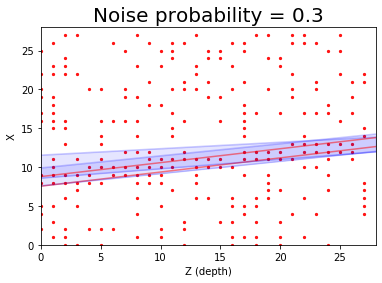

event_res_0.9_0.3_29.png


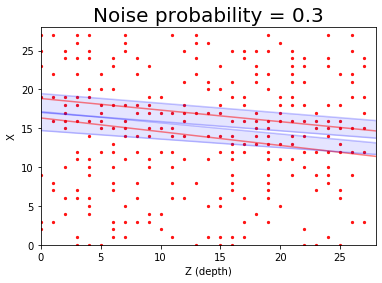

event_res_0.9_0.3_30.png


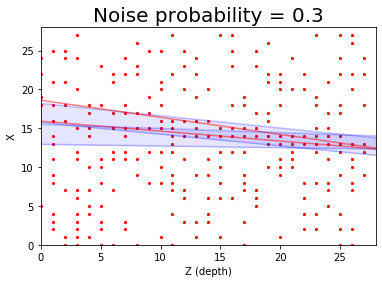

event_res_0.9_0.3_31.png


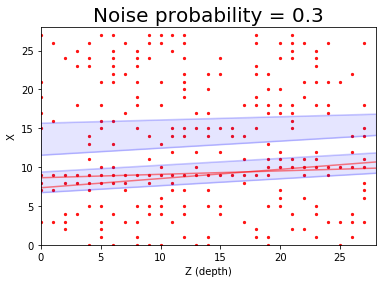

event_res_0.9_0.3_32.png


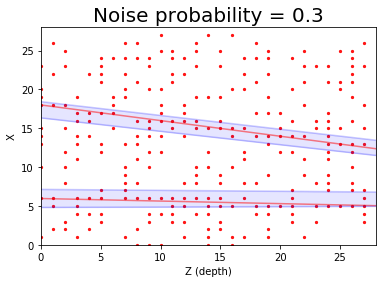

event_res_0.9_0.3_33.png


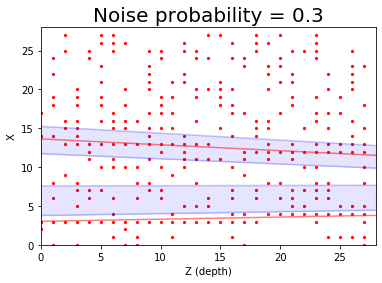

event_res_0.9_0.3_34.png


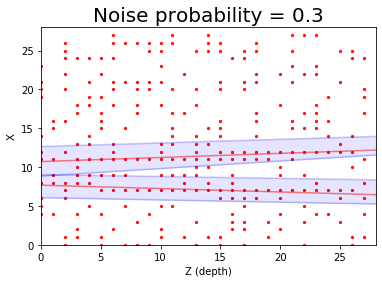

event_res_0.9_0.3_35.png


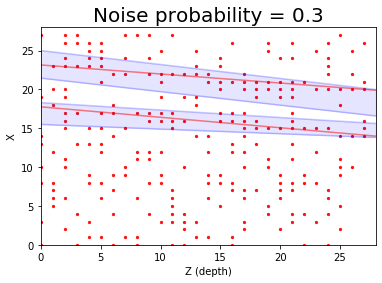

event_res_0.9_0.3_36.png


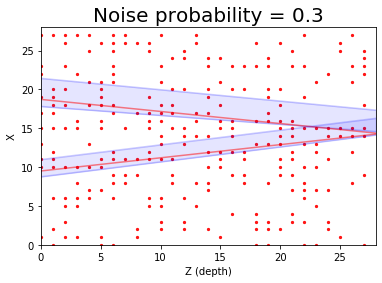

event_res_0.9_0.3_37.png


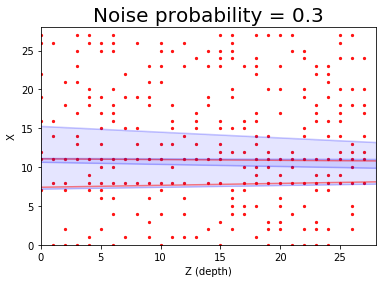

event_res_0.9_0.3_38.png


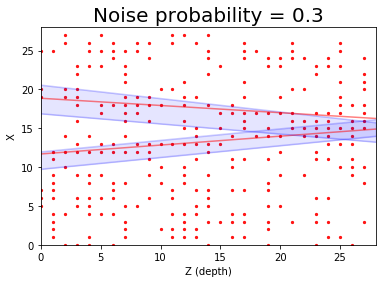

event_res_0.9_0.3_39.png


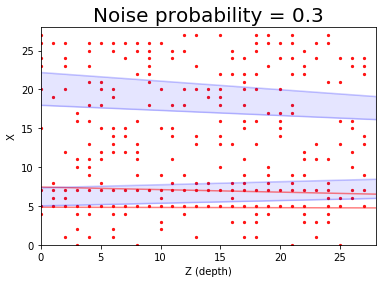

event_res_0.9_0.3_0.png


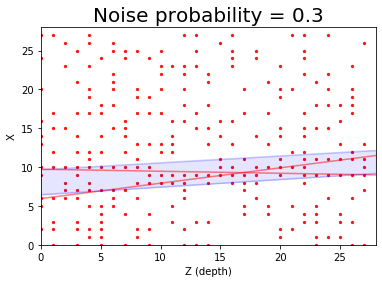

event_res_0.9_0.3_1.png


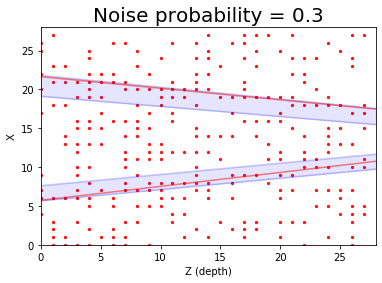

event_res_0.9_0.3_2.png


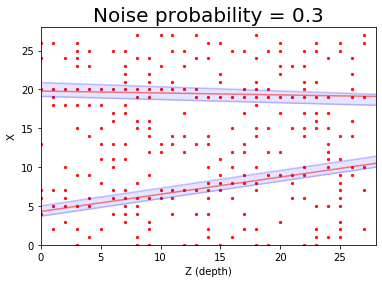

event_res_0.9_0.3_3.png


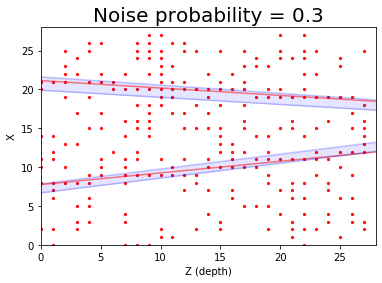

event_res_0.9_0.3_4.png


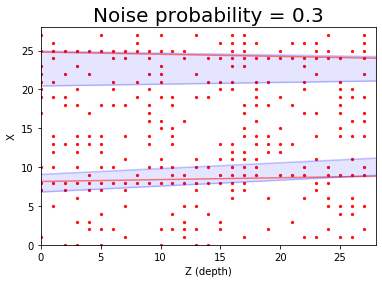

event_res_0.9_0.3_5.png


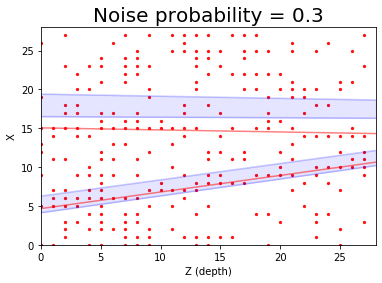

event_res_0.9_0.3_6.png


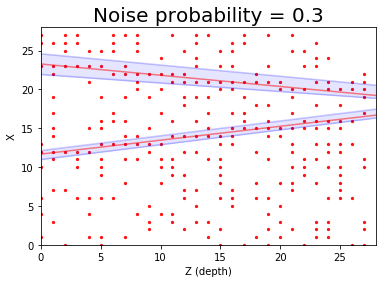

event_res_0.9_0.3_7.png


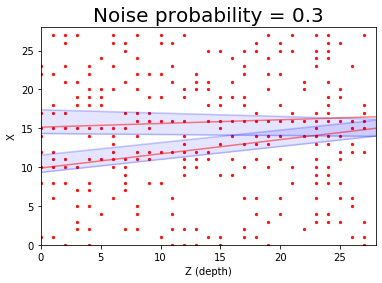

event_res_0.9_0.3_8.png


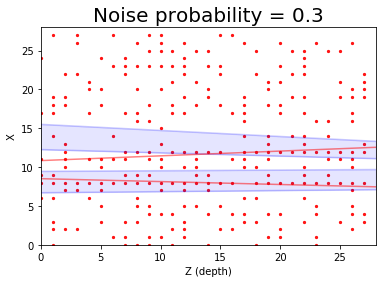

event_res_0.9_0.3_9.png


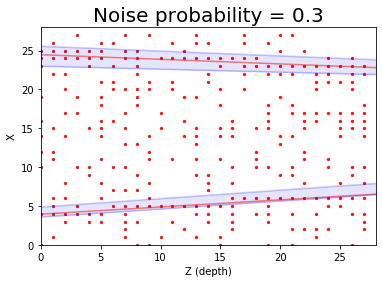

event_res_0.9_0.3_10.png


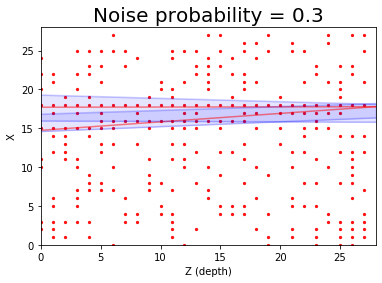

event_res_0.9_0.3_11.png


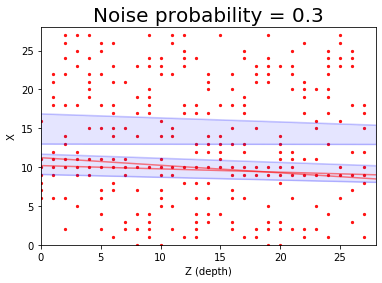

event_res_0.9_0.3_12.png


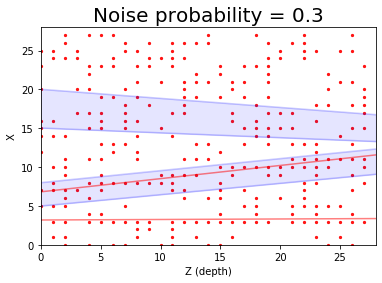

event_res_0.9_0.3_13.png


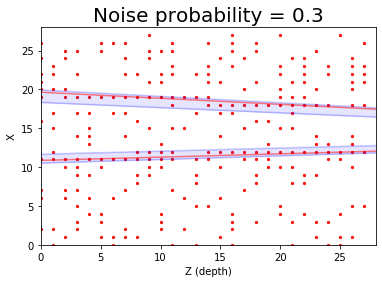

event_res_0.9_0.3_14.png


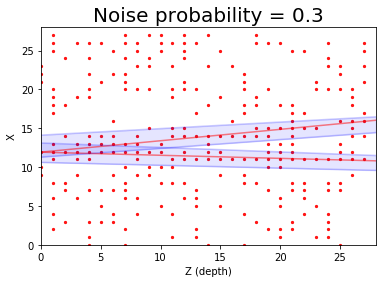

event_res_0.9_0.3_15.png


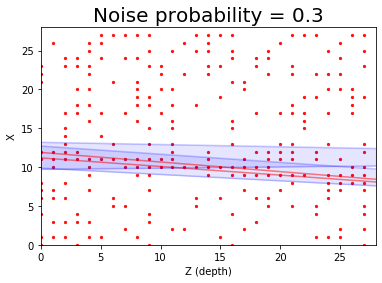

event_res_0.9_0.3_16.png


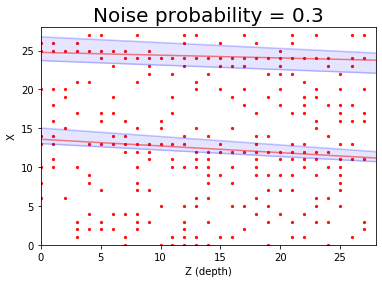

event_res_0.9_0.3_17.png


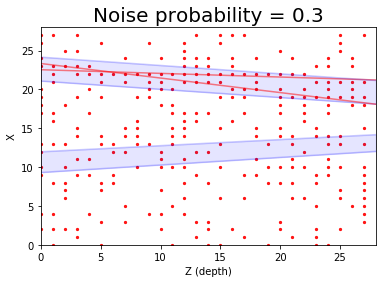

event_res_0.9_0.3_18.png


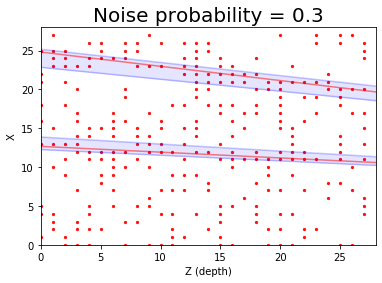

event_res_0.9_0.3_19.png


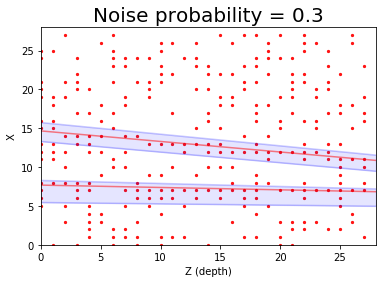

event_res_0.9_0.3_20.png


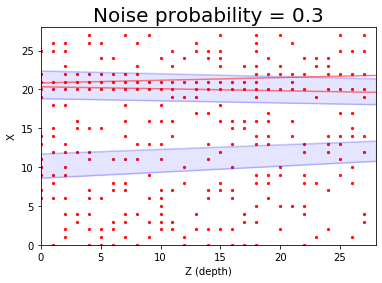

event_res_0.9_0.3_21.png


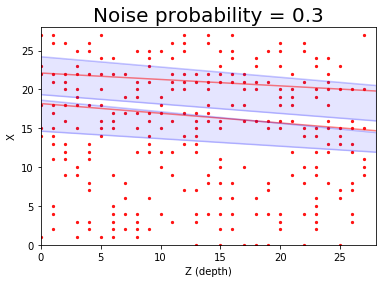

event_res_0.9_0.3_22.png


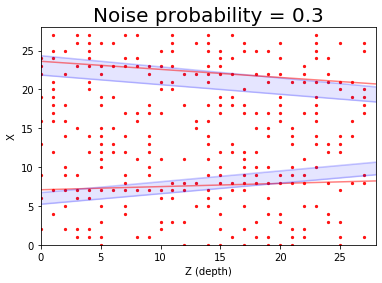

event_res_0.9_0.3_23.png


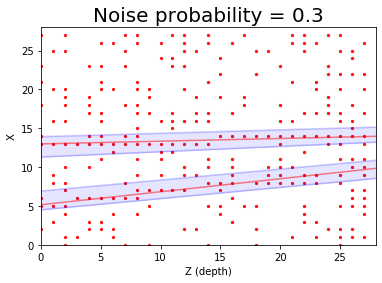

event_res_0.9_0.3_24.png


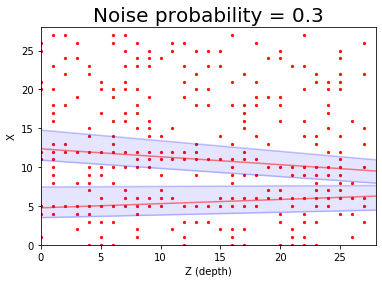

event_res_0.9_0.3_25.png


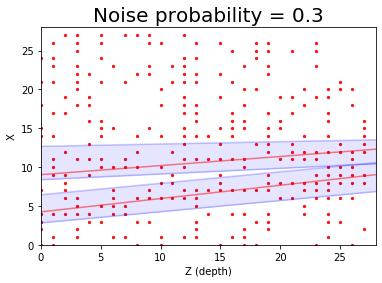

event_res_0.9_0.3_26.png


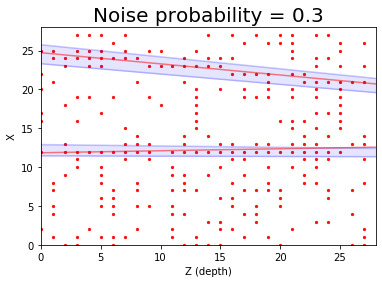

event_res_0.9_0.3_27.png


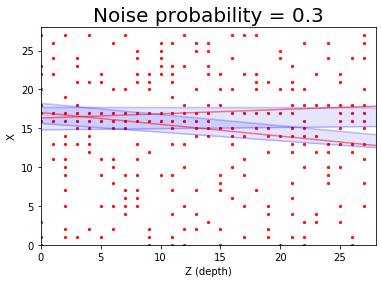

event_res_0.9_0.3_28.png


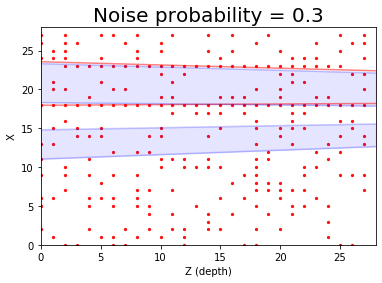

event_res_0.9_0.3_29.png


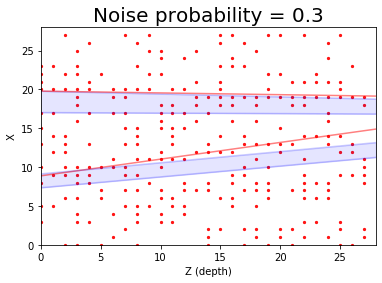

event_res_0.9_0.3_30.png


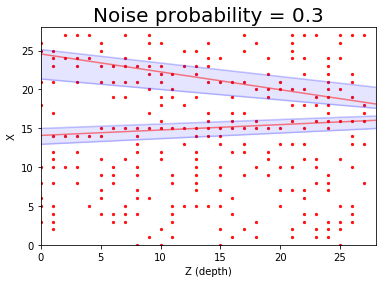

event_res_0.9_0.3_31.png


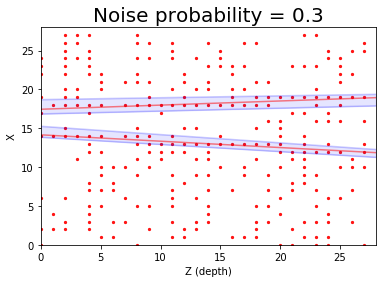

event_res_0.9_0.3_32.png


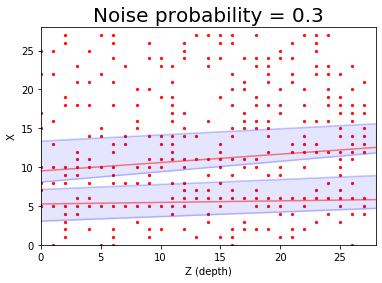

event_res_0.9_0.3_33.png


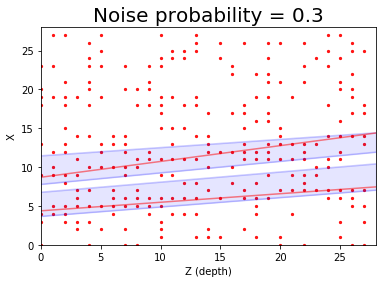

event_res_0.9_0.3_34.png


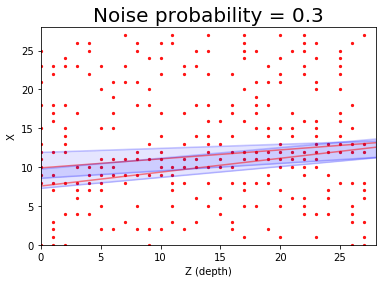

event_res_0.9_0.3_35.png


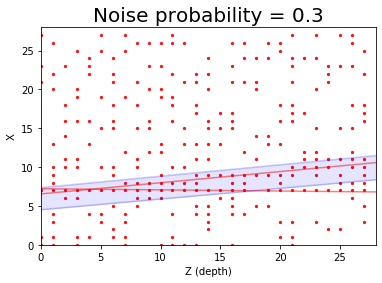

event_res_0.9_0.3_36.png


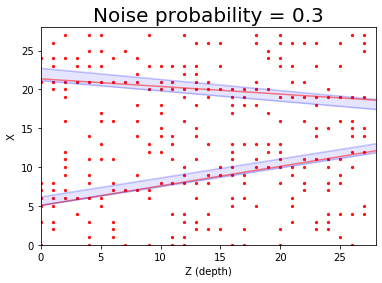

event_res_0.9_0.3_37.png


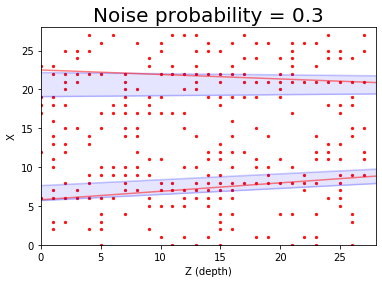

event_res_0.9_0.3_38.png


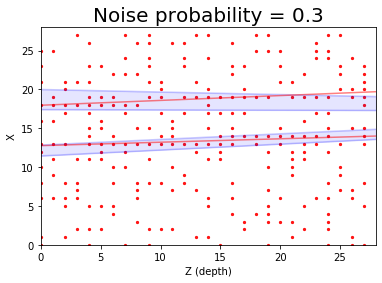

event_res_0.9_0.3_39.png


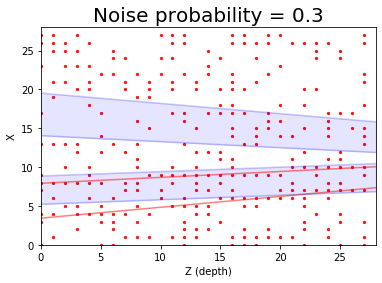

event_res_0.9_0.3_0.png


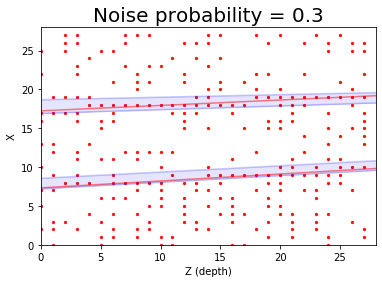

event_res_0.9_0.3_1.png


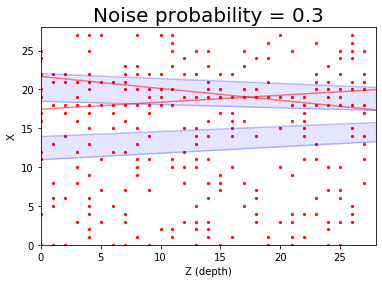

event_res_0.9_0.3_2.png


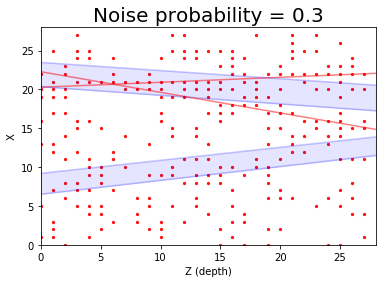

event_res_0.9_0.3_3.png


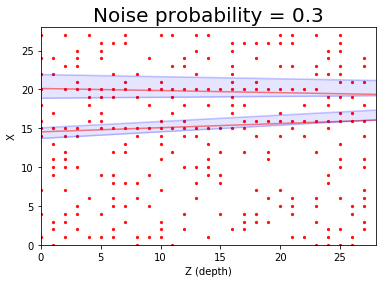

event_res_0.9_0.3_4.png


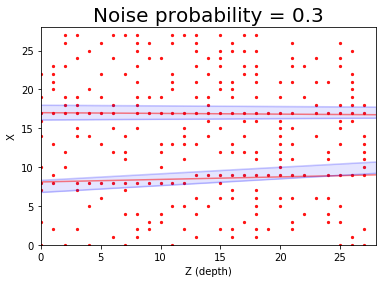

event_res_0.9_0.3_5.png


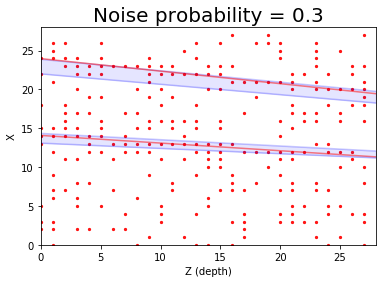

event_res_0.9_0.3_6.png


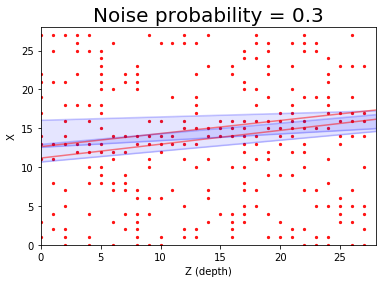

event_res_0.9_0.3_7.png


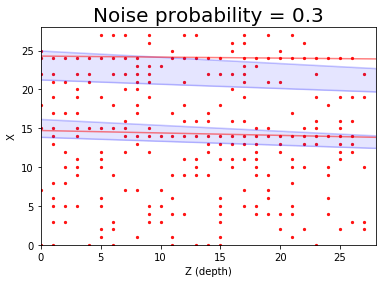

event_res_0.9_0.3_8.png


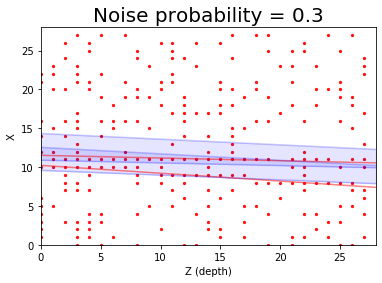

event_res_0.9_0.3_9.png


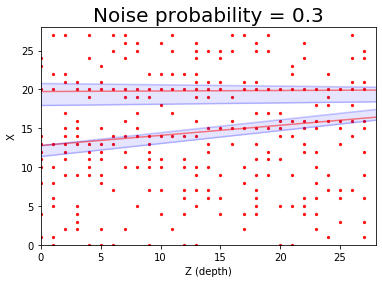

event_res_0.9_0.3_10.png


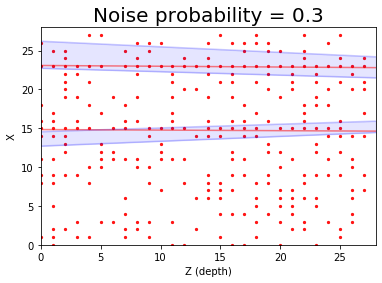

event_res_0.9_0.3_11.png


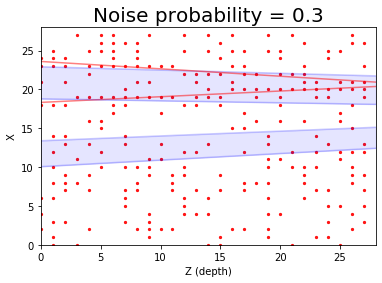

event_res_0.9_0.3_12.png


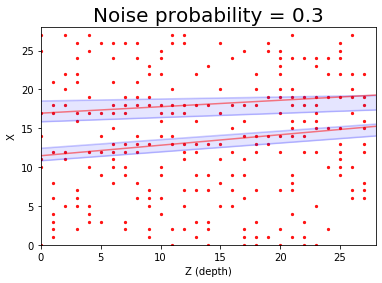

event_res_0.9_0.3_13.png


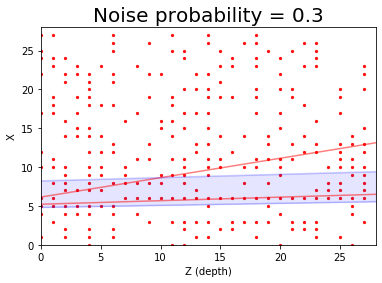

event_res_0.9_0.3_14.png


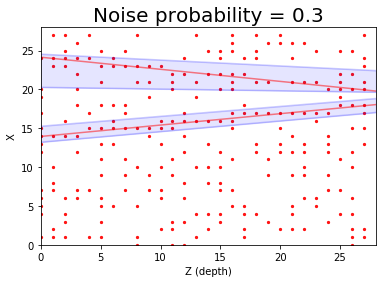

event_res_0.9_0.3_15.png


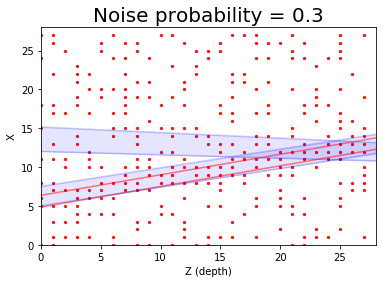

event_res_0.9_0.3_16.png


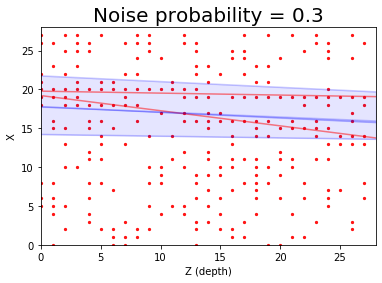

event_res_0.9_0.3_17.png


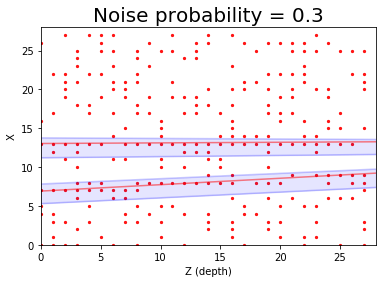

event_res_0.9_0.3_18.png


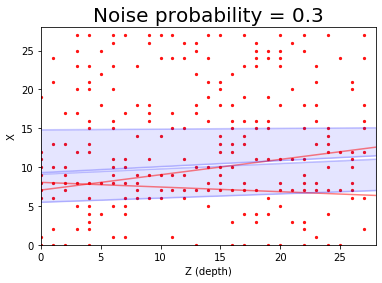

event_res_0.9_0.3_19.png


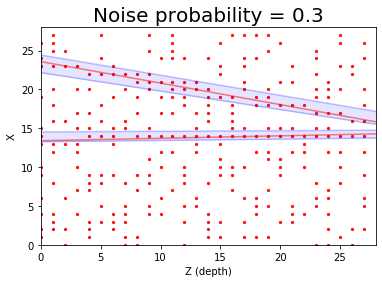

event_res_0.9_0.3_20.png


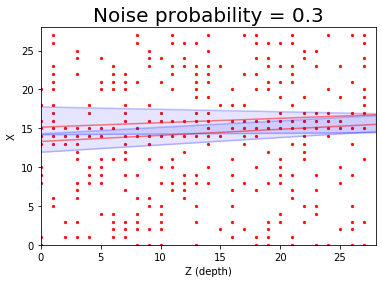

event_res_0.9_0.3_21.png


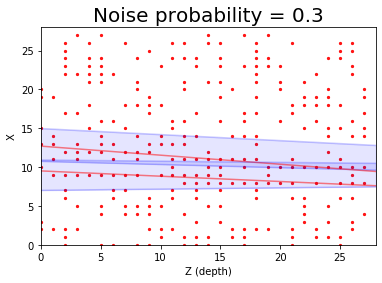

event_res_0.9_0.3_22.png


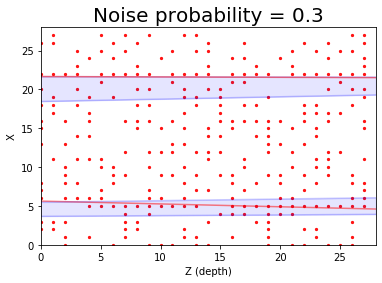

event_res_0.9_0.3_23.png


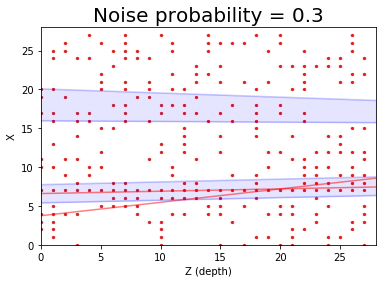

event_res_0.9_0.3_24.png


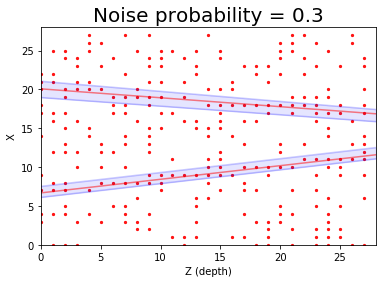

event_res_0.9_0.3_25.png


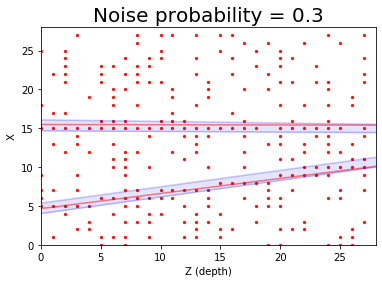

event_res_0.9_0.3_26.png


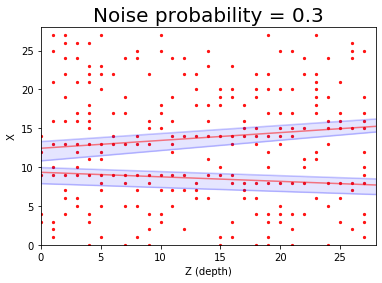

event_res_0.9_0.3_27.png


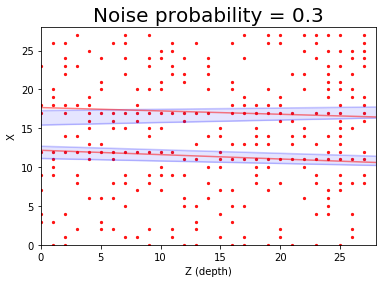

event_res_0.9_0.3_28.png


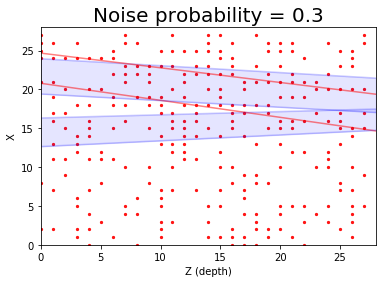

event_res_0.9_0.3_29.png


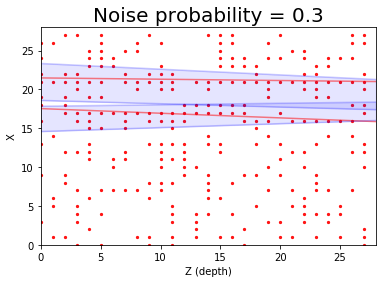

event_res_0.9_0.3_30.png


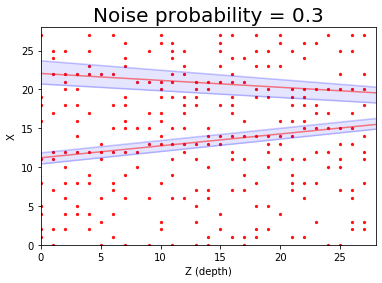

event_res_0.9_0.3_31.png


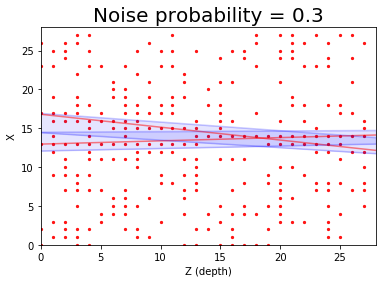

event_res_0.9_0.3_32.png


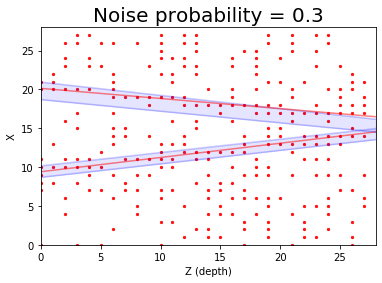

event_res_0.9_0.3_33.png


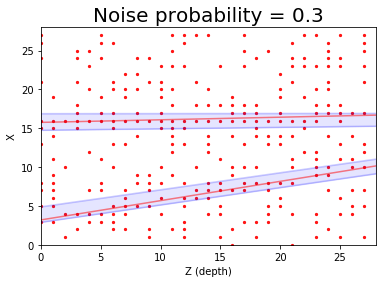

event_res_0.9_0.3_34.png


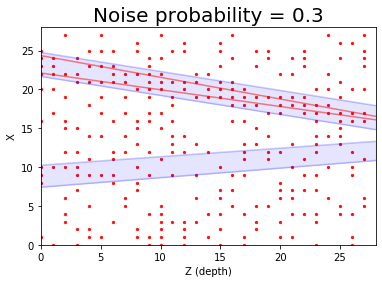

event_res_0.9_0.3_35.png


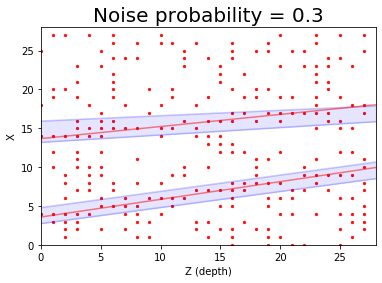

event_res_0.9_0.3_36.png


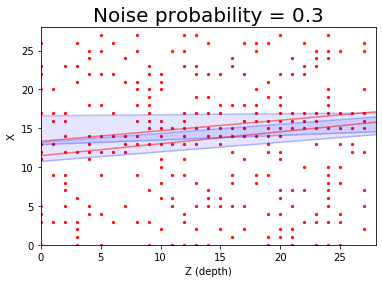

event_res_0.9_0.3_37.png


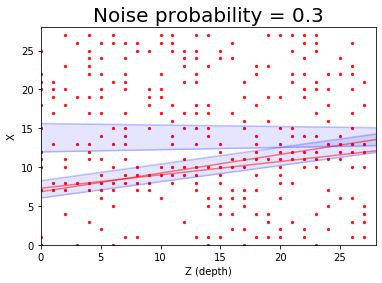

event_res_0.9_0.3_38.png


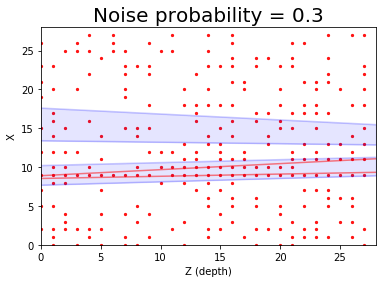

event_res_0.9_0.3_39.png


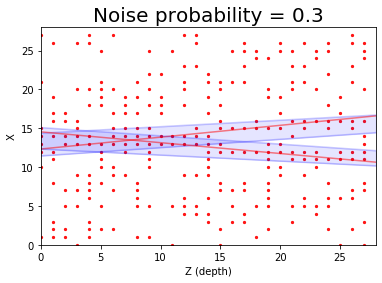

event_res_0.9_0.3_0.png


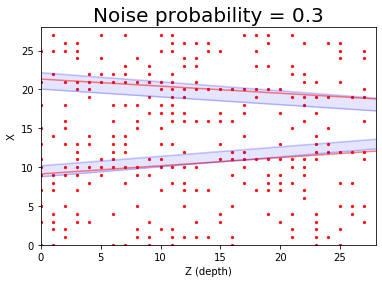

event_res_0.9_0.3_1.png


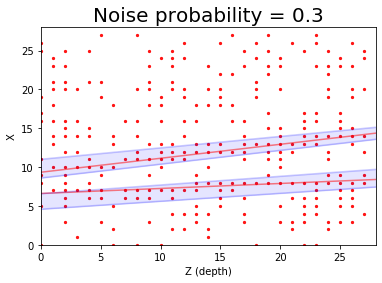

event_res_0.9_0.3_2.png


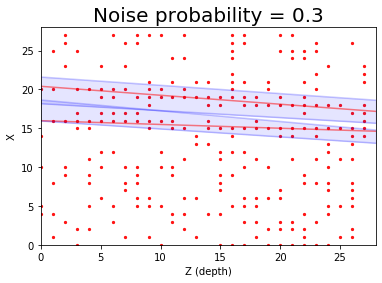

event_res_0.9_0.3_3.png


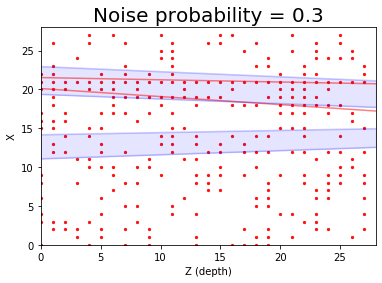

event_res_0.9_0.3_4.png


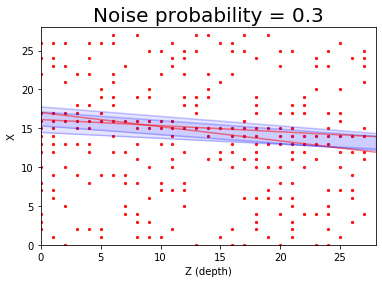

event_res_0.9_0.3_5.png


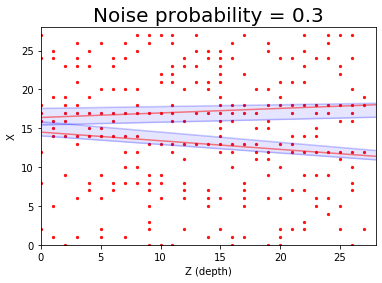

event_res_0.9_0.3_6.png


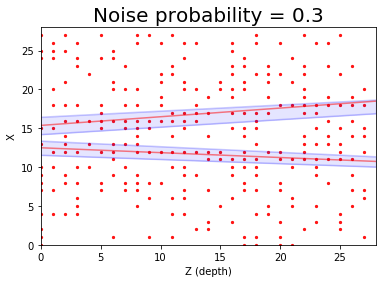

event_res_0.9_0.3_7.png


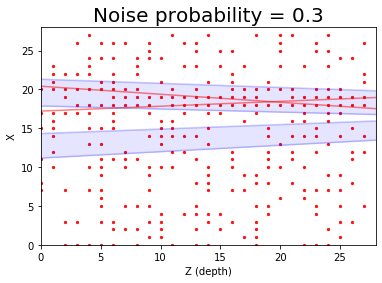

event_res_0.9_0.3_8.png


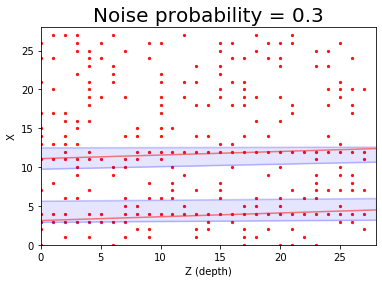

event_res_0.9_0.3_9.png


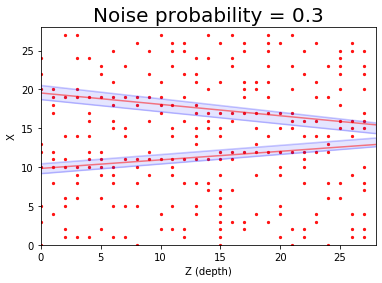

event_res_0.9_0.3_10.png


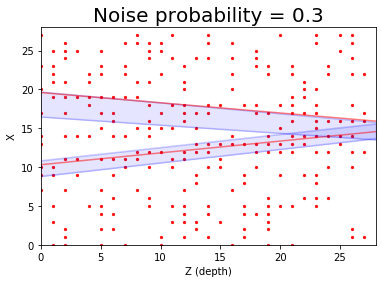

event_res_0.9_0.3_11.png


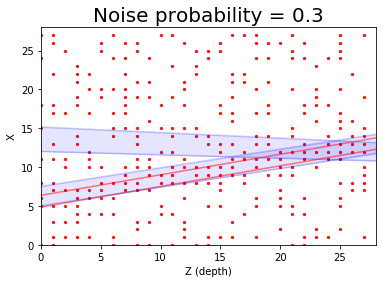

event_res_0.9_0.3_12.png


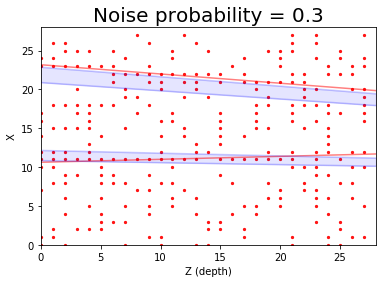

event_res_0.9_0.3_13.png


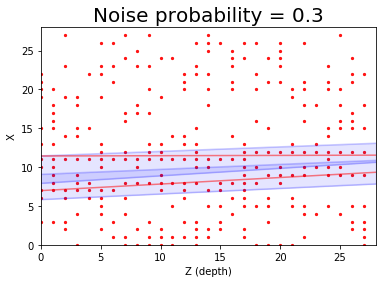

event_res_0.9_0.3_14.png


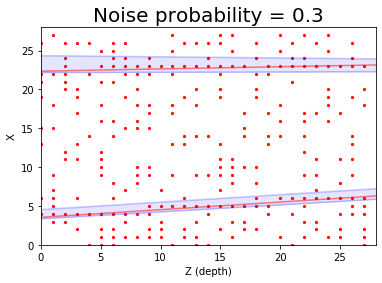

event_res_0.9_0.3_15.png


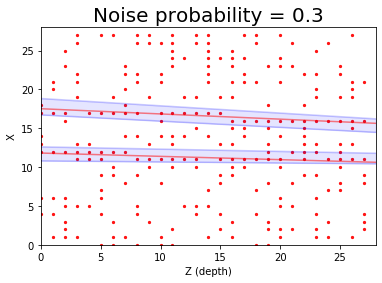

event_res_0.9_0.3_16.png


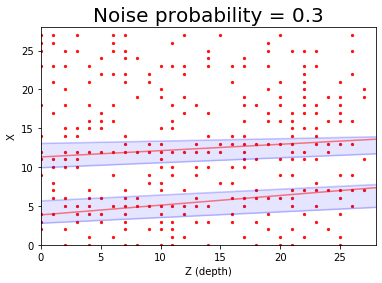

event_res_0.9_0.3_17.png


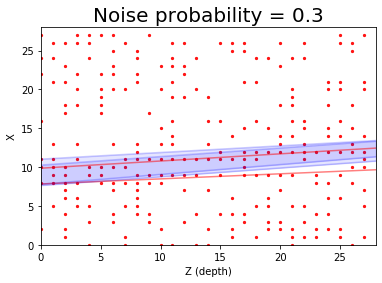

event_res_0.9_0.3_18.png


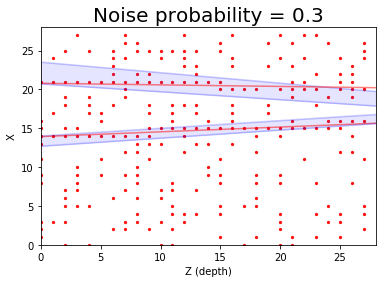

event_res_0.9_0.3_19.png


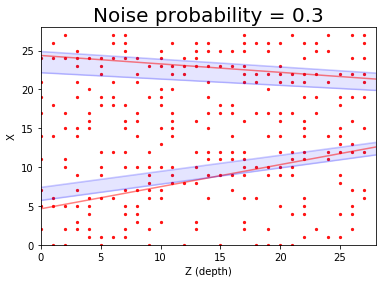

event_res_0.9_0.3_20.png


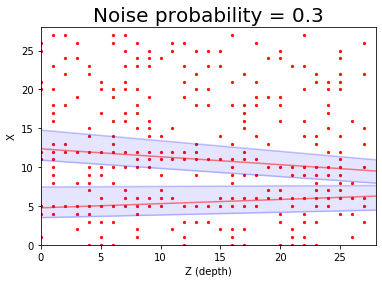

event_res_0.9_0.3_21.png


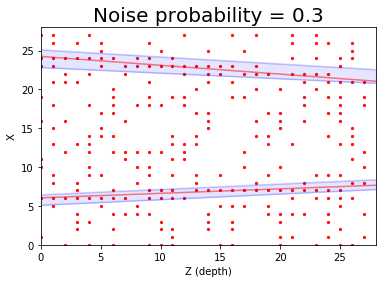

event_res_0.9_0.3_22.png


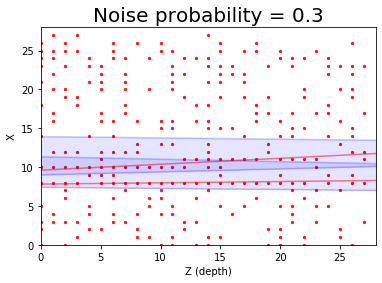

event_res_0.9_0.3_23.png


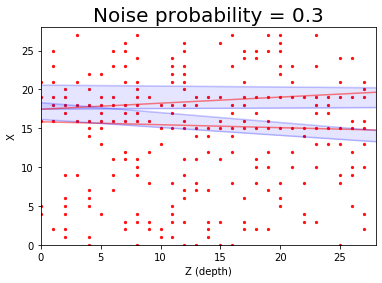

event_res_0.9_0.3_24.png


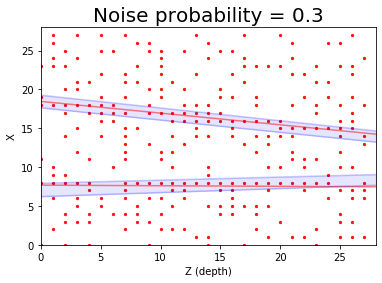

event_res_0.9_0.3_25.png


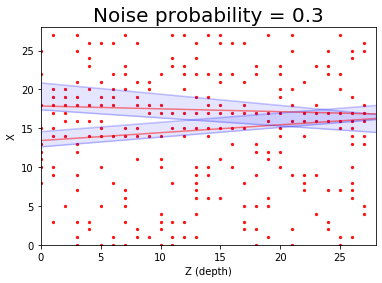

event_res_0.9_0.3_26.png


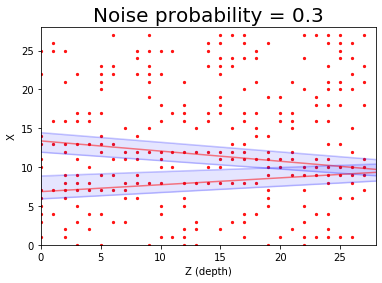

event_res_0.9_0.3_27.png


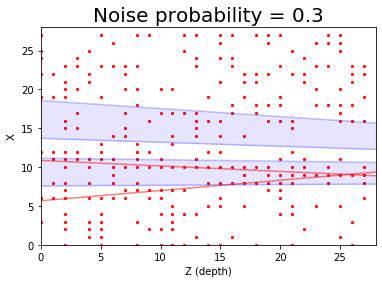

event_res_0.9_0.3_28.png


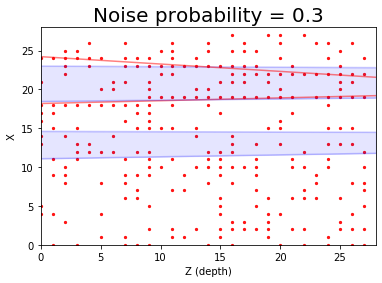

event_res_0.9_0.3_29.png


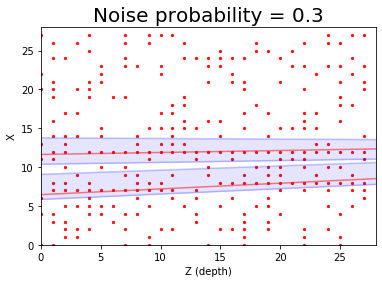

event_res_0.9_0.3_30.png


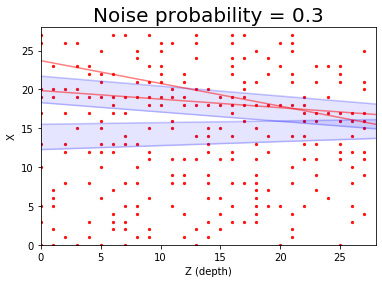

event_res_0.9_0.3_31.png


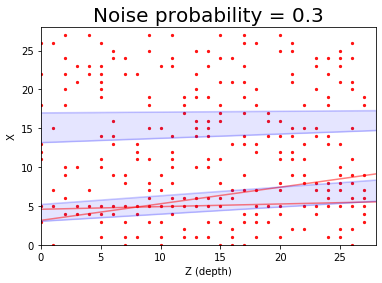

event_res_0.9_0.3_32.png


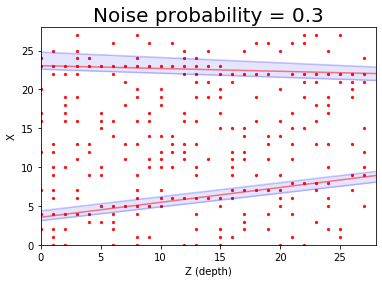

event_res_0.9_0.3_33.png


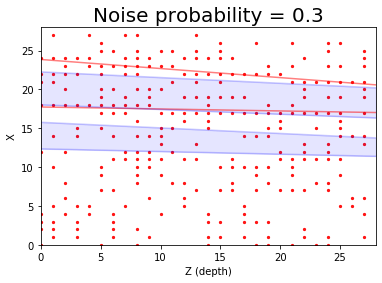

event_res_0.9_0.3_34.png


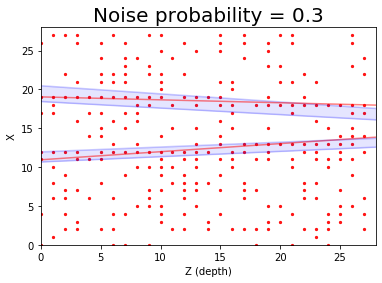

event_res_0.9_0.3_35.png


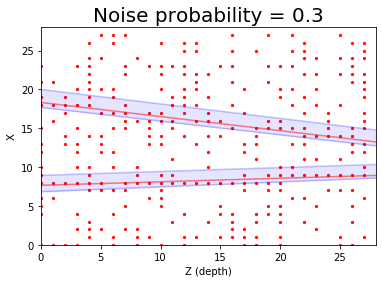

event_res_0.9_0.3_36.png


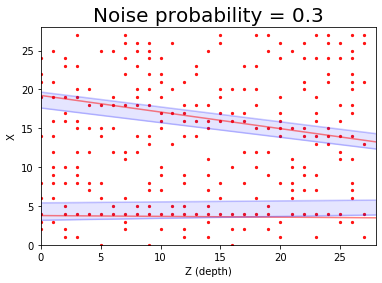

event_res_0.9_0.3_37.png


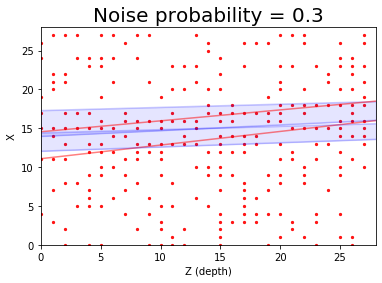

event_res_0.9_0.3_38.png


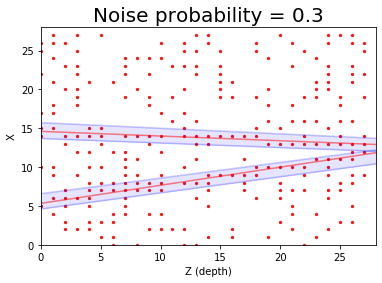

event_res_0.9_0.3_39.png


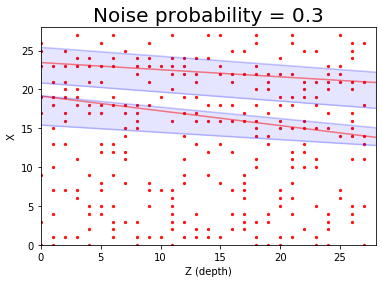

event_res_0.9_0.3_0.png


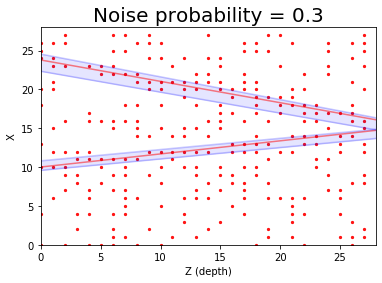

event_res_0.9_0.3_1.png


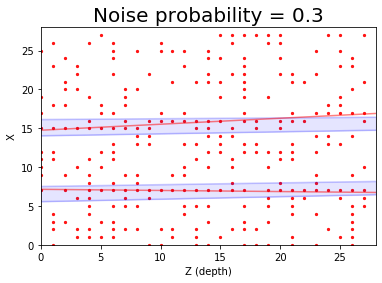

event_res_0.9_0.3_2.png


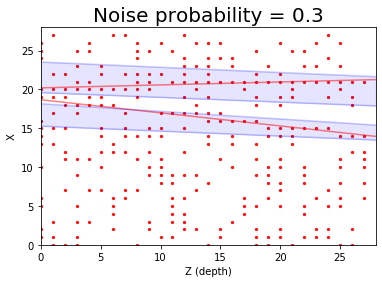

event_res_0.9_0.3_3.png


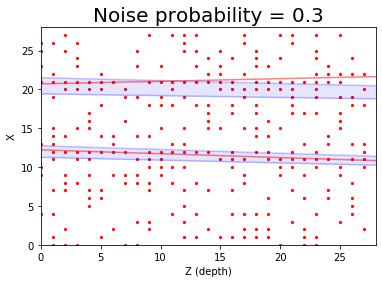

event_res_0.9_0.3_4.png


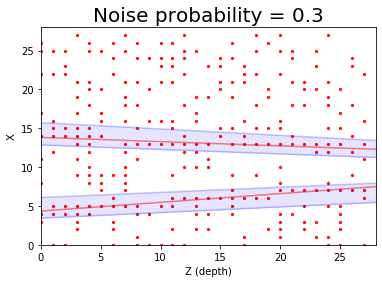

event_res_0.9_0.3_5.png


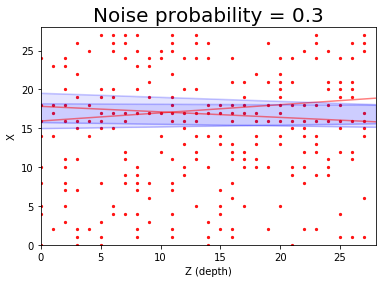

event_res_0.9_0.3_6.png


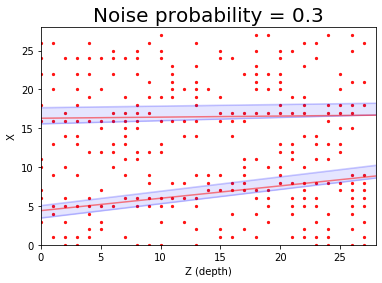

event_res_0.9_0.3_7.png


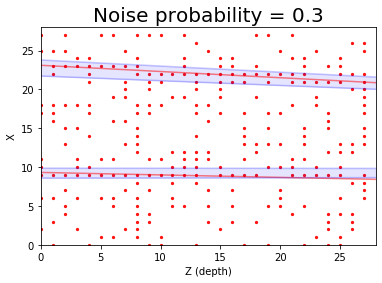

event_res_0.9_0.3_8.png


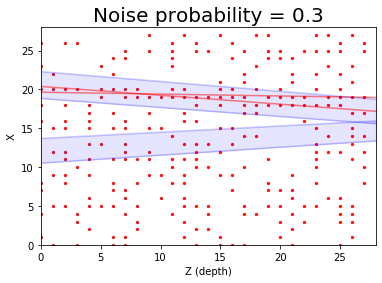

event_res_0.9_0.3_9.png


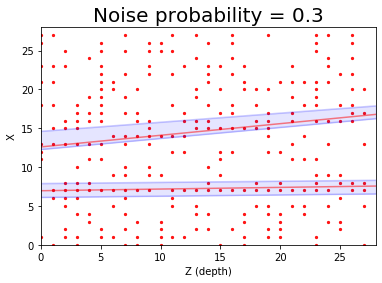

event_res_0.9_0.3_10.png


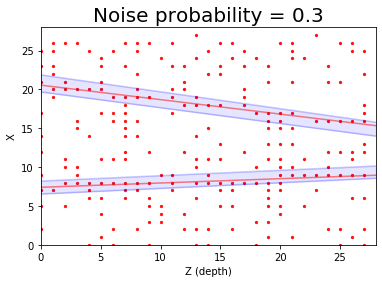

event_res_0.9_0.3_11.png


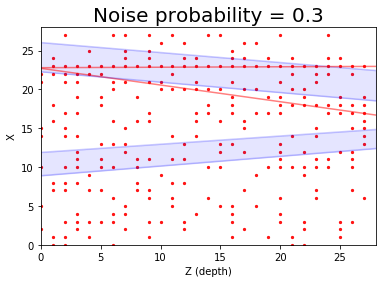

event_res_0.9_0.3_12.png


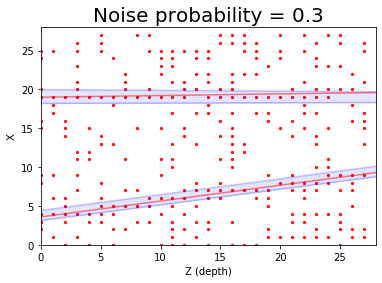

event_res_0.9_0.3_13.png


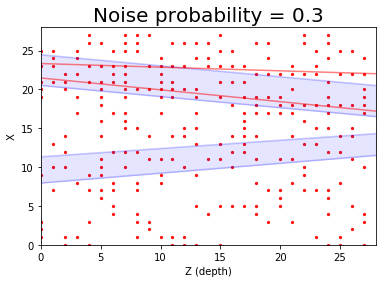

event_res_0.9_0.3_14.png


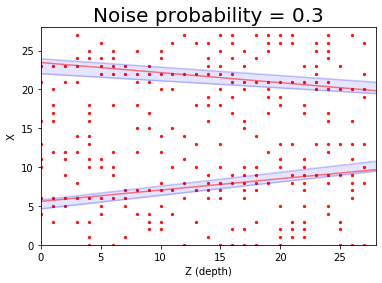

event_res_0.9_0.3_15.png


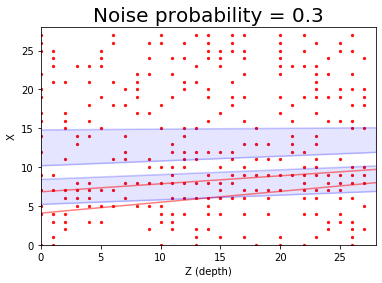

event_res_0.9_0.3_16.png


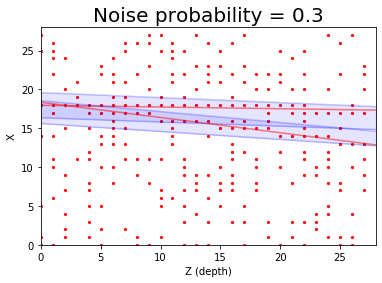

event_res_0.9_0.3_17.png


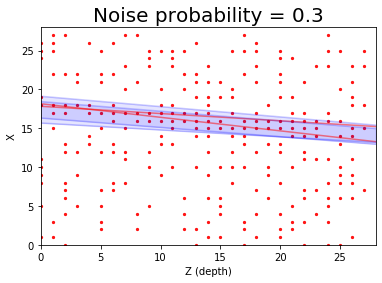

event_res_0.9_0.3_18.png


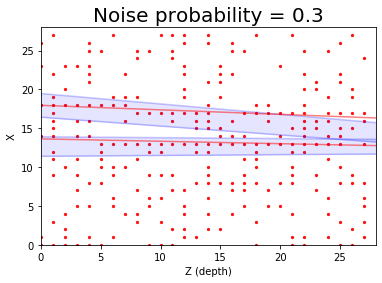

event_res_0.9_0.3_19.png


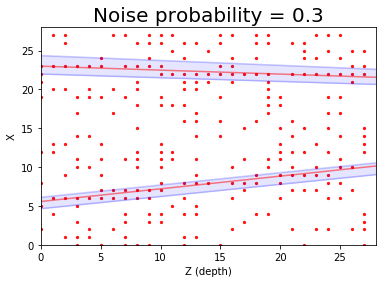

event_res_0.9_0.3_20.png


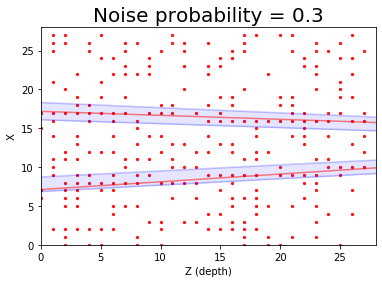

event_res_0.9_0.3_21.png


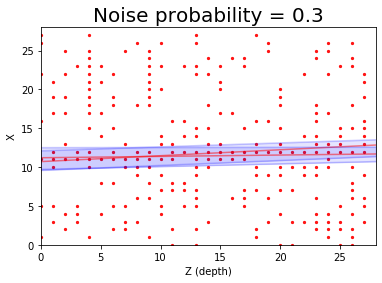

event_res_0.9_0.3_22.png


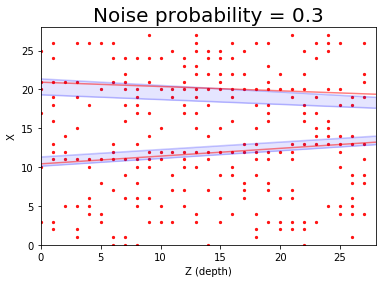

event_res_0.9_0.3_23.png


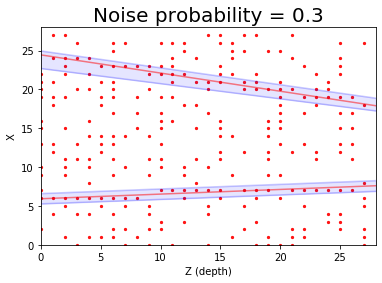

event_res_0.9_0.3_24.png


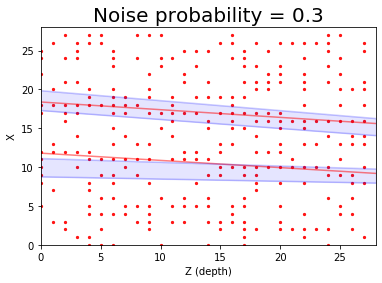

event_res_0.9_0.3_25.png


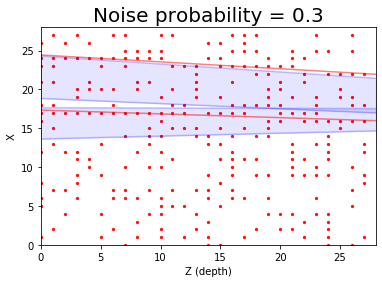

event_res_0.9_0.3_26.png


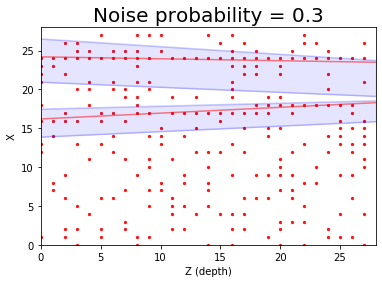

event_res_0.9_0.3_27.png


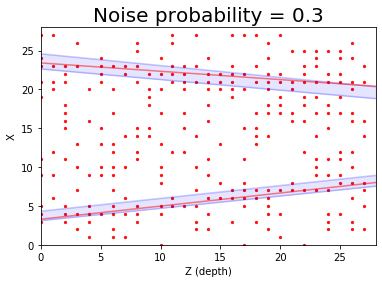

event_res_0.9_0.3_28.png


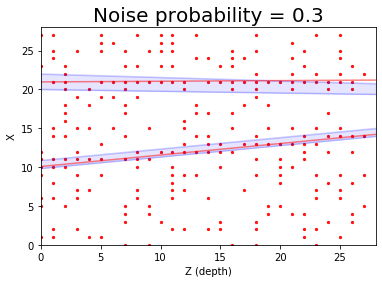

event_res_0.9_0.3_29.png


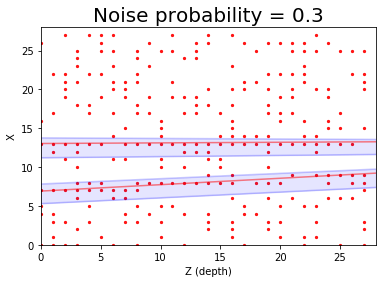

event_res_0.9_0.3_30.png


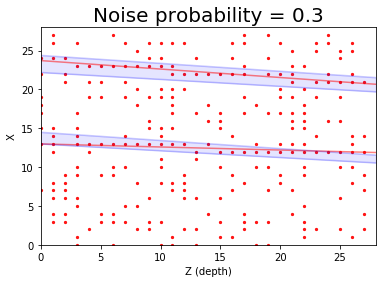

event_res_0.9_0.3_31.png


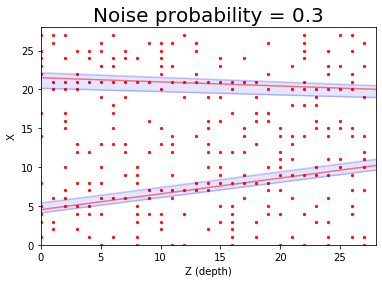

event_res_0.9_0.3_32.png


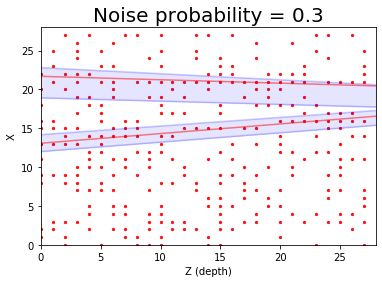

event_res_0.9_0.3_33.png


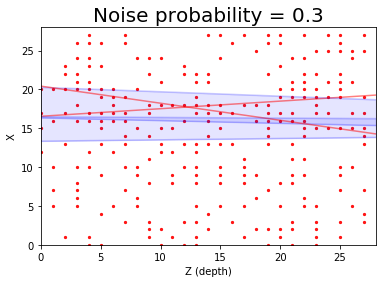

event_res_0.9_0.3_34.png


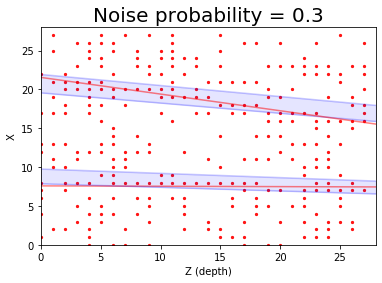

event_res_0.9_0.3_35.png


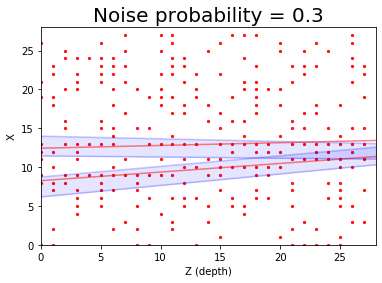

event_res_0.9_0.3_36.png


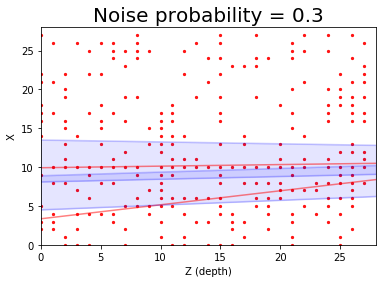

event_res_0.9_0.3_37.png


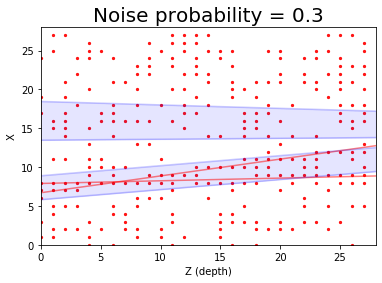

event_res_0.9_0.3_38.png


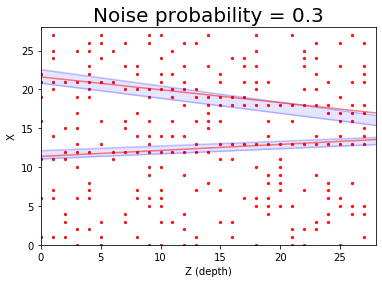

event_res_0.9_0.3_39.png


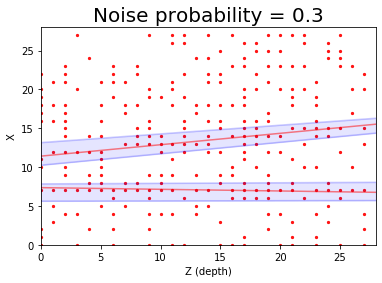

event_res_0.9_0.3_0.png


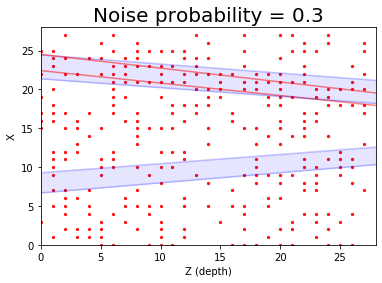

event_res_0.9_0.3_1.png


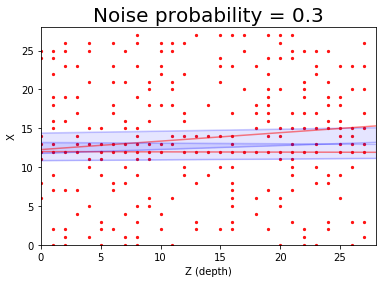

event_res_0.9_0.3_2.png


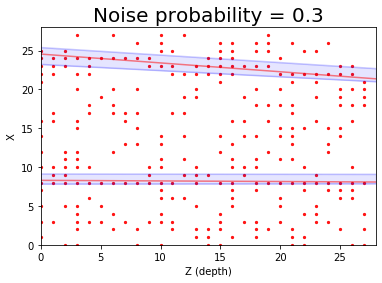

event_res_0.9_0.3_3.png


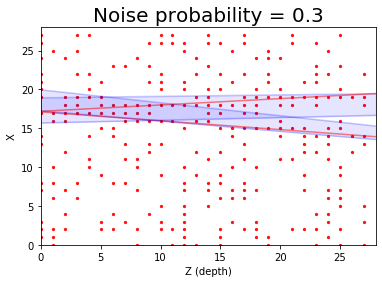

event_res_0.9_0.3_4.png


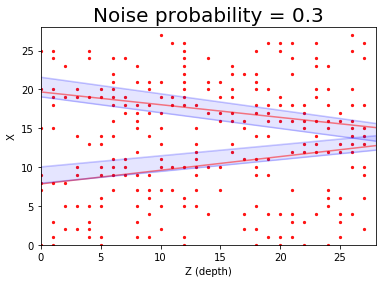

event_res_0.9_0.3_5.png


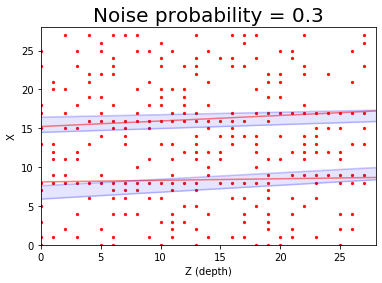

event_res_0.9_0.3_6.png


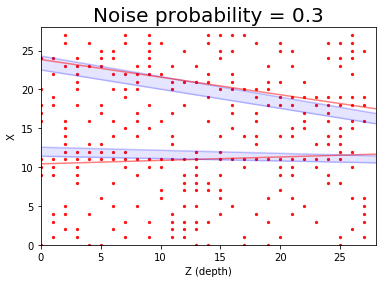

event_res_0.9_0.3_7.png


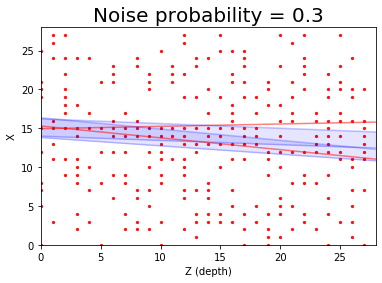

event_res_0.9_0.3_8.png


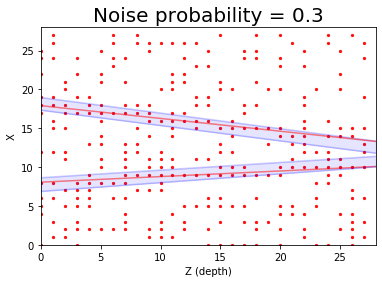

event_res_0.9_0.3_9.png


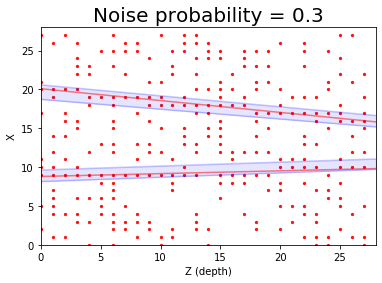

event_res_0.9_0.3_10.png


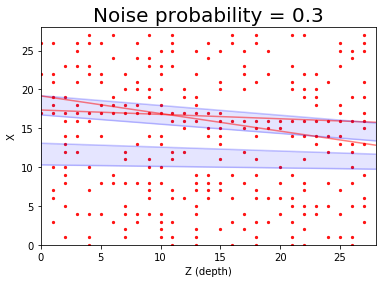

event_res_0.9_0.3_11.png


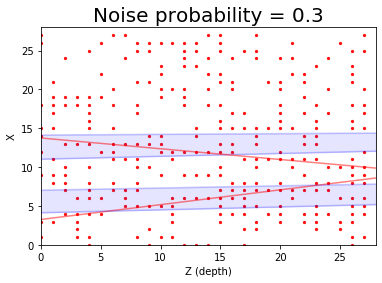

event_res_0.9_0.3_12.png


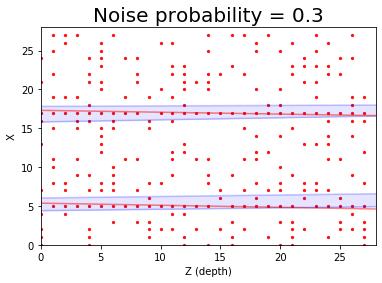

event_res_0.9_0.3_13.png


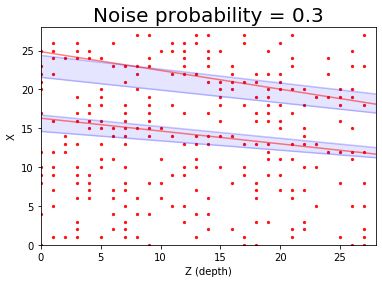

event_res_0.9_0.3_14.png


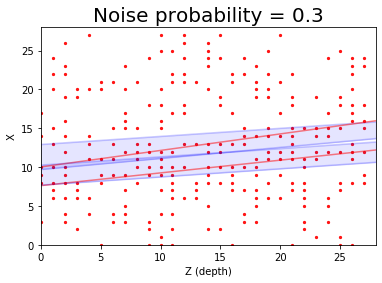

event_res_0.9_0.3_15.png


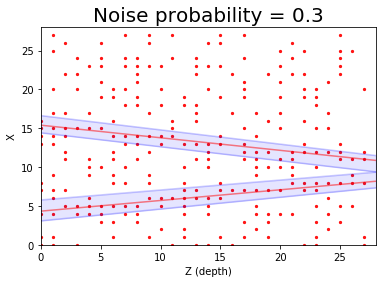

event_res_0.9_0.3_16.png


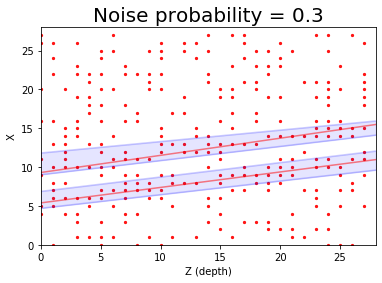

event_res_0.9_0.3_17.png


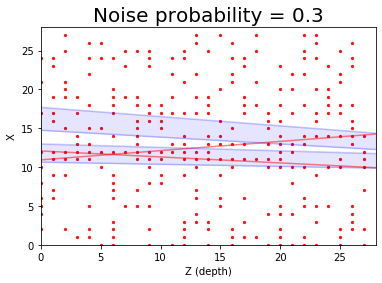

event_res_0.9_0.3_18.png


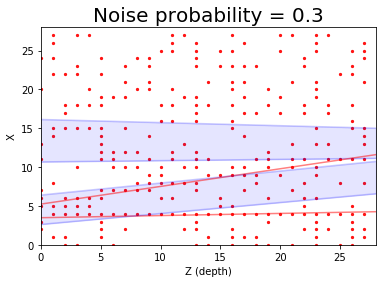

event_res_0.9_0.3_19.png


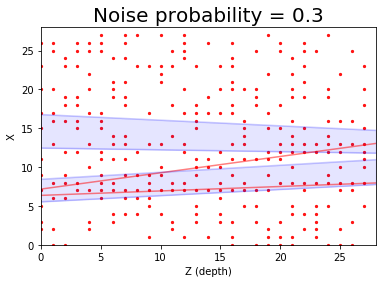

event_res_0.9_0.3_20.png


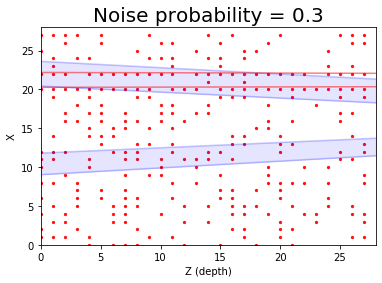

event_res_0.9_0.3_21.png


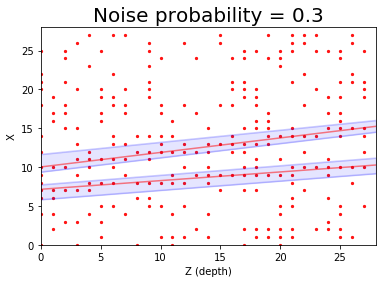

event_res_0.9_0.3_22.png


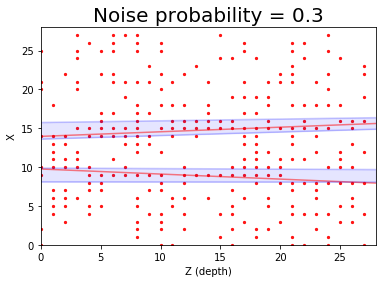

event_res_0.9_0.3_23.png


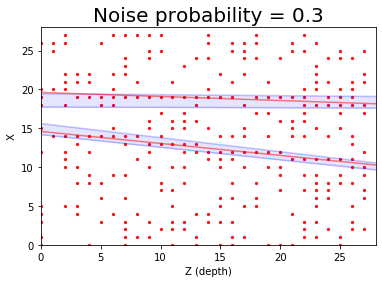

event_res_0.9_0.3_24.png


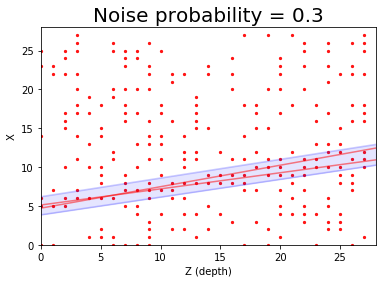

event_res_0.9_0.3_25.png


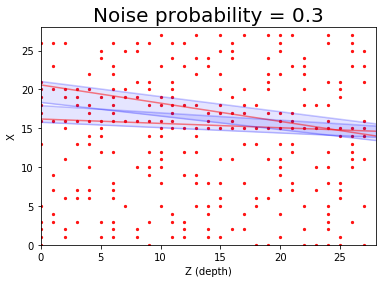

event_res_0.9_0.3_26.png


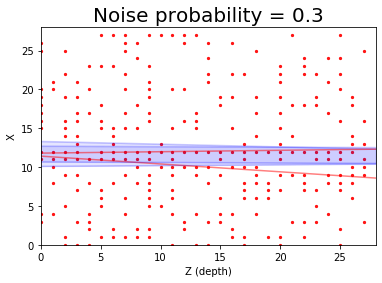

event_res_0.9_0.3_27.png


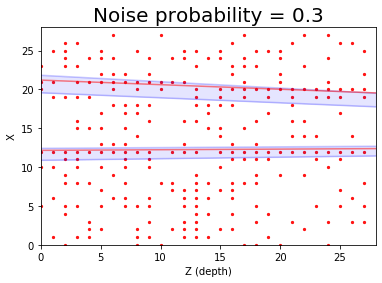

event_res_0.9_0.3_28.png


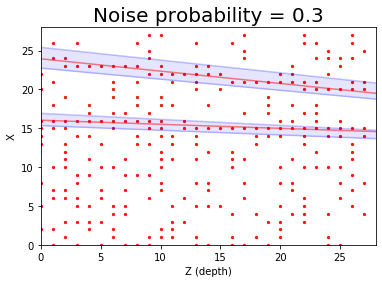

event_res_0.9_0.3_29.png


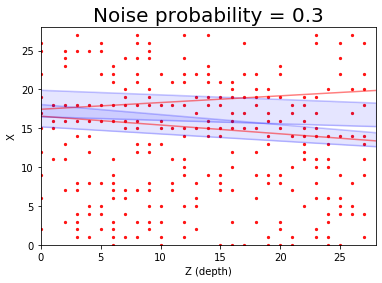

event_res_0.9_0.3_30.png


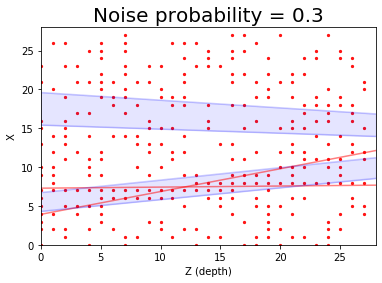

event_res_0.9_0.3_31.png


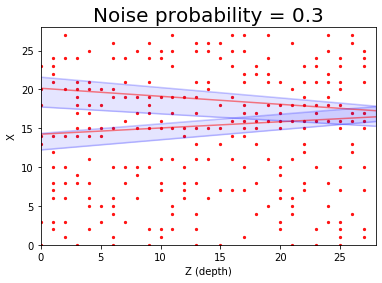

event_res_0.9_0.3_32.png


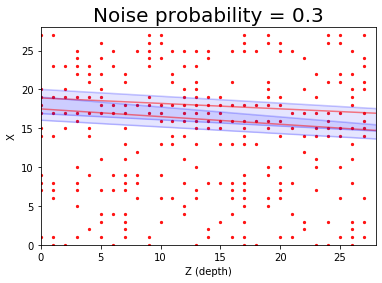

event_res_0.9_0.3_33.png


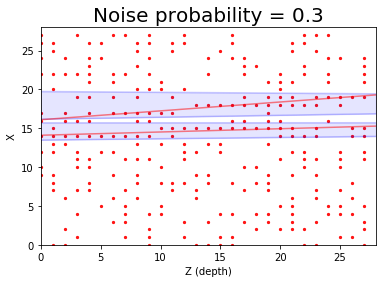

event_res_0.9_0.3_34.png


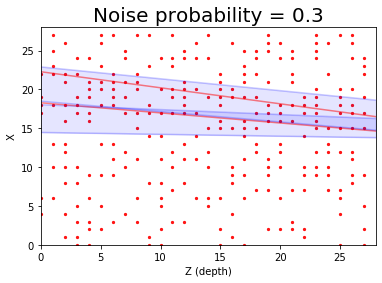

event_res_0.9_0.3_35.png


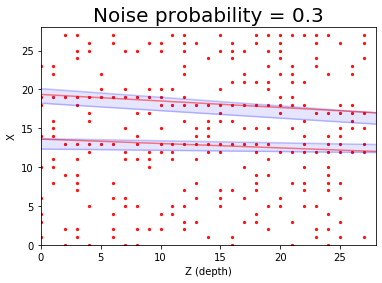

event_res_0.9_0.3_36.png


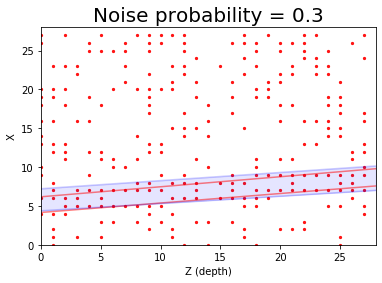

event_res_0.9_0.3_37.png


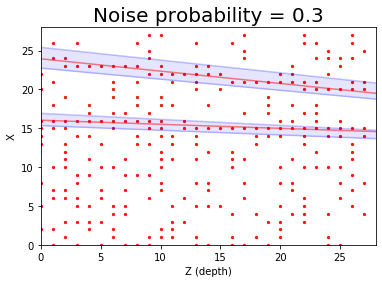

event_res_0.9_0.3_38.png


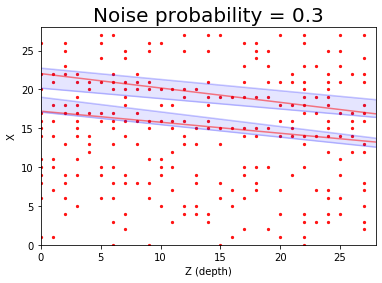

event_res_0.9_0.3_39.png


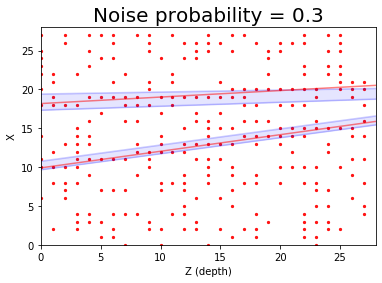

In [0]:
#del model
#model = load_model('partly_trained.h5')
prob_noise=0.3
# patient early stopping
es = EarlyStopping(monitor='loss', mode='min', verbose=1, patience=12)  # 'val_loss'
mc = ModelCheckpoint('best_model.h5', monitor='loss', mode='min', verbose=1,
                     save_best_only=True)  # 'val_loss'

#train with fit_generator - generate events on flight
# pre-training with rms optimizer 
history=model.fit_generator(data_generator(prob_noise=prob_noise, n_tracks=mean_tracks),
                            steps_per_epoch=steps_per_epoch,
                            #validation_data=data_generator(), 
                            #validation_steps=steps_per_epoch,
                            epochs = 64#pre_epochs
                            ,callbacks=[es
                                        #, mc]
                                      ]
                           )

x_test, y_test = generate_testdata(prob_noise)
#plot_sample()
  
y_new = predict(model)
print("y_new shape: ",y_new.shape)
plot_predict(y_new)
plot_predict_event(y_new)

In [0]:
# serialize weights to HDF5
model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [0]:
model.load_weights("model.h5")
print("Model loaded from disk")

Model loaded from disk


history [28.028753815218806, 0.010599641303997487, -0.6350906919687986, -0.7834579348564148, -0.8633712343871593, -0.8982063978910446, -0.9678894989192486, -1.0847574546933174, -1.1781054437160492, -1.2141687870025635, -1.2081919088959694, -1.3235751166939735, -1.4153149500489235, -1.5403016433119774, -1.5450990870594978, -1.510882817208767, -1.590764194726944, -1.7726020142436028, -1.82004052400589, -1.8839891105890274, -1.9388250708580017, -1.9130553305149078, -1.9743319600820541, -1.921309843659401, -1.9744538888335228, -1.9641743898391724, -2.1173022091388702, -2.056598447263241, -2.130046419799328, -2.140623986721039, -2.2299276143312454, -2.2263948917388916, -2.3523171693086624, -2.3059841245412827, -2.2106983587145805, -2.363277807831764, -2.4474342614412308, -2.4327849447727203, -2.4776562452316284, -2.4910625964403152, -2.5616688281297684, -2.493911013007164, -2.619509994983673, -2.484819605946541, -2.6108760982751846, -2.6716963052749634, -2.696653723716736, -2.69341506063938

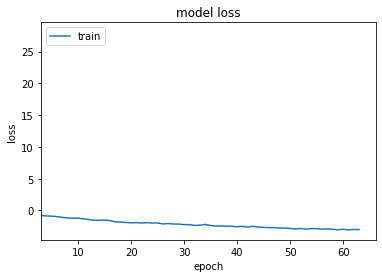

<Figure size 432x288 with 0 Axes>

In [0]:
# summarize history for loss
plt.plot(history.history['loss'])
###plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.xlim(3, None)
#plt.ylim(ymax = 1.2*history.history['loss'][min(len(history.history['loss']),3)-1], ymin = 0)
print("history",history.history['loss'])

auxName = 'pretraining_'+str(efficiency)+'_'+str(prob_noise)+'.png'
plt.savefig(auxName)
  
plt.show()
#plt.savefig('training.png')
plt.clf()

Generate test data, efficiency, prob_noise =  0.9 0.3
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.3
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     
_

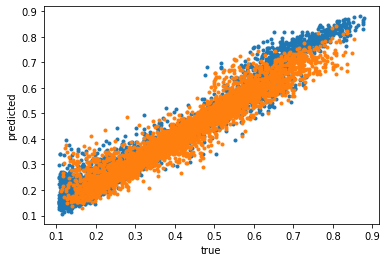

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:655: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:675: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


mu, std:  0.33453279922264995 0.8040943959948801
new_diff_0:  [ 0.04782817 -0.66494041  1.41799419 ...  1.34111081  0.01081072
  0.27863094]
new mu, std:  0.3285239130203174 0.7397782748993563
bins_proposed: 90.52040899035006
mu, std:  0.0903037075574697 0.9512267366159639
new_diff_1:  [ 0.0028846   0.54279977 -0.67643457 ...  2.86387979  0.77082602
  0.25199165]
bins_proposed: 82.41085934234333
params_1_0.9_0.3.png


<Figure size 432x288 with 0 Axes>

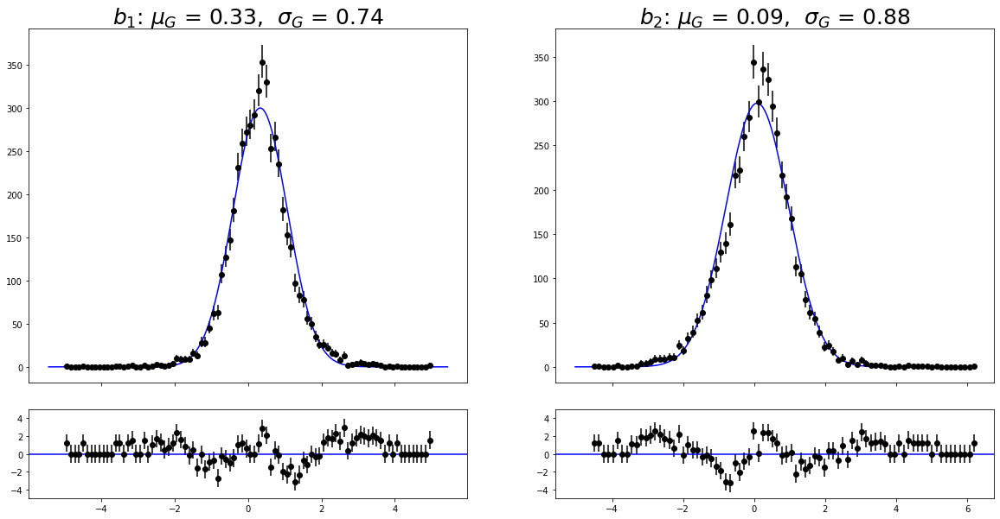

Plot events with predicted tracks, efficiency, prob_noise =  0.9 0.3
y_new shape ::  (5000, 15)
event_res_0.9_0.3_0.png


<Figure size 432x288 with 0 Axes>

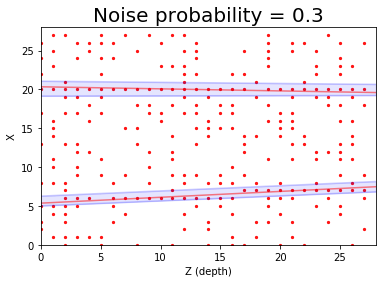

event_res_0.9_0.3_1.png


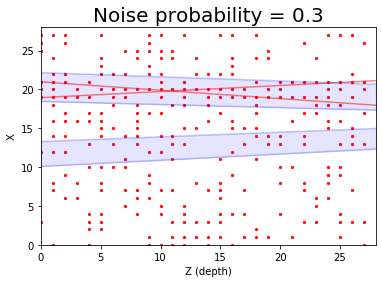

event_res_0.9_0.3_2.png


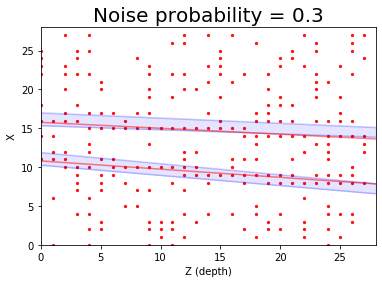

event_res_0.9_0.3_3.png


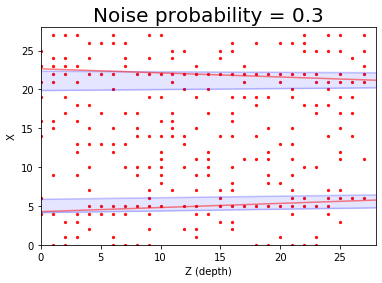

event_res_0.9_0.3_4.png


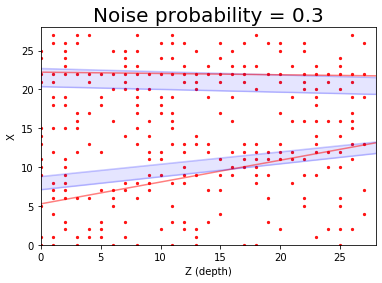

event_res_0.9_0.3_5.png


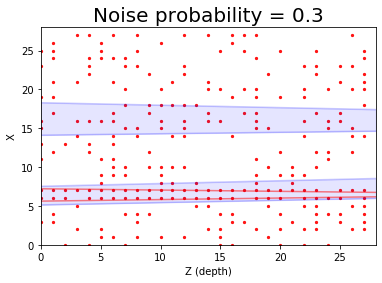

event_res_0.9_0.3_6.png


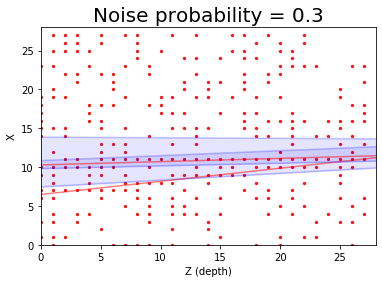

event_res_0.9_0.3_7.png


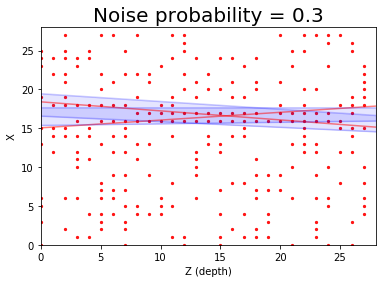

event_res_0.9_0.3_8.png


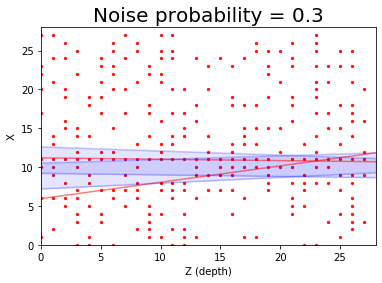

event_res_0.9_0.3_9.png


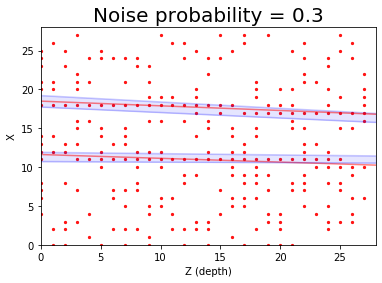

event_res_0.9_0.3_10.png


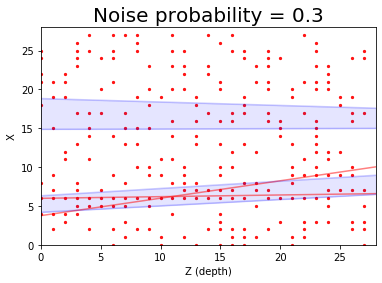

event_res_0.9_0.3_11.png


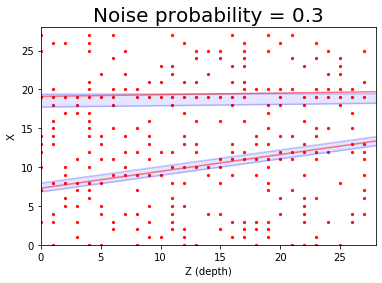

event_res_0.9_0.3_12.png


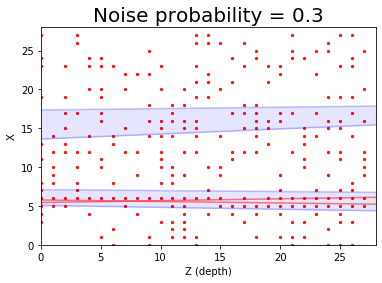

event_res_0.9_0.3_13.png


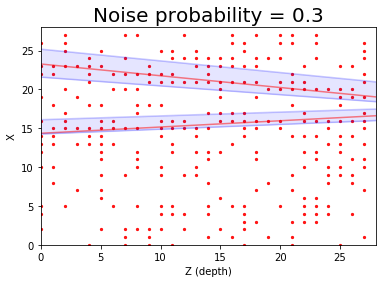

event_res_0.9_0.3_14.png


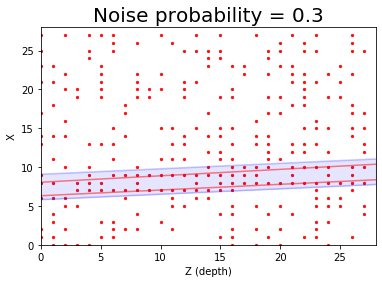

event_res_0.9_0.3_15.png


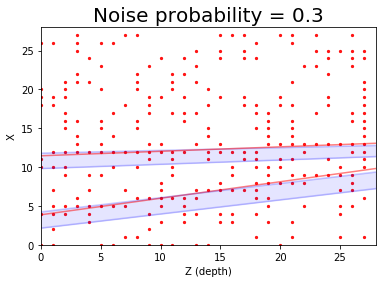

event_res_0.9_0.3_16.png


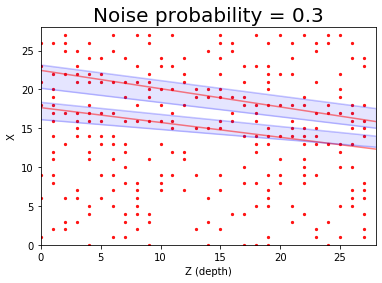

event_res_0.9_0.3_17.png


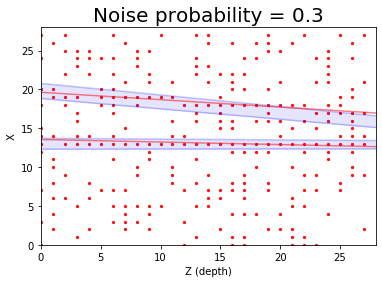

event_res_0.9_0.3_18.png


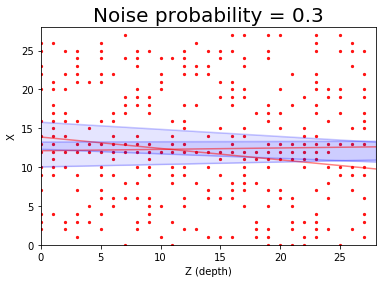

event_res_0.9_0.3_19.png


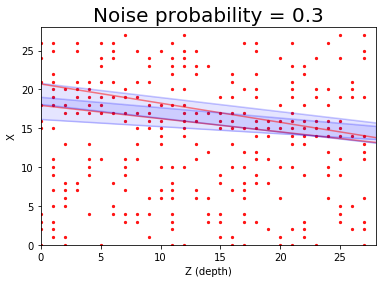

event_res_0.9_0.3_20.png


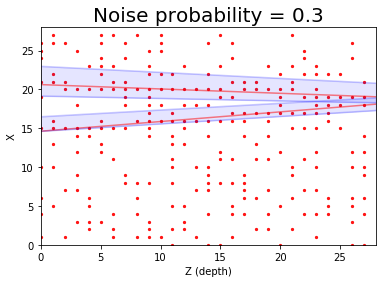

event_res_0.9_0.3_21.png


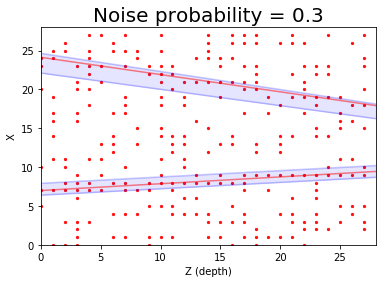

event_res_0.9_0.3_22.png


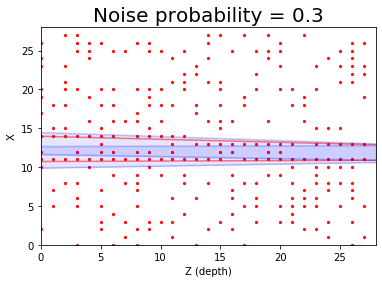

event_res_0.9_0.3_23.png


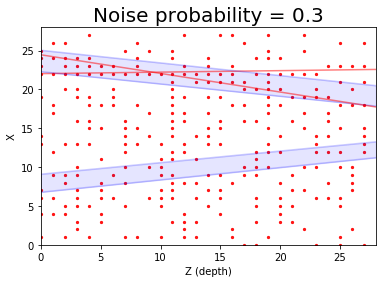

event_res_0.9_0.3_24.png


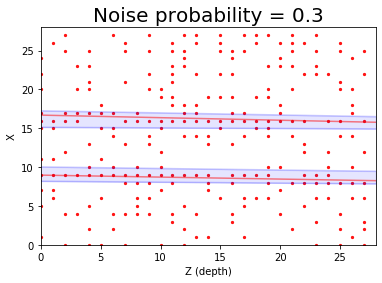

event_res_0.9_0.3_25.png


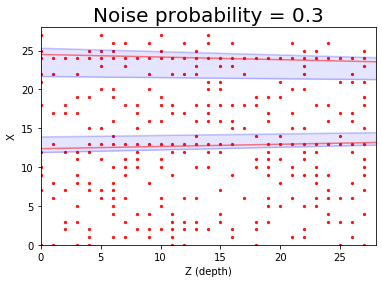

event_res_0.9_0.3_26.png


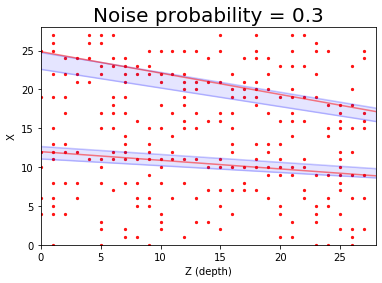

event_res_0.9_0.3_27.png


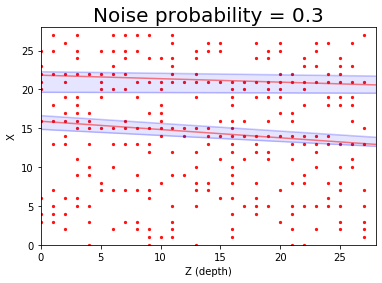

event_res_0.9_0.3_28.png


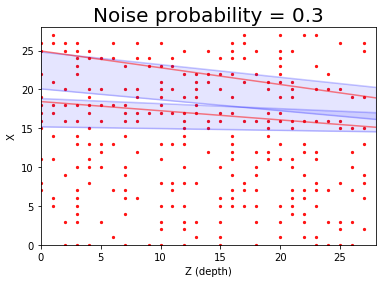

event_res_0.9_0.3_29.png


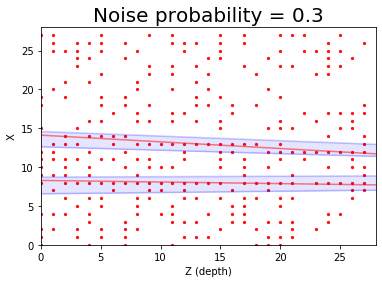

event_res_0.9_0.3_30.png


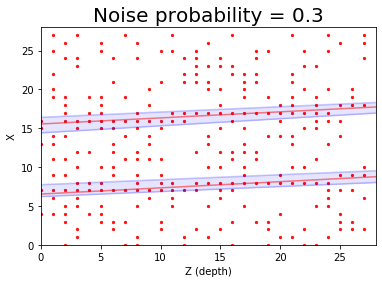

event_res_0.9_0.3_31.png


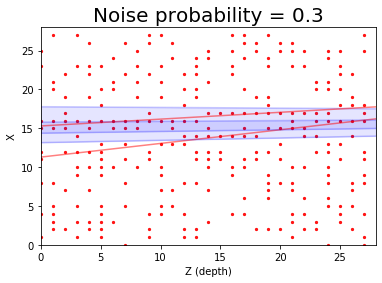

event_res_0.9_0.3_32.png


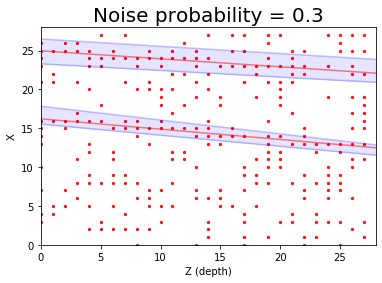

event_res_0.9_0.3_33.png


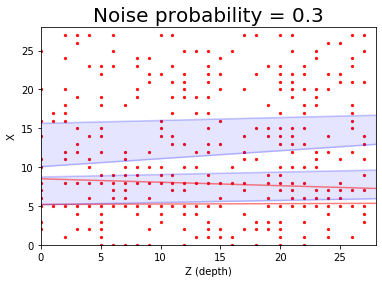

event_res_0.9_0.3_34.png


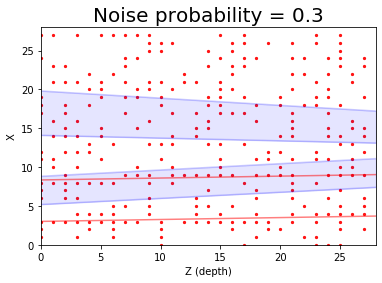

event_res_0.9_0.3_35.png


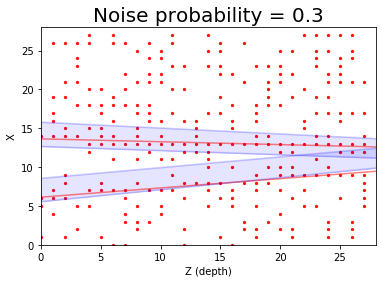

event_res_0.9_0.3_36.png


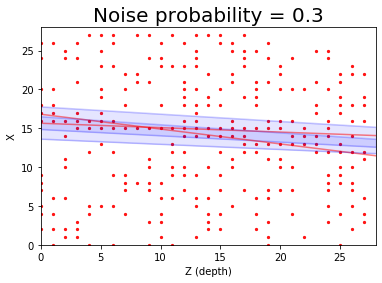

event_res_0.9_0.3_37.png


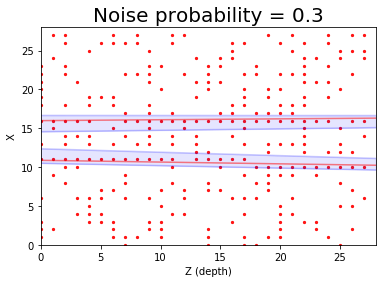

event_res_0.9_0.3_38.png


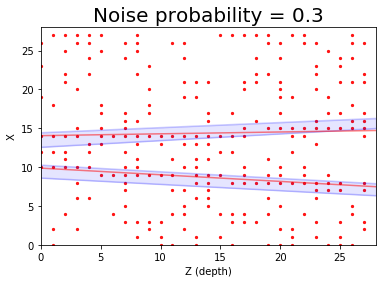

event_res_0.9_0.3_39.png


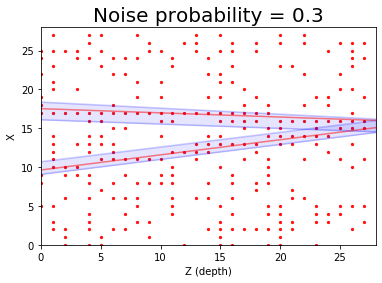

event_res_0.9_0.3_0.png


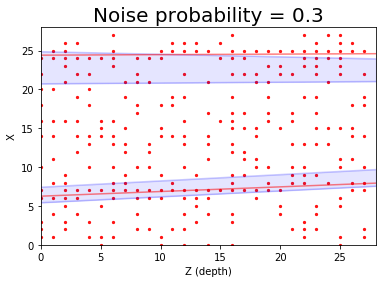

event_res_0.9_0.3_1.png


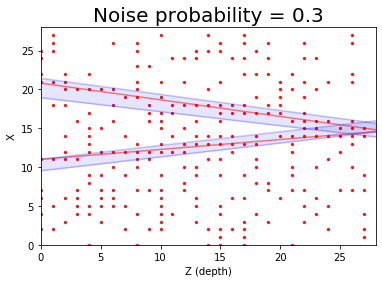

event_res_0.9_0.3_2.png


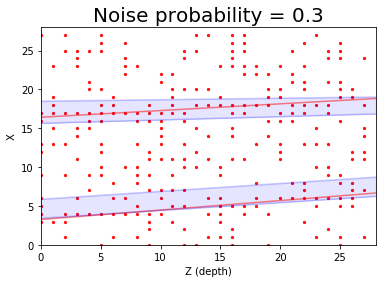

event_res_0.9_0.3_3.png


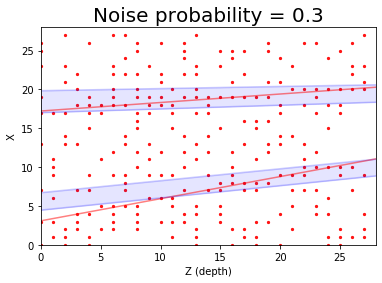

event_res_0.9_0.3_4.png


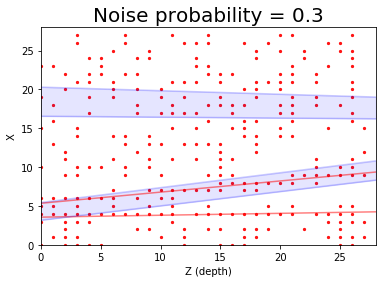

event_res_0.9_0.3_5.png


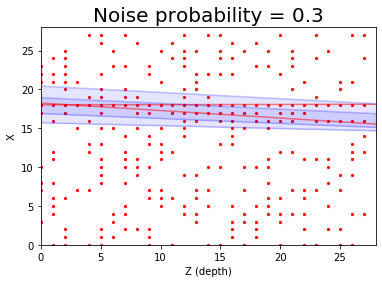

event_res_0.9_0.3_6.png


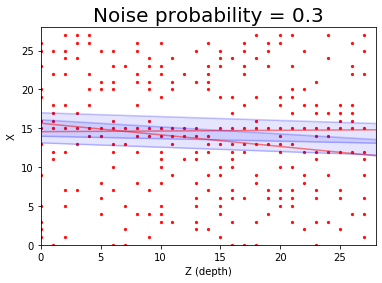

event_res_0.9_0.3_7.png


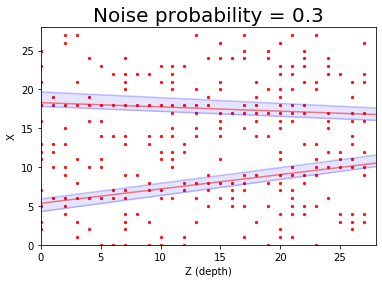

event_res_0.9_0.3_8.png


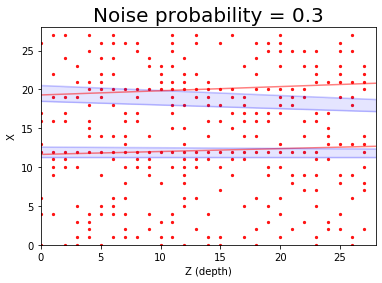

event_res_0.9_0.3_9.png


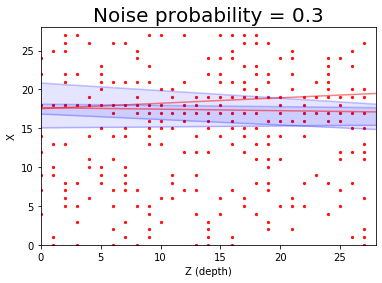

event_res_0.9_0.3_10.png


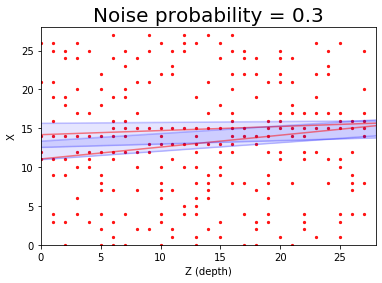

event_res_0.9_0.3_11.png


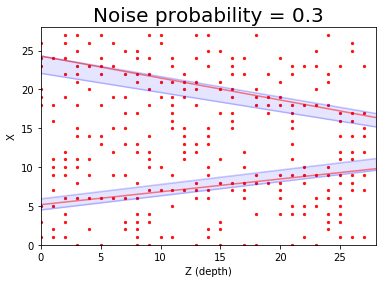

event_res_0.9_0.3_12.png


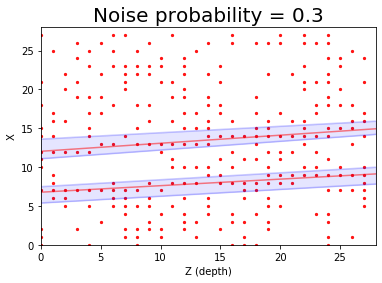

event_res_0.9_0.3_13.png


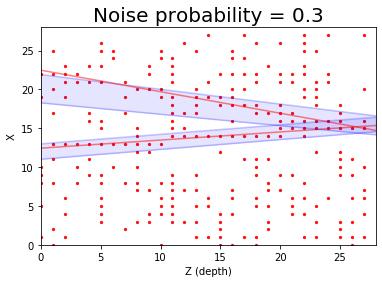

event_res_0.9_0.3_14.png


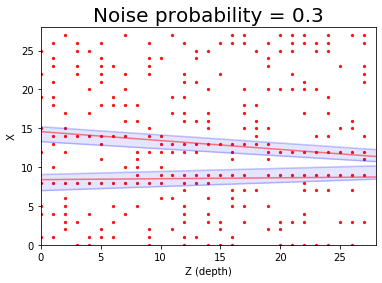

event_res_0.9_0.3_15.png


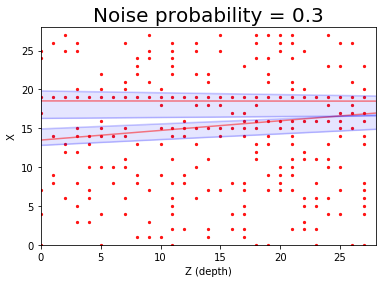

event_res_0.9_0.3_16.png


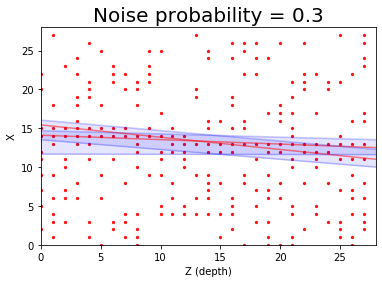

event_res_0.9_0.3_17.png


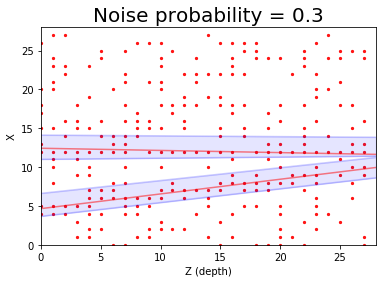

event_res_0.9_0.3_18.png


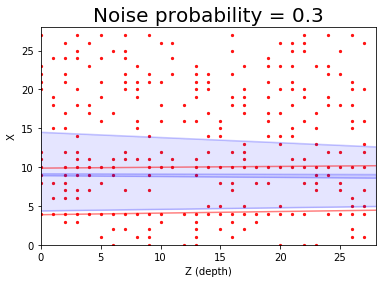

event_res_0.9_0.3_19.png


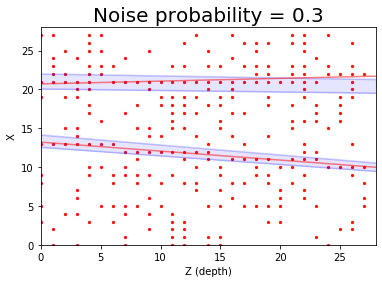

event_res_0.9_0.3_20.png


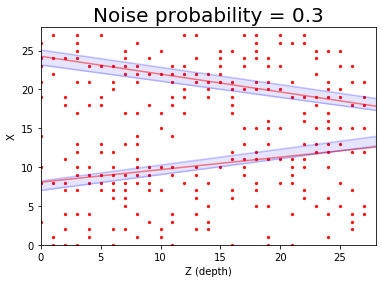

event_res_0.9_0.3_21.png


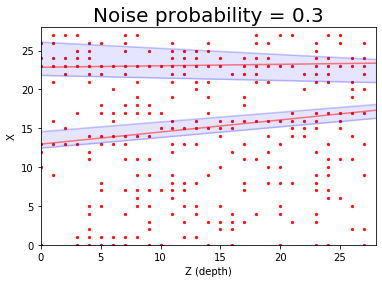

event_res_0.9_0.3_22.png


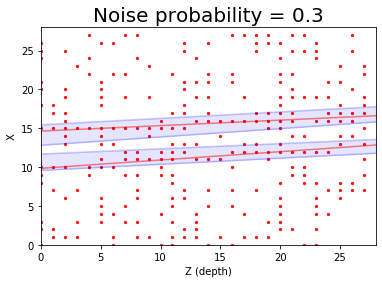

event_res_0.9_0.3_23.png


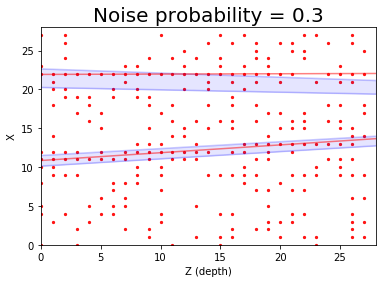

event_res_0.9_0.3_24.png


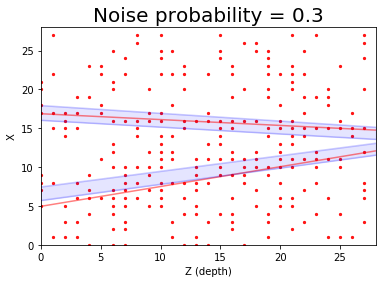

event_res_0.9_0.3_25.png


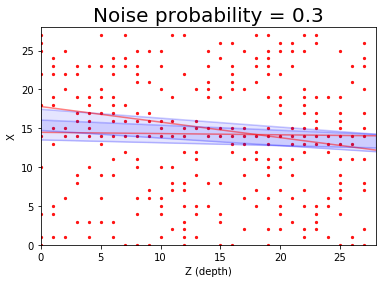

event_res_0.9_0.3_26.png


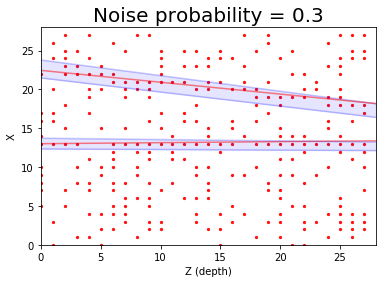

event_res_0.9_0.3_27.png


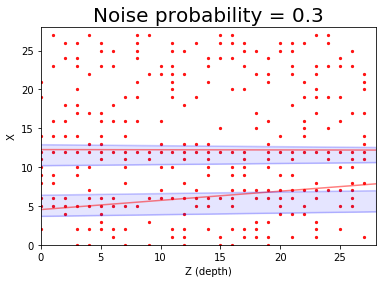

event_res_0.9_0.3_28.png


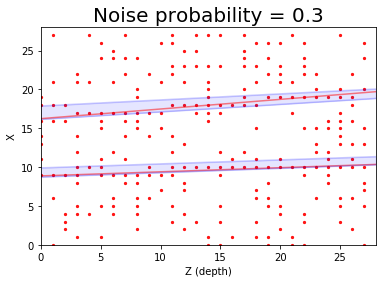

event_res_0.9_0.3_29.png


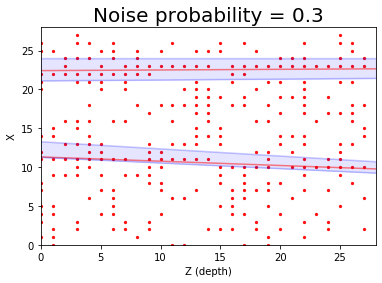

event_res_0.9_0.3_30.png


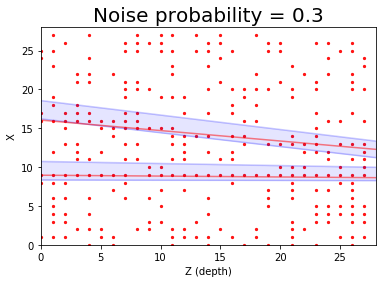

event_res_0.9_0.3_31.png


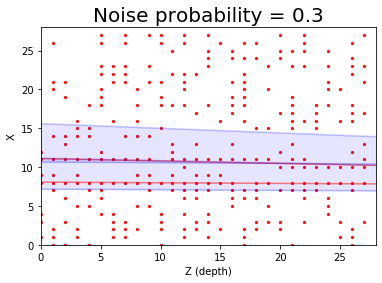

event_res_0.9_0.3_32.png


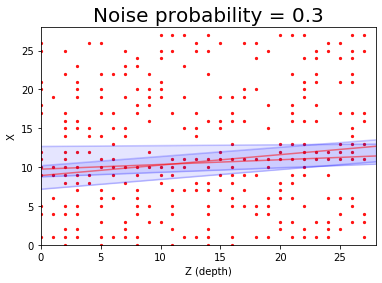

event_res_0.9_0.3_33.png


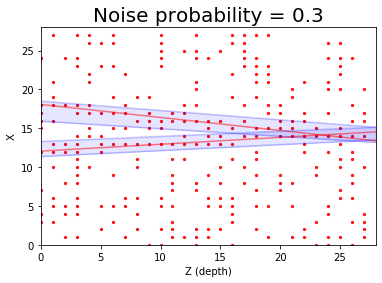

event_res_0.9_0.3_34.png


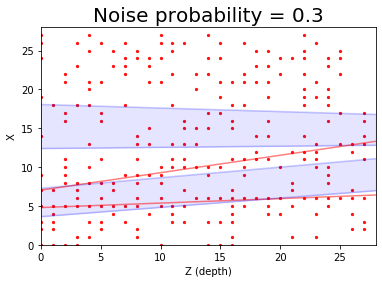

event_res_0.9_0.3_35.png


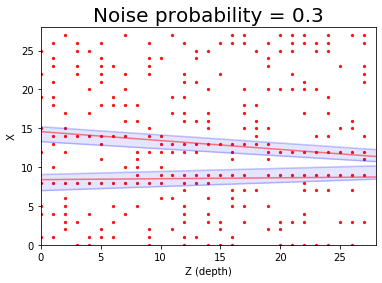

event_res_0.9_0.3_36.png


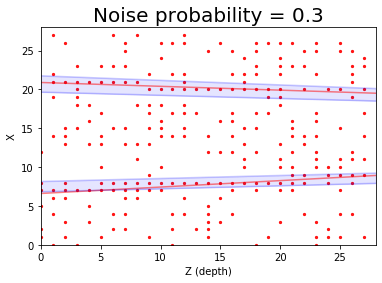

event_res_0.9_0.3_37.png


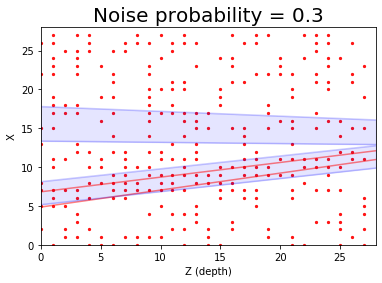

event_res_0.9_0.3_38.png


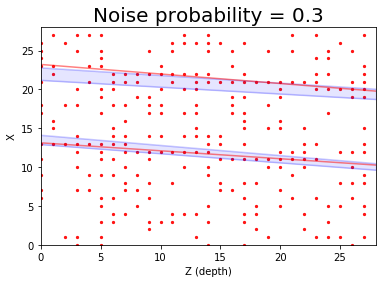

event_res_0.9_0.3_39.png


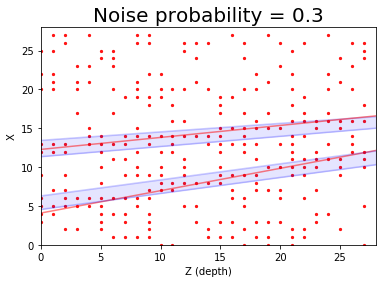

event_res_0.9_0.3_0.png


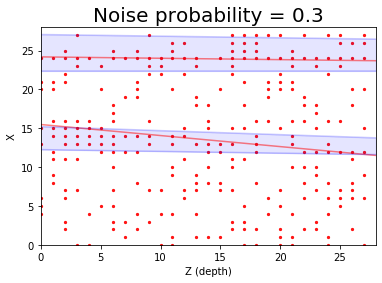

event_res_0.9_0.3_1.png


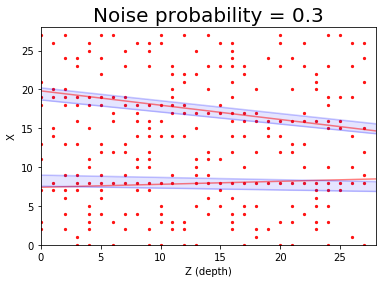

event_res_0.9_0.3_2.png


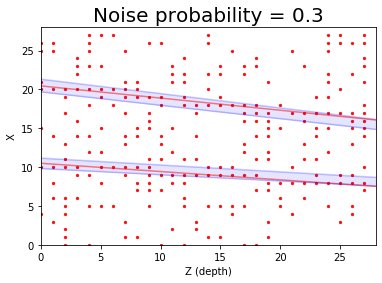

event_res_0.9_0.3_3.png


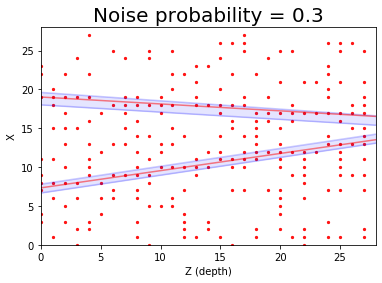

event_res_0.9_0.3_4.png


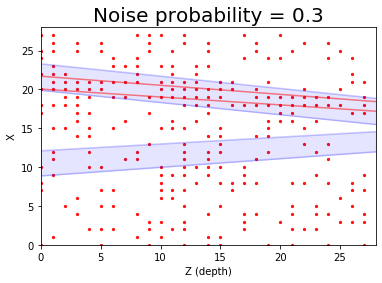

event_res_0.9_0.3_5.png


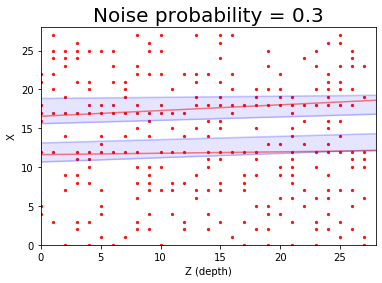

event_res_0.9_0.3_6.png


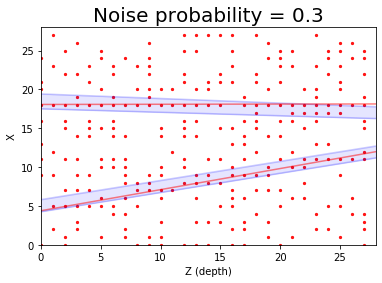

event_res_0.9_0.3_7.png


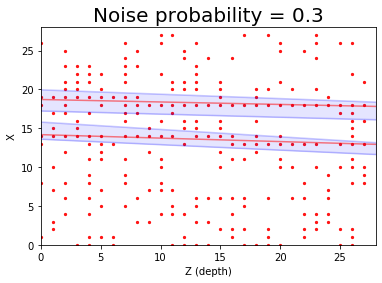

event_res_0.9_0.3_8.png


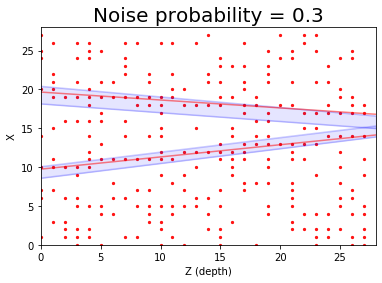

event_res_0.9_0.3_9.png


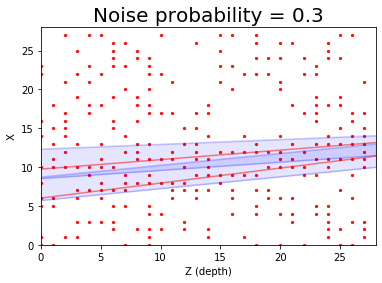

event_res_0.9_0.3_10.png


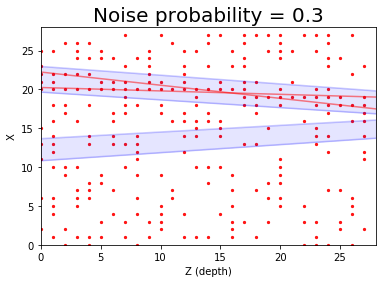

event_res_0.9_0.3_11.png


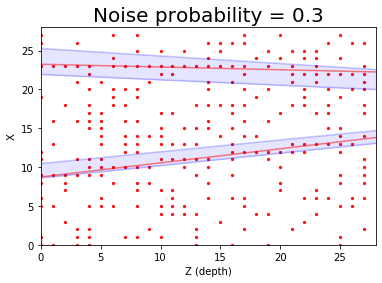

event_res_0.9_0.3_12.png


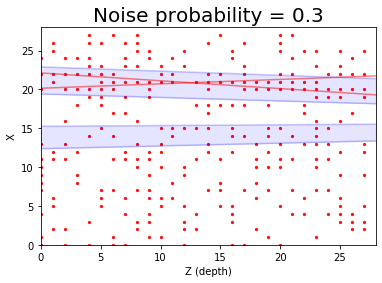

event_res_0.9_0.3_13.png


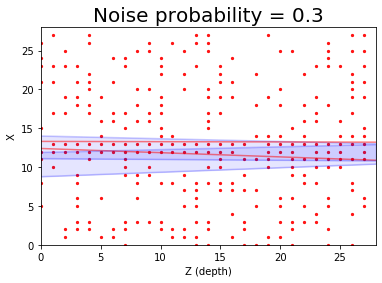

event_res_0.9_0.3_14.png


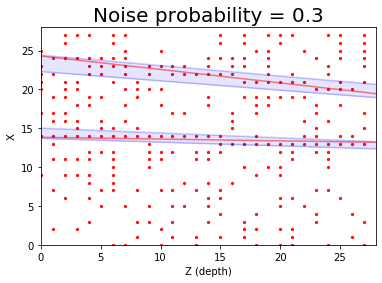

event_res_0.9_0.3_15.png


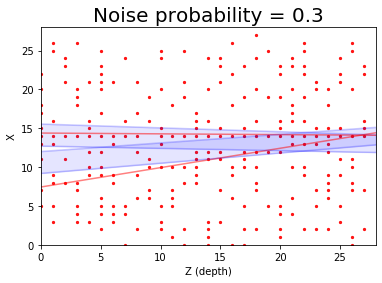

event_res_0.9_0.3_16.png


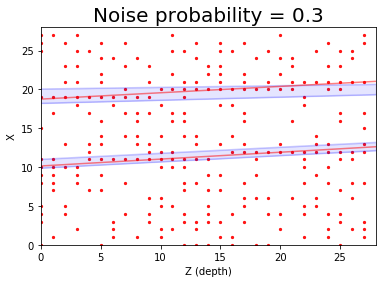

event_res_0.9_0.3_17.png


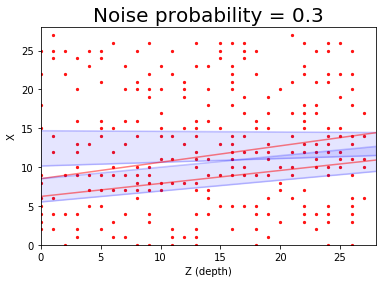

event_res_0.9_0.3_18.png


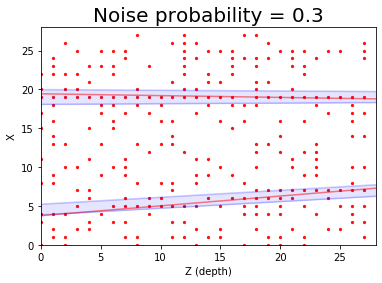

event_res_0.9_0.3_19.png


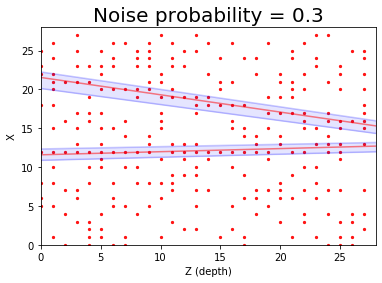

event_res_0.9_0.3_20.png


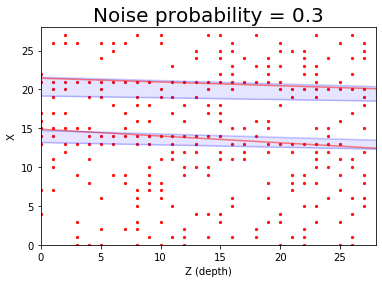

event_res_0.9_0.3_21.png


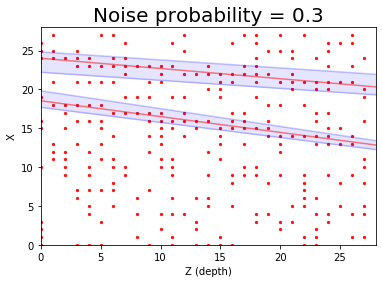

event_res_0.9_0.3_22.png


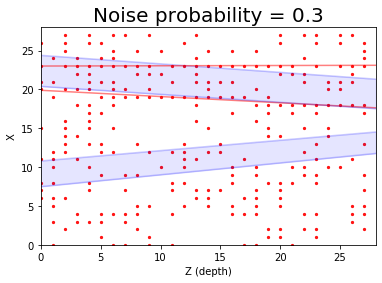

event_res_0.9_0.3_23.png


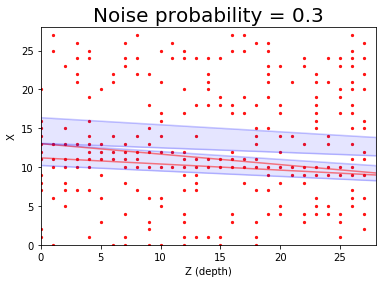

event_res_0.9_0.3_24.png


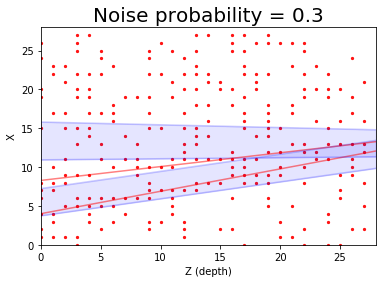

event_res_0.9_0.3_25.png


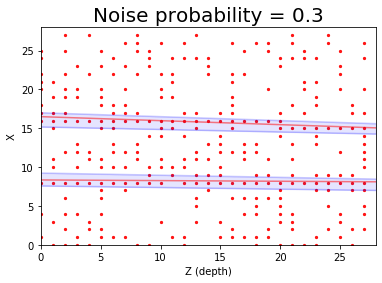

event_res_0.9_0.3_26.png


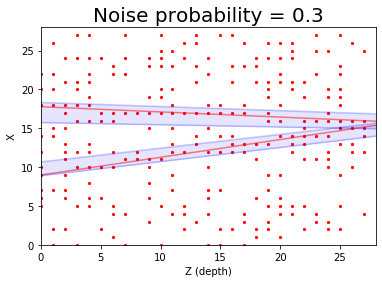

event_res_0.9_0.3_27.png


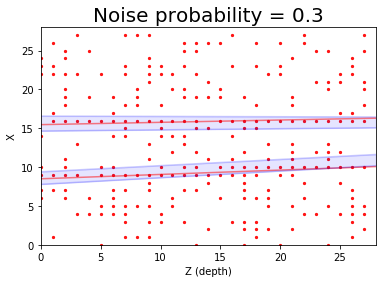

event_res_0.9_0.3_28.png


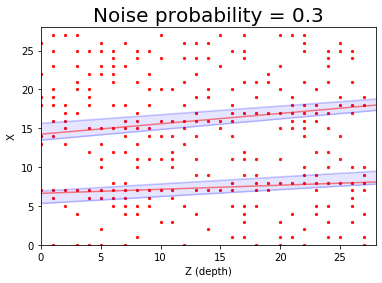

event_res_0.9_0.3_29.png


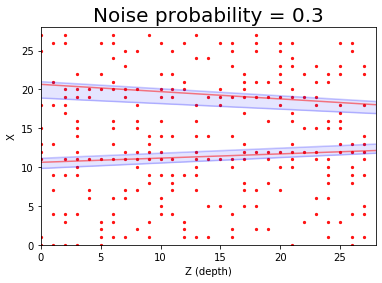

event_res_0.9_0.3_30.png


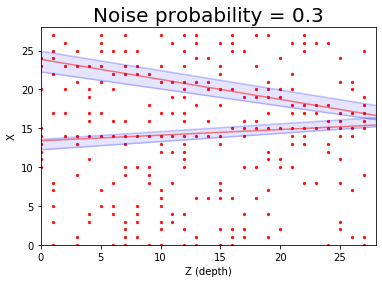

event_res_0.9_0.3_31.png


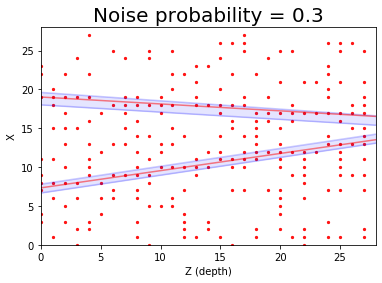

event_res_0.9_0.3_32.png


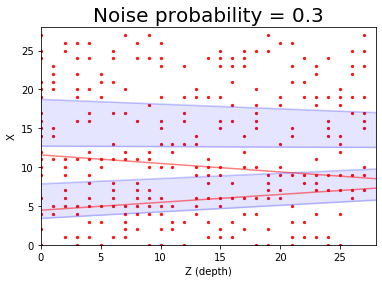

event_res_0.9_0.3_33.png


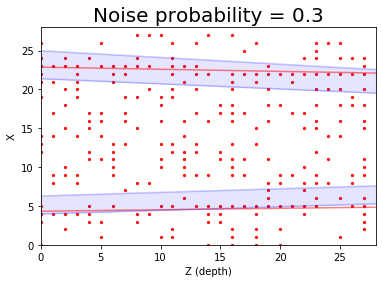

event_res_0.9_0.3_34.png


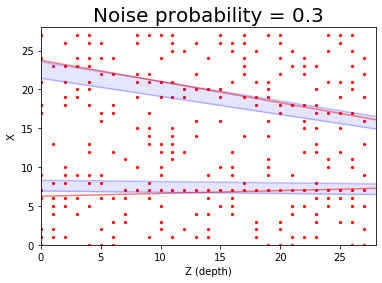

event_res_0.9_0.3_35.png


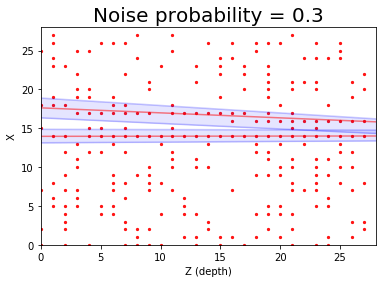

event_res_0.9_0.3_36.png


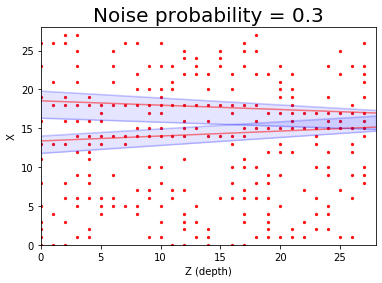

event_res_0.9_0.3_37.png


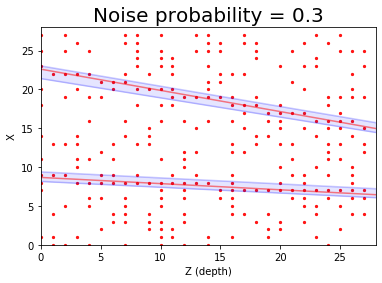

event_res_0.9_0.3_38.png


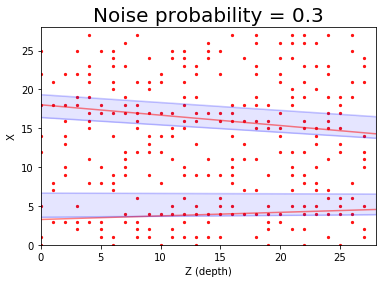

event_res_0.9_0.3_39.png


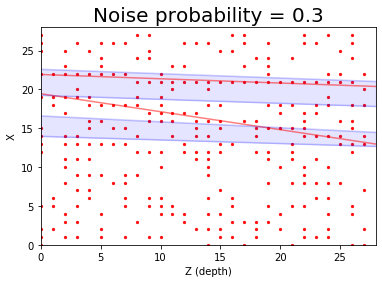

event_res_0.9_0.3_0.png


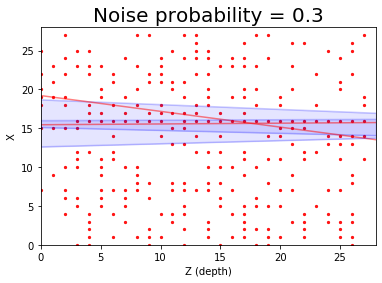

event_res_0.9_0.3_1.png


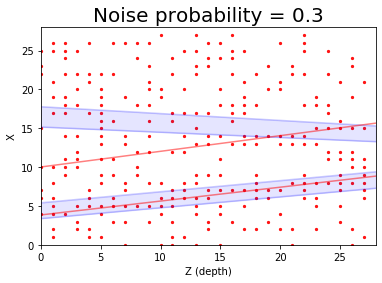

event_res_0.9_0.3_2.png


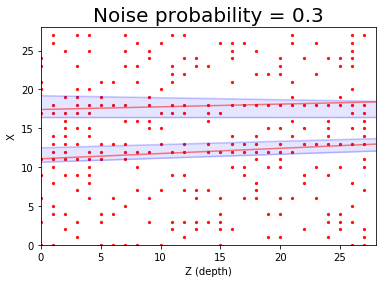

event_res_0.9_0.3_3.png


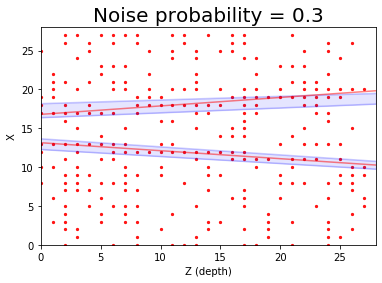

event_res_0.9_0.3_4.png


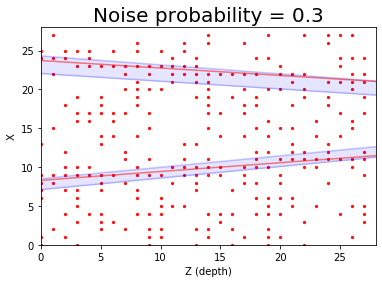

event_res_0.9_0.3_5.png


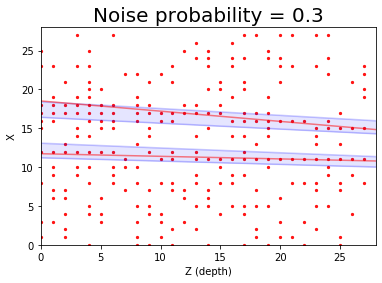

event_res_0.9_0.3_6.png


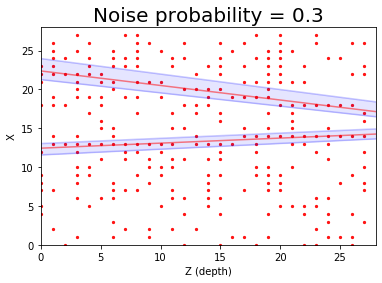

event_res_0.9_0.3_7.png


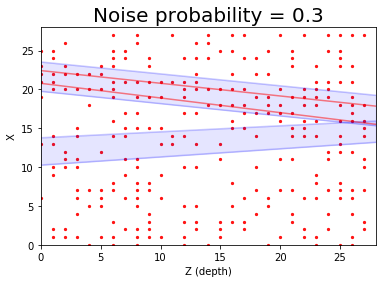

event_res_0.9_0.3_8.png


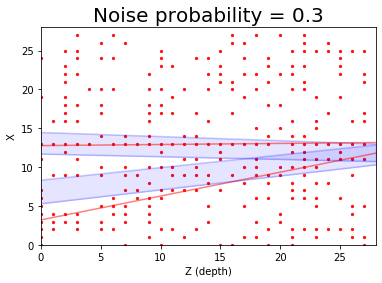

event_res_0.9_0.3_9.png


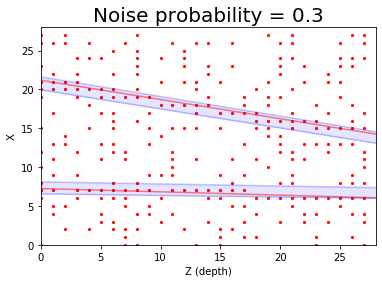

event_res_0.9_0.3_10.png


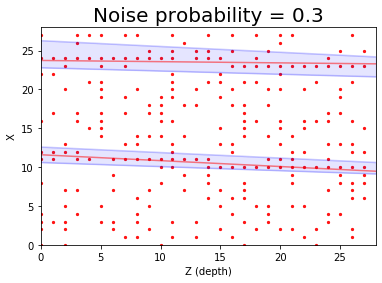

event_res_0.9_0.3_11.png


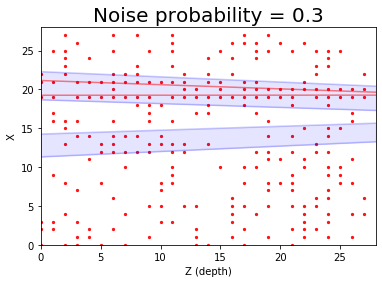

event_res_0.9_0.3_12.png


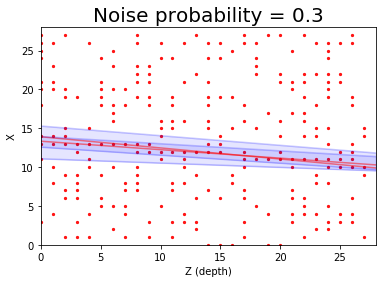

event_res_0.9_0.3_13.png


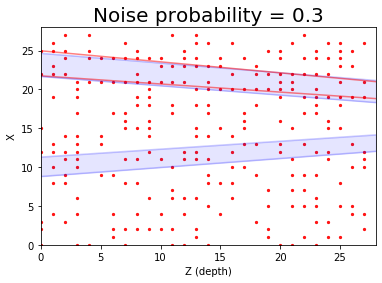

event_res_0.9_0.3_14.png


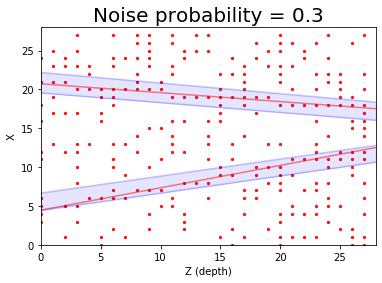

event_res_0.9_0.3_15.png


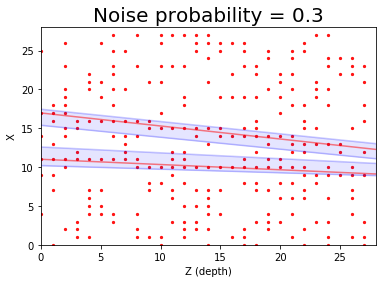

event_res_0.9_0.3_16.png


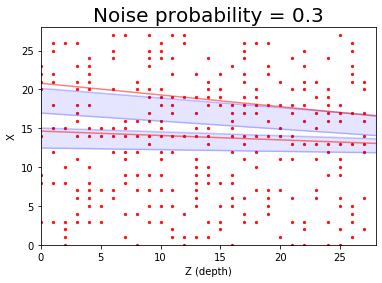

event_res_0.9_0.3_17.png


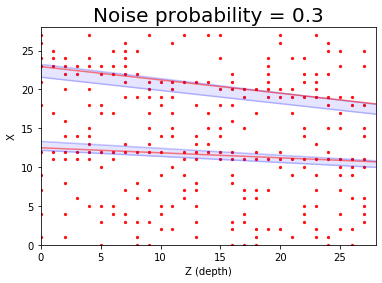

event_res_0.9_0.3_18.png


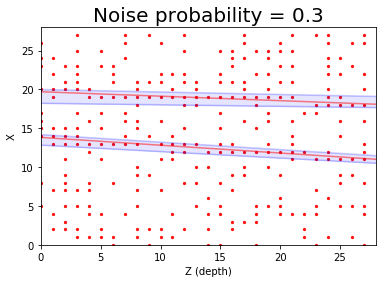

event_res_0.9_0.3_19.png


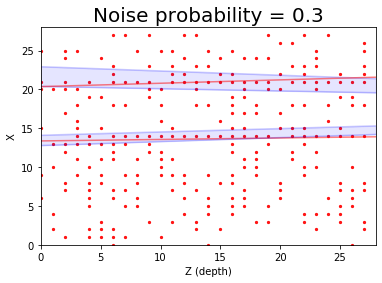

event_res_0.9_0.3_20.png


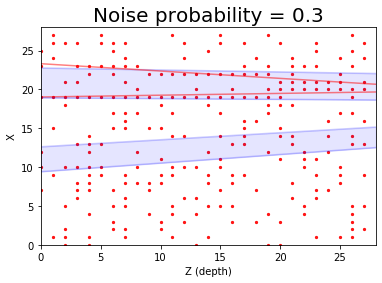

event_res_0.9_0.3_21.png


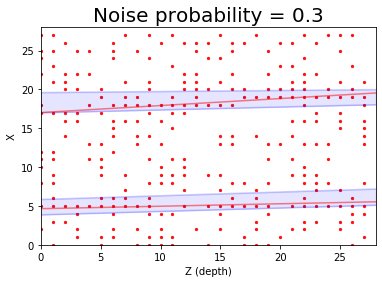

event_res_0.9_0.3_22.png


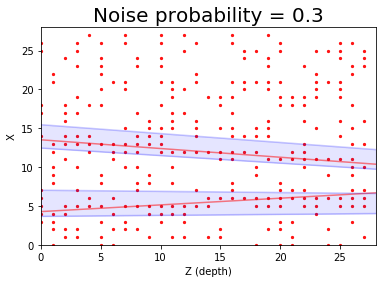

event_res_0.9_0.3_23.png


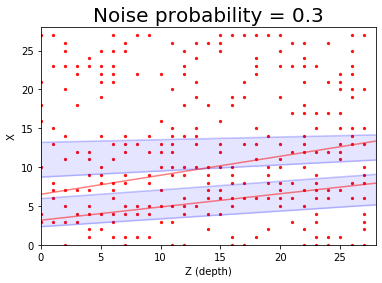

event_res_0.9_0.3_24.png


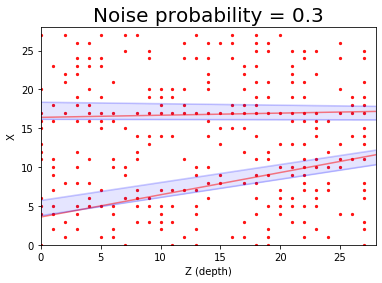

event_res_0.9_0.3_25.png


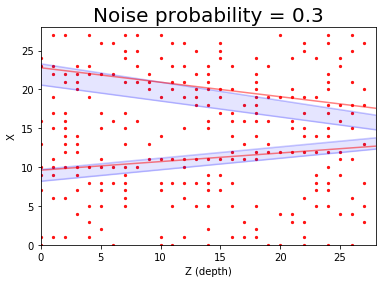

event_res_0.9_0.3_26.png


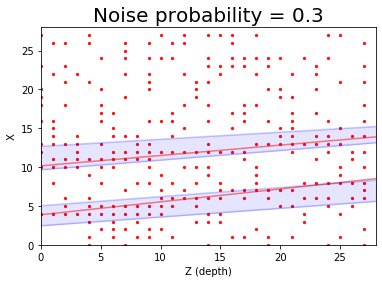

event_res_0.9_0.3_27.png


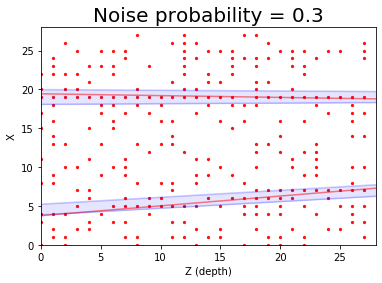

event_res_0.9_0.3_28.png


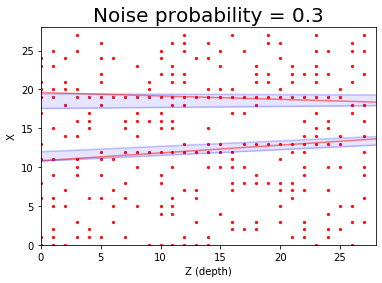

event_res_0.9_0.3_29.png


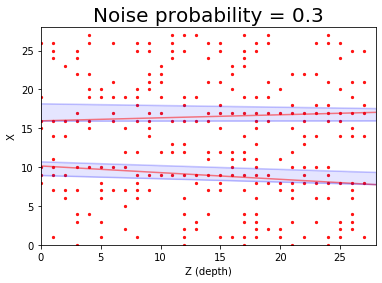

event_res_0.9_0.3_30.png


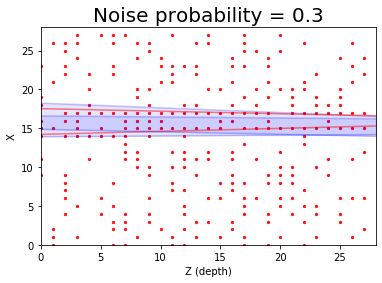

event_res_0.9_0.3_31.png


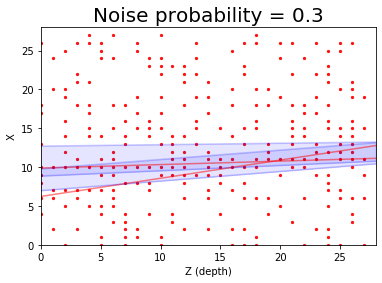

event_res_0.9_0.3_32.png


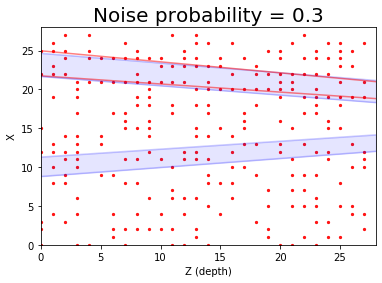

event_res_0.9_0.3_33.png


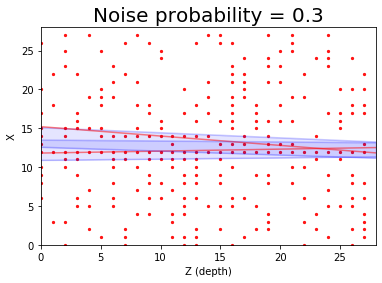

event_res_0.9_0.3_34.png


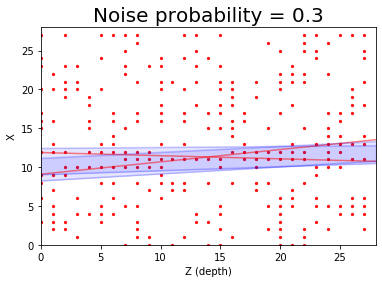

event_res_0.9_0.3_35.png


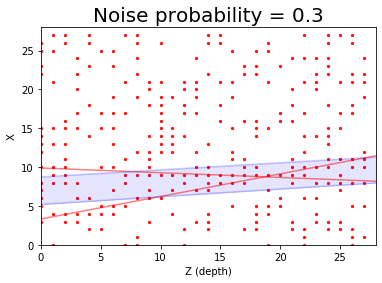

event_res_0.9_0.3_36.png


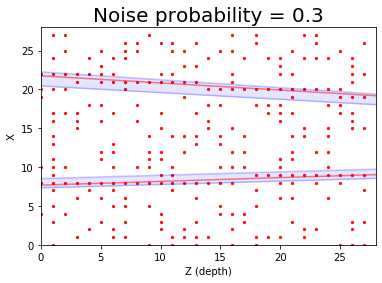

event_res_0.9_0.3_37.png


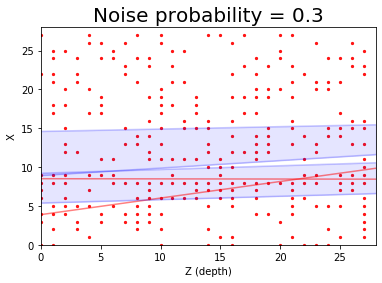

event_res_0.9_0.3_38.png


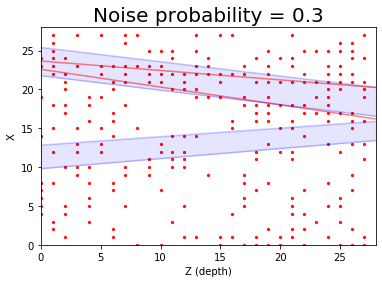

event_res_0.9_0.3_39.png


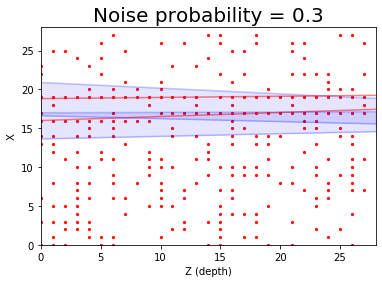

event_res_0.9_0.3_0.png


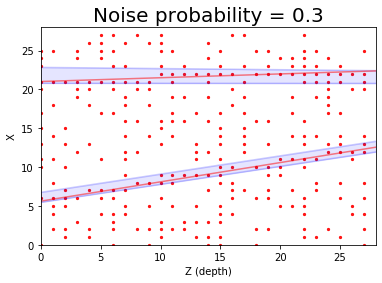

event_res_0.9_0.3_1.png


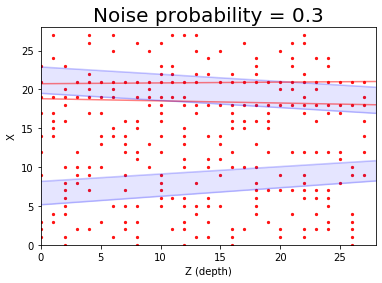

event_res_0.9_0.3_2.png


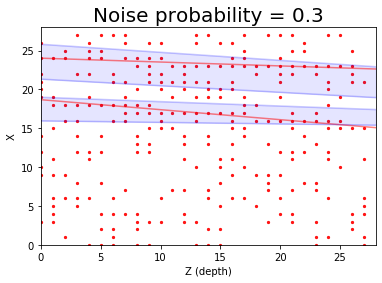

event_res_0.9_0.3_3.png


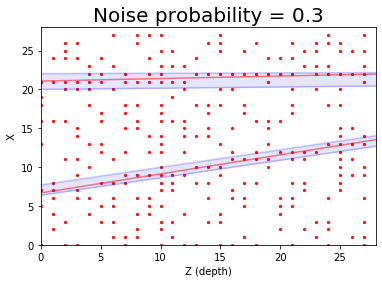

event_res_0.9_0.3_4.png


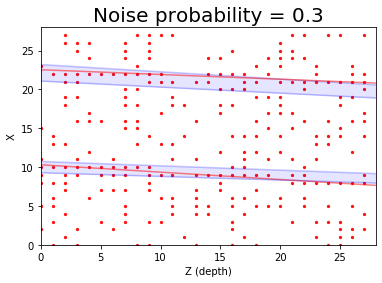

event_res_0.9_0.3_5.png


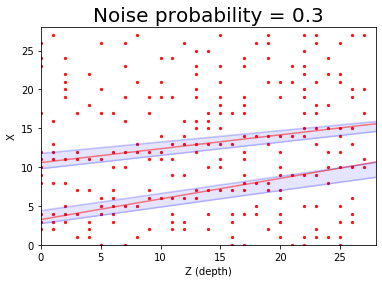

event_res_0.9_0.3_6.png


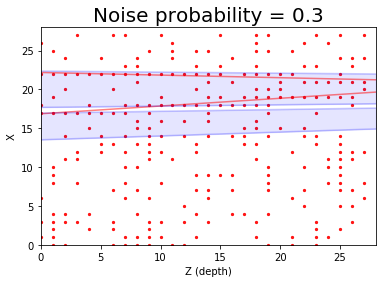

event_res_0.9_0.3_7.png


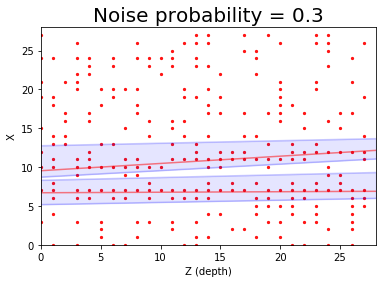

event_res_0.9_0.3_8.png


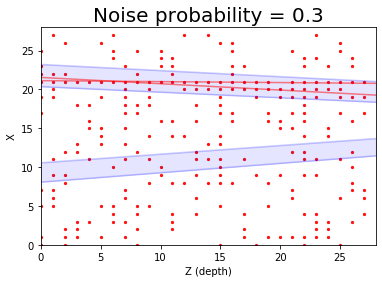

event_res_0.9_0.3_9.png


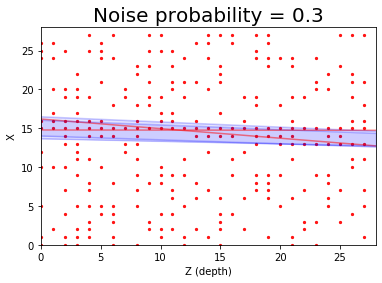

event_res_0.9_0.3_10.png


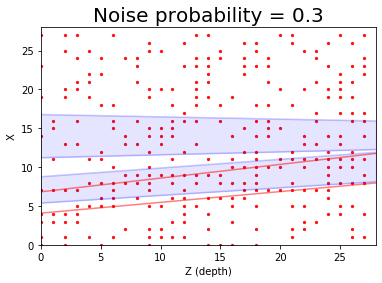

event_res_0.9_0.3_11.png


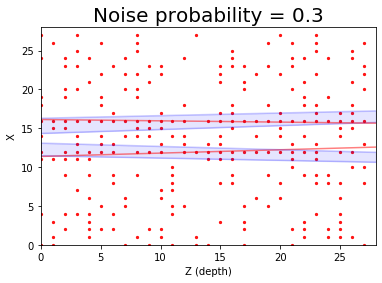

event_res_0.9_0.3_12.png


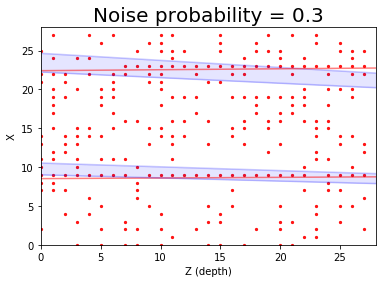

event_res_0.9_0.3_13.png


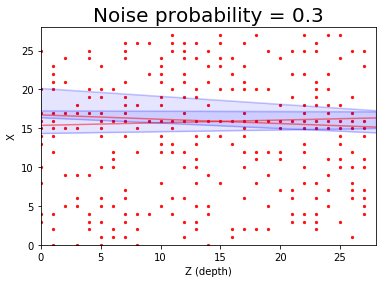

event_res_0.9_0.3_14.png


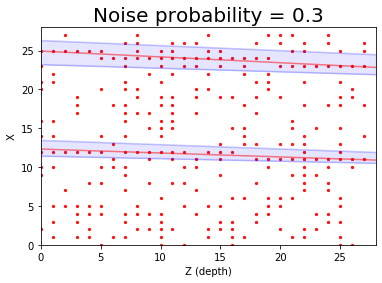

event_res_0.9_0.3_15.png


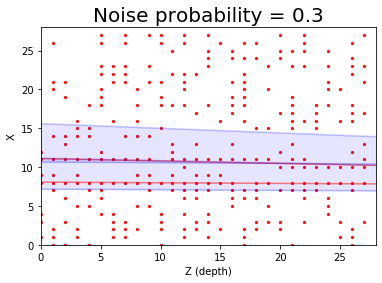

event_res_0.9_0.3_16.png


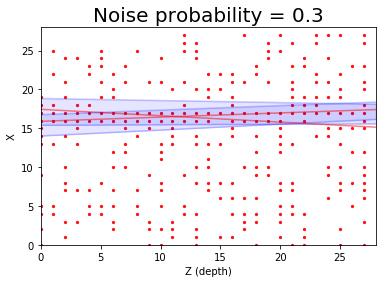

event_res_0.9_0.3_17.png


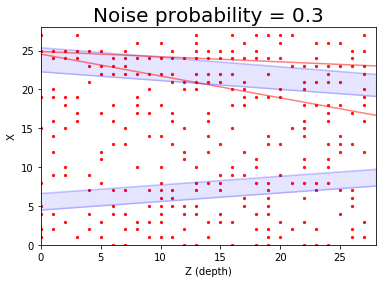

event_res_0.9_0.3_18.png


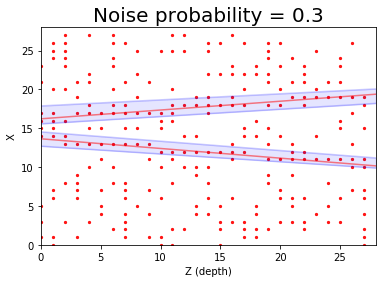

event_res_0.9_0.3_19.png


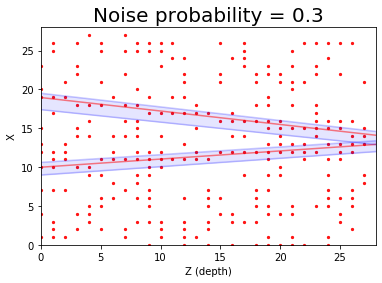

event_res_0.9_0.3_20.png


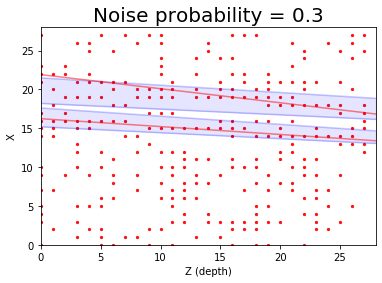

event_res_0.9_0.3_21.png


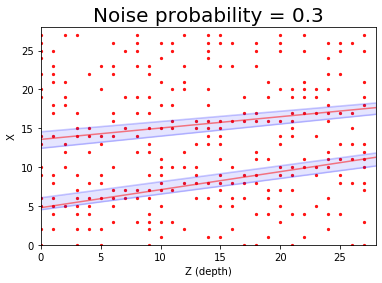

event_res_0.9_0.3_22.png


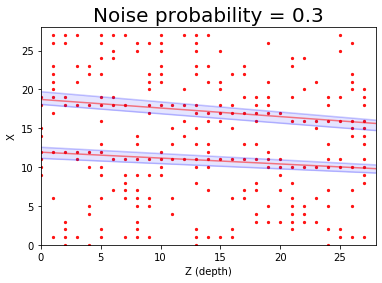

event_res_0.9_0.3_23.png


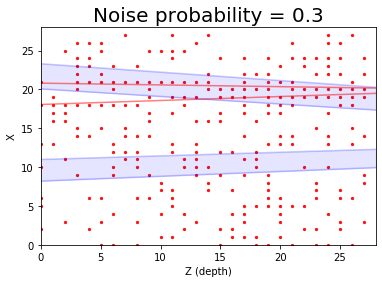

event_res_0.9_0.3_24.png


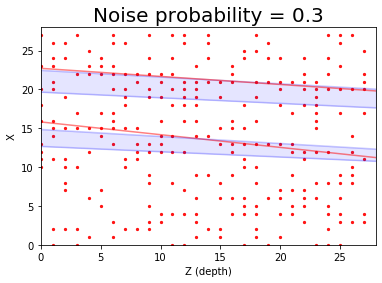

event_res_0.9_0.3_25.png


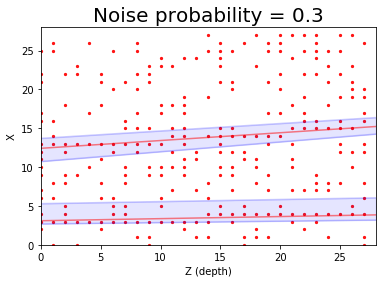

event_res_0.9_0.3_26.png


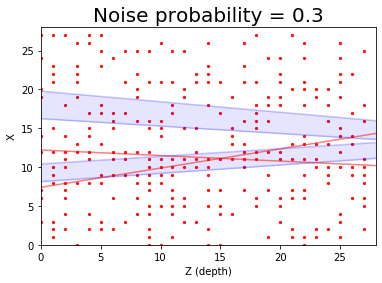

event_res_0.9_0.3_27.png


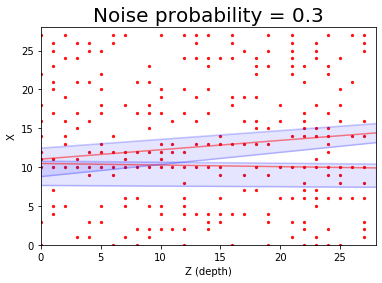

event_res_0.9_0.3_28.png


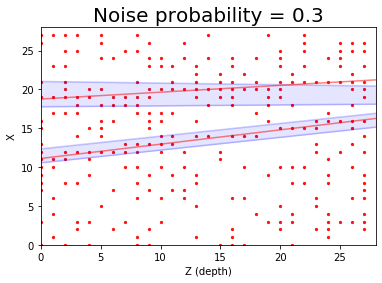

event_res_0.9_0.3_29.png


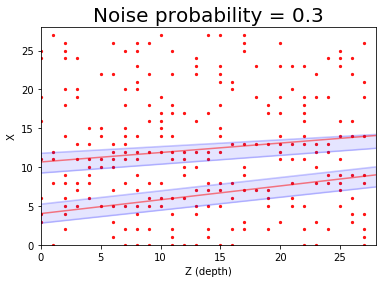

event_res_0.9_0.3_30.png


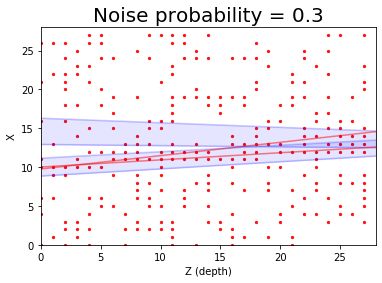

event_res_0.9_0.3_31.png


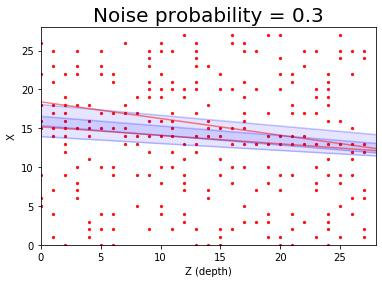

event_res_0.9_0.3_32.png


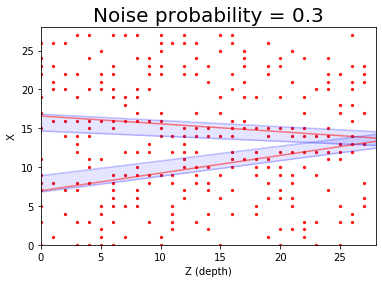

event_res_0.9_0.3_33.png


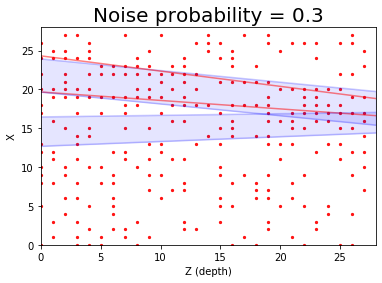

event_res_0.9_0.3_34.png


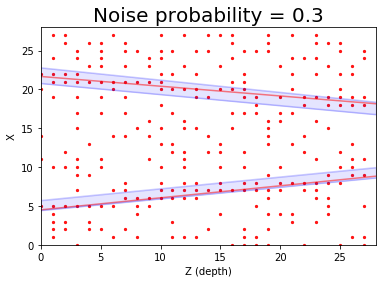

event_res_0.9_0.3_35.png


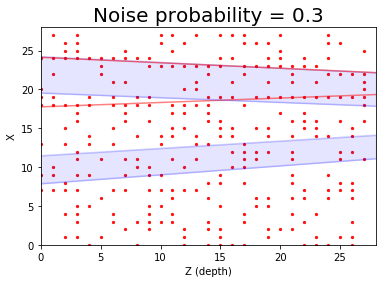

event_res_0.9_0.3_36.png


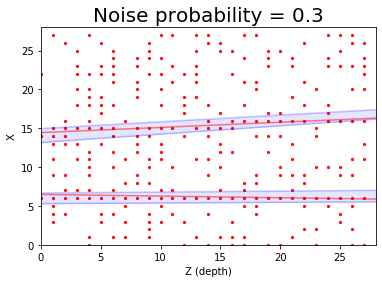

event_res_0.9_0.3_37.png


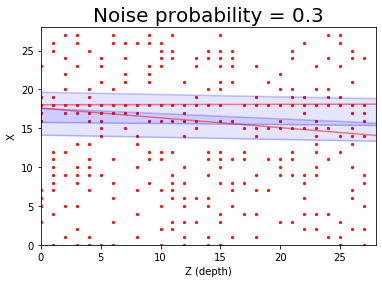

event_res_0.9_0.3_38.png


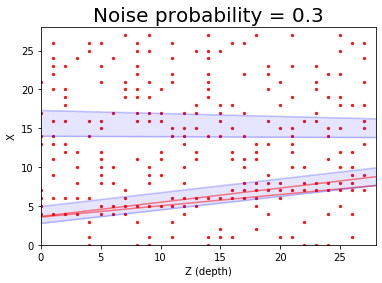

event_res_0.9_0.3_39.png


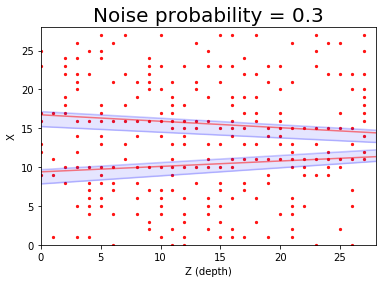

event_res_0.9_0.3_0.png


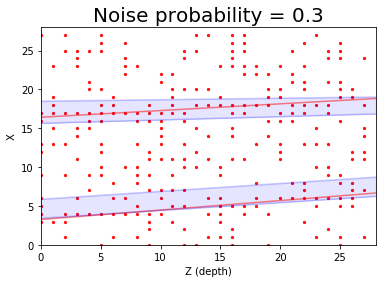

event_res_0.9_0.3_1.png


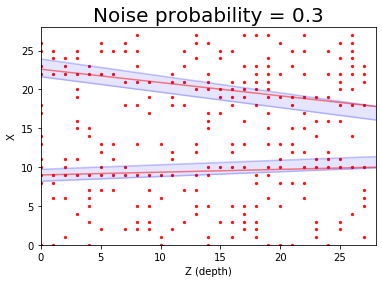

event_res_0.9_0.3_2.png


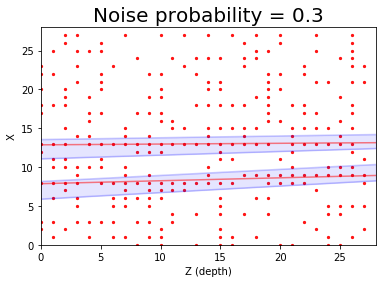

event_res_0.9_0.3_3.png


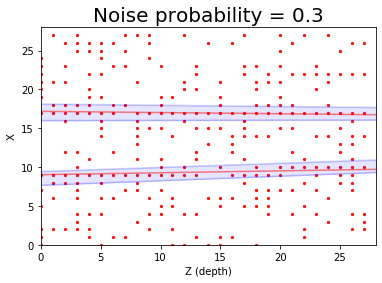

event_res_0.9_0.3_4.png


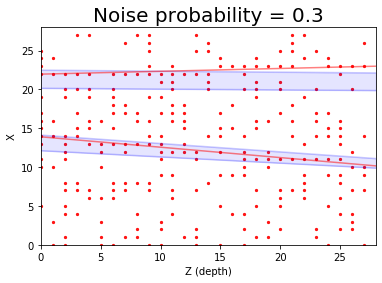

event_res_0.9_0.3_5.png


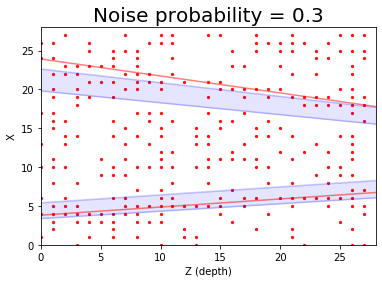

event_res_0.9_0.3_6.png


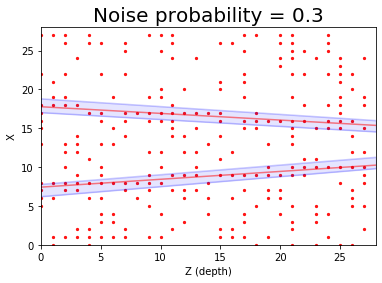

event_res_0.9_0.3_7.png


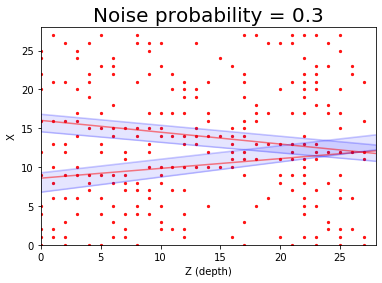

event_res_0.9_0.3_8.png


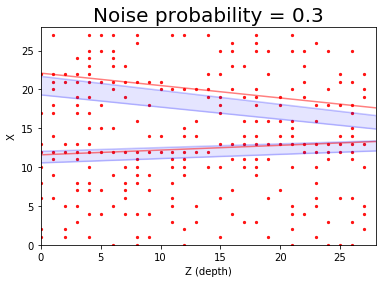

event_res_0.9_0.3_9.png


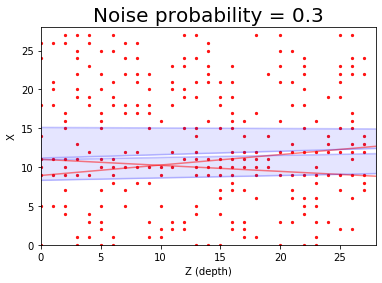

event_res_0.9_0.3_10.png


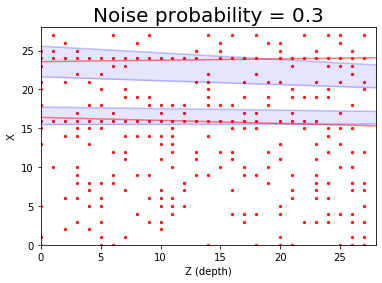

event_res_0.9_0.3_11.png


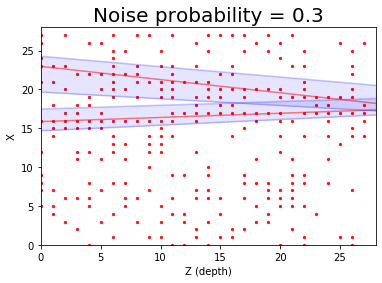

event_res_0.9_0.3_12.png


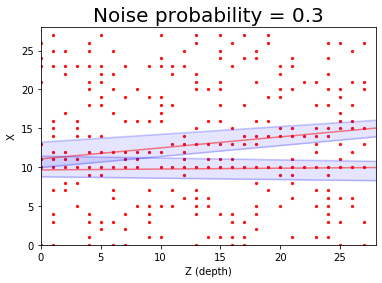

event_res_0.9_0.3_13.png


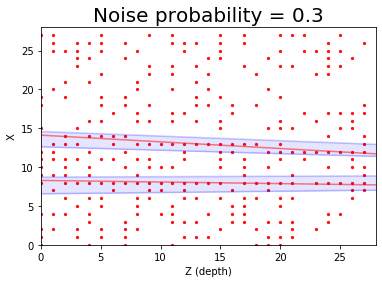

event_res_0.9_0.3_14.png


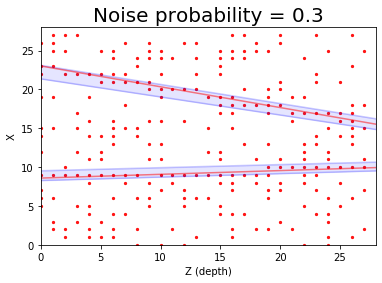

event_res_0.9_0.3_15.png


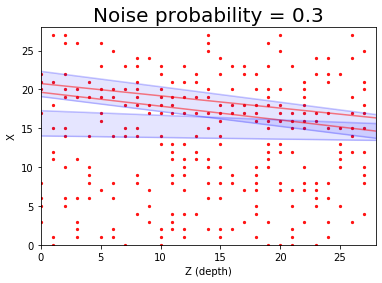

event_res_0.9_0.3_16.png


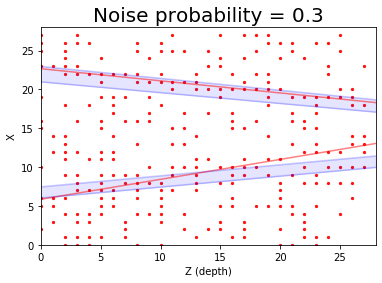

event_res_0.9_0.3_17.png


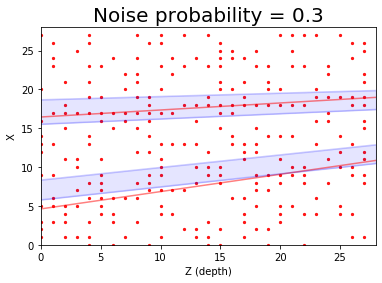

event_res_0.9_0.3_18.png


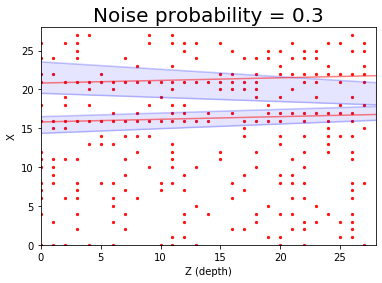

event_res_0.9_0.3_19.png


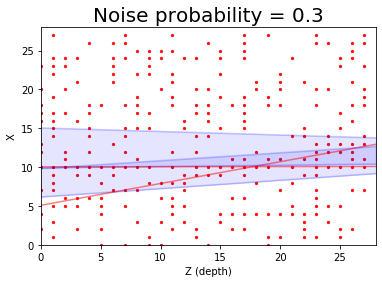

event_res_0.9_0.3_20.png


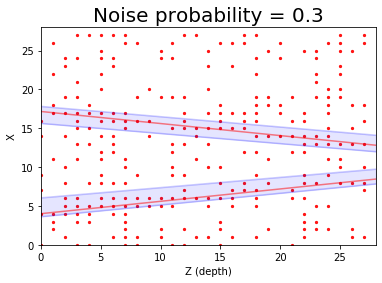

event_res_0.9_0.3_21.png


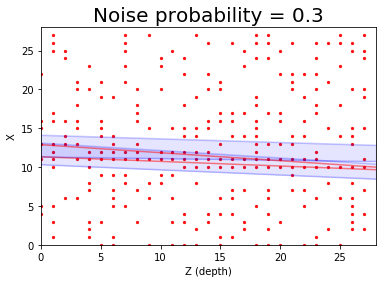

event_res_0.9_0.3_22.png


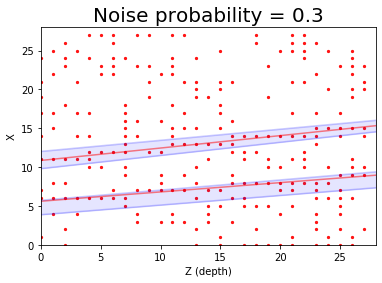

event_res_0.9_0.3_23.png


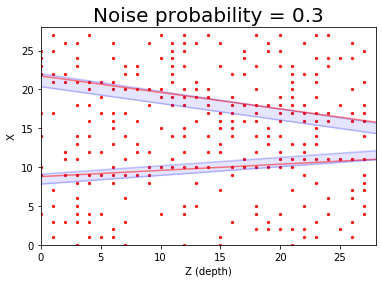

event_res_0.9_0.3_24.png


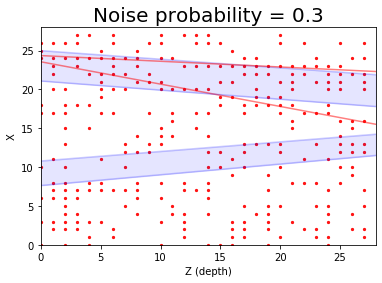

event_res_0.9_0.3_25.png


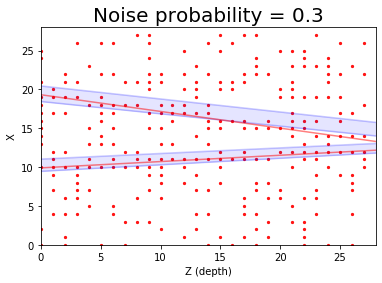

event_res_0.9_0.3_26.png


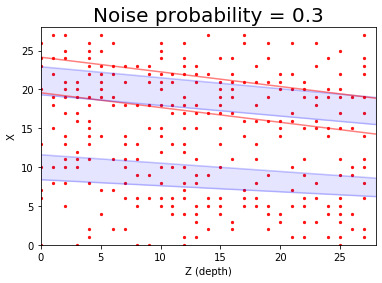

event_res_0.9_0.3_27.png


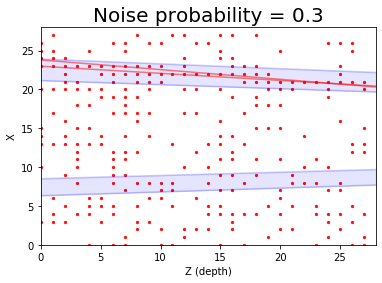

event_res_0.9_0.3_28.png


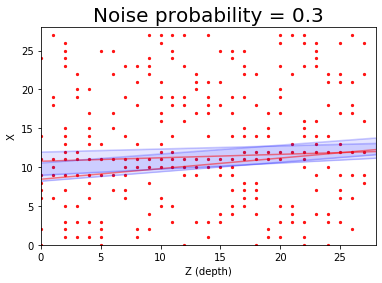

event_res_0.9_0.3_29.png


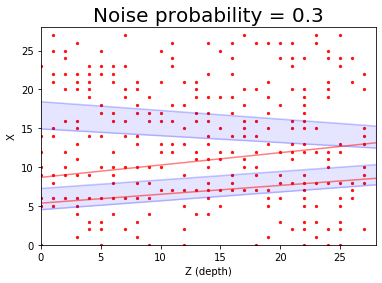

event_res_0.9_0.3_30.png


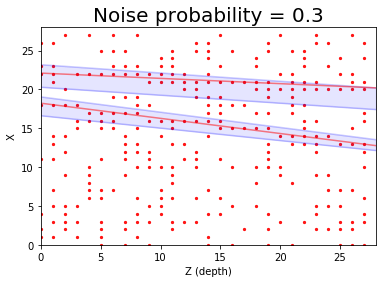

event_res_0.9_0.3_31.png


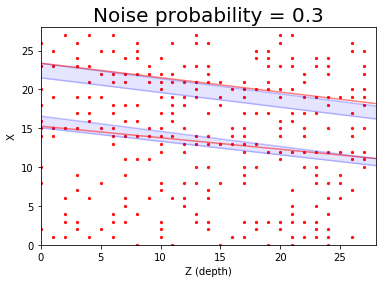

event_res_0.9_0.3_32.png


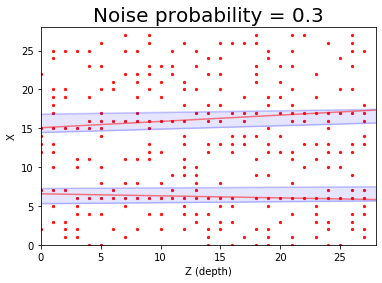

event_res_0.9_0.3_33.png


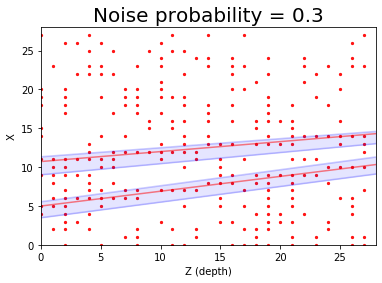

event_res_0.9_0.3_34.png


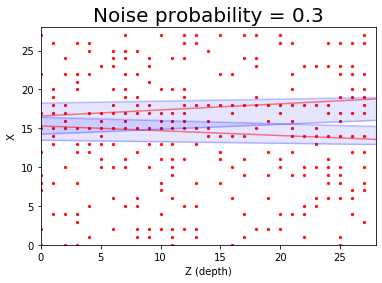

event_res_0.9_0.3_35.png


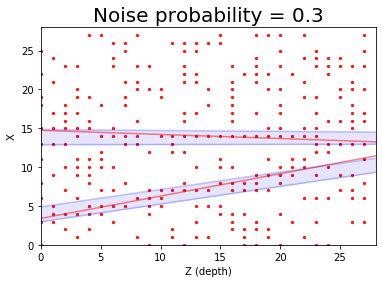

event_res_0.9_0.3_36.png


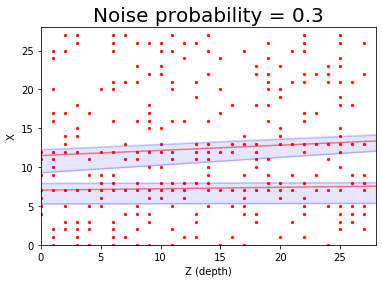

event_res_0.9_0.3_37.png


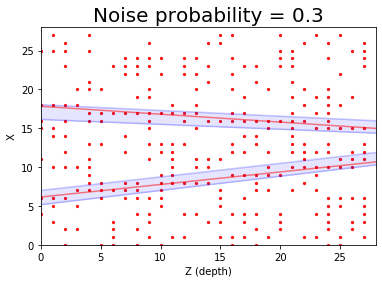

event_res_0.9_0.3_38.png


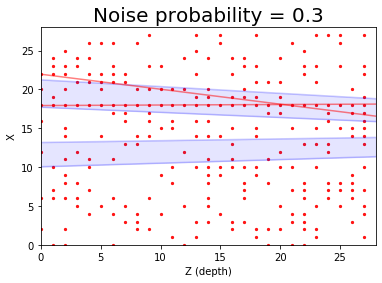

event_res_0.9_0.3_39.png


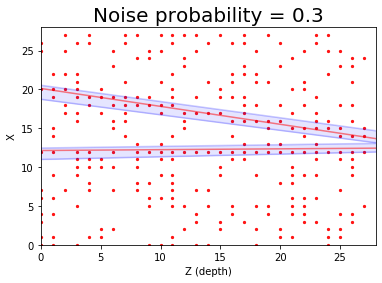

event_res_0.9_0.3_0.png


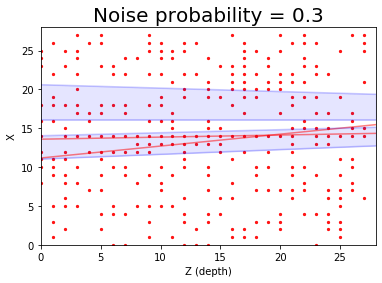

event_res_0.9_0.3_1.png


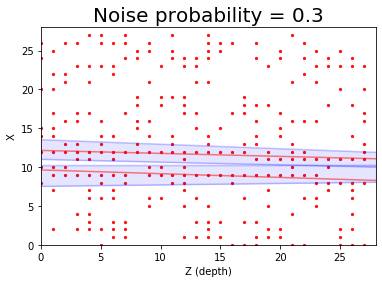

event_res_0.9_0.3_2.png


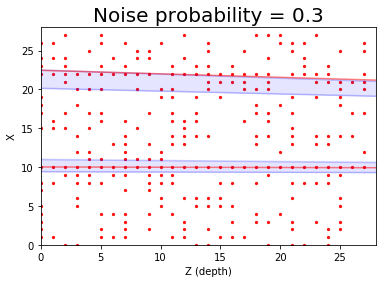

event_res_0.9_0.3_3.png


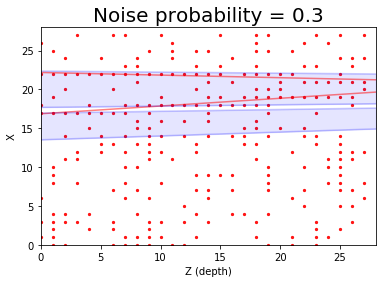

event_res_0.9_0.3_4.png


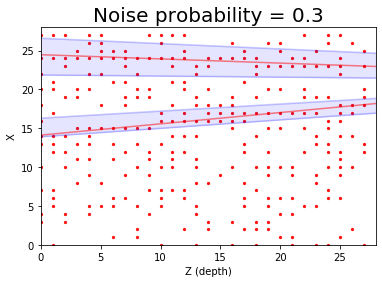

event_res_0.9_0.3_5.png


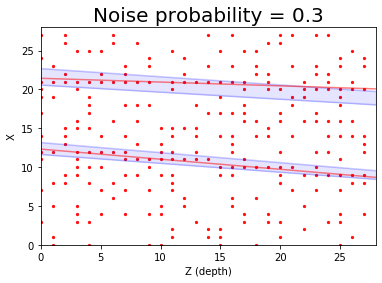

event_res_0.9_0.3_6.png


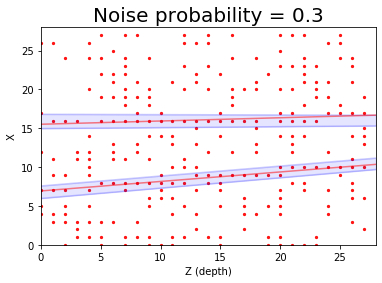

event_res_0.9_0.3_7.png


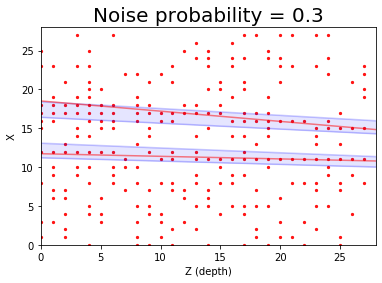

event_res_0.9_0.3_8.png


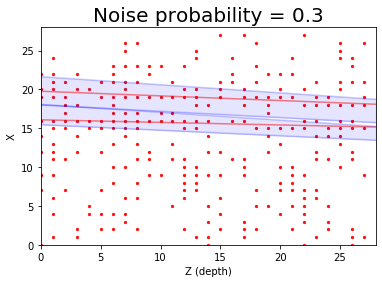

event_res_0.9_0.3_9.png


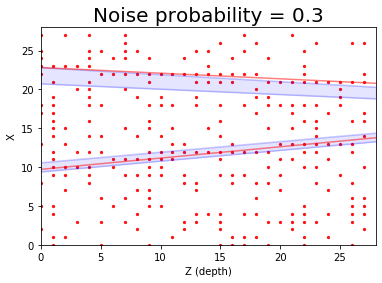

event_res_0.9_0.3_10.png


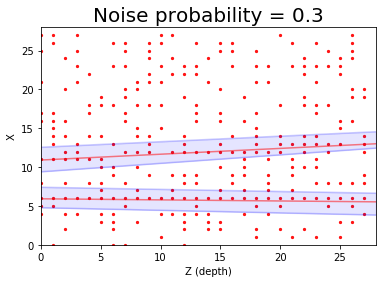

event_res_0.9_0.3_11.png


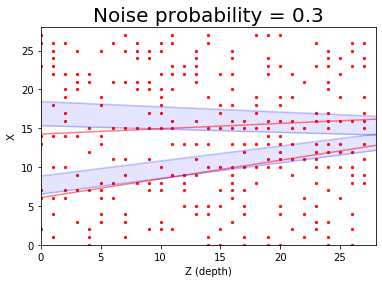

event_res_0.9_0.3_12.png


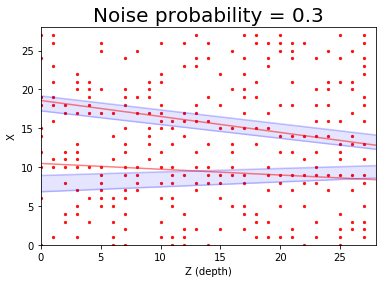

event_res_0.9_0.3_13.png


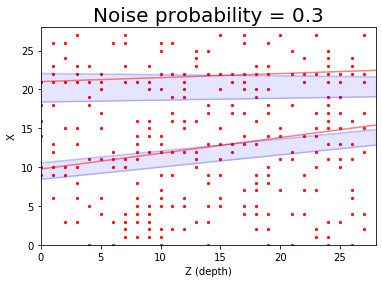

event_res_0.9_0.3_14.png


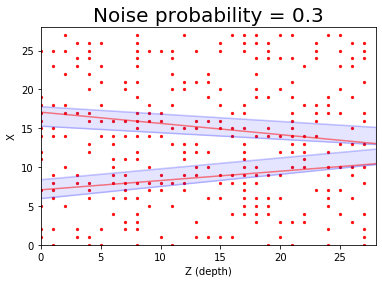

event_res_0.9_0.3_15.png


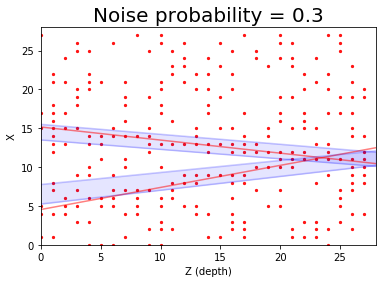

event_res_0.9_0.3_16.png


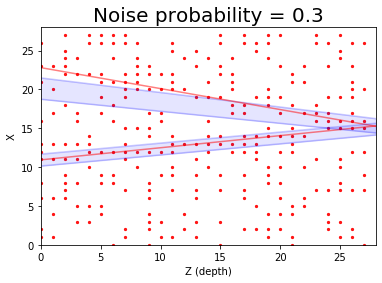

event_res_0.9_0.3_17.png


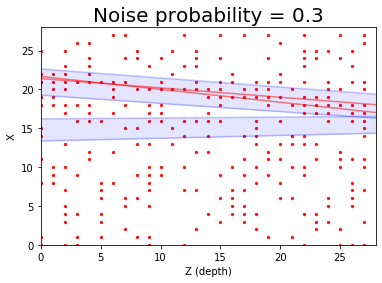

event_res_0.9_0.3_18.png


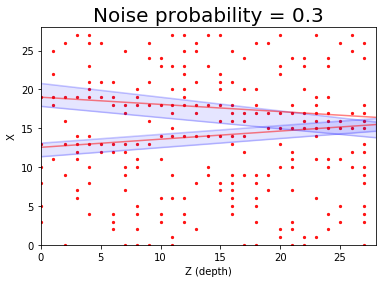

event_res_0.9_0.3_19.png


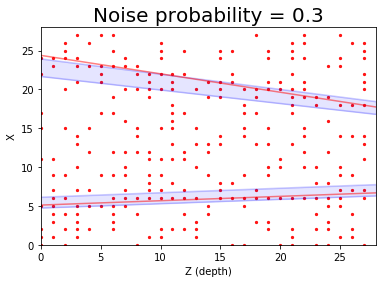

event_res_0.9_0.3_20.png


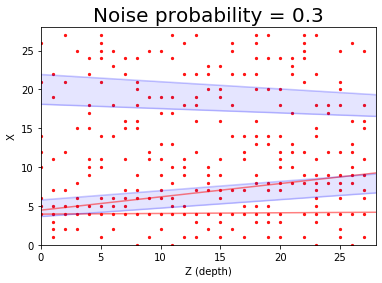

event_res_0.9_0.3_21.png


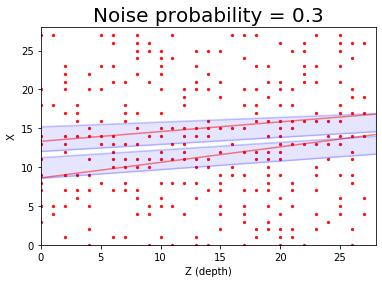

event_res_0.9_0.3_22.png


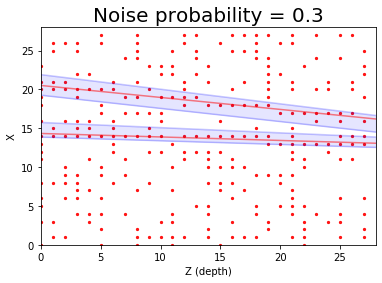

event_res_0.9_0.3_23.png


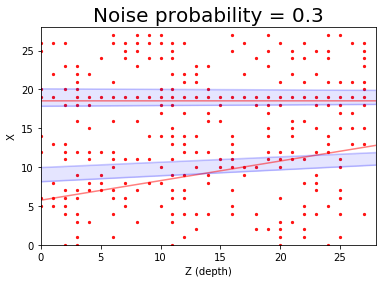

event_res_0.9_0.3_24.png


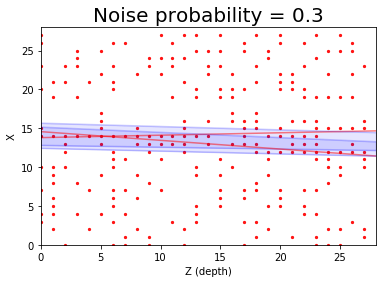

event_res_0.9_0.3_25.png


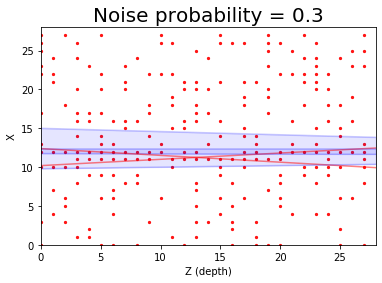

event_res_0.9_0.3_26.png


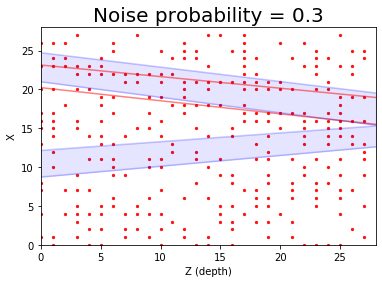

event_res_0.9_0.3_27.png


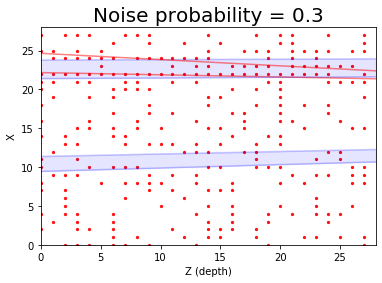

event_res_0.9_0.3_28.png


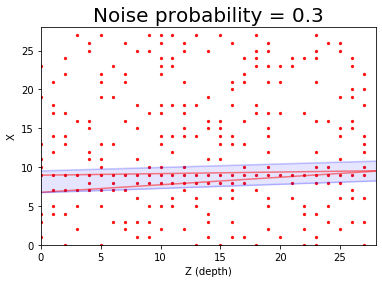

event_res_0.9_0.3_29.png


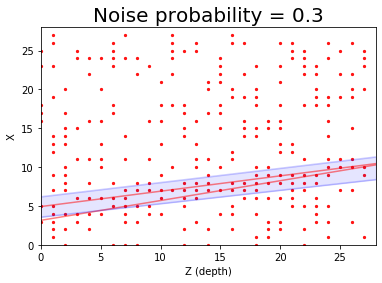

event_res_0.9_0.3_30.png


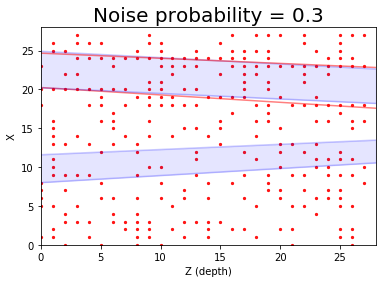

event_res_0.9_0.3_31.png


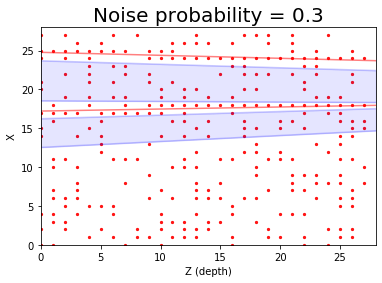

event_res_0.9_0.3_32.png


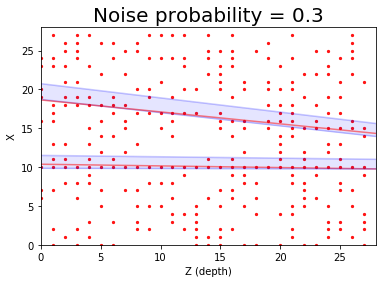

event_res_0.9_0.3_33.png


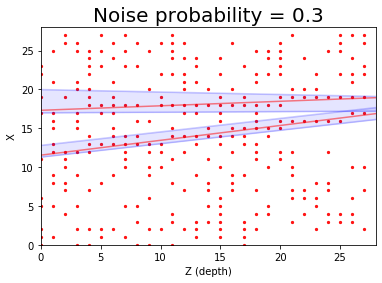

event_res_0.9_0.3_34.png


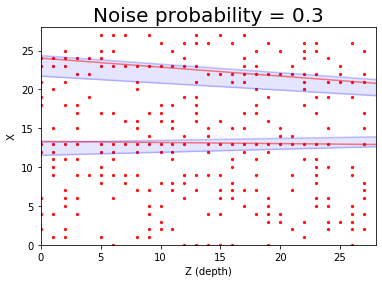

event_res_0.9_0.3_35.png


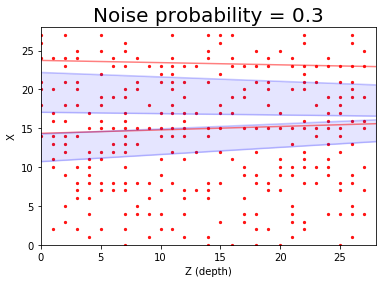

event_res_0.9_0.3_36.png


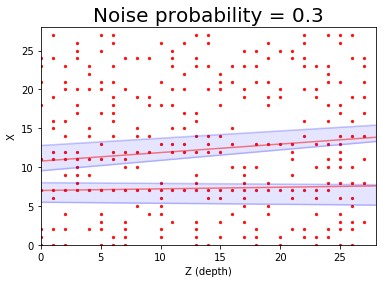

event_res_0.9_0.3_37.png


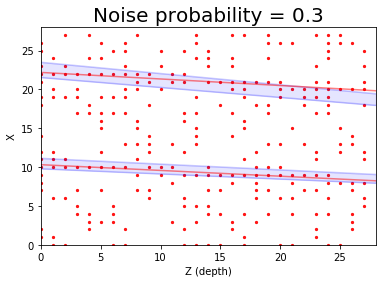

event_res_0.9_0.3_38.png


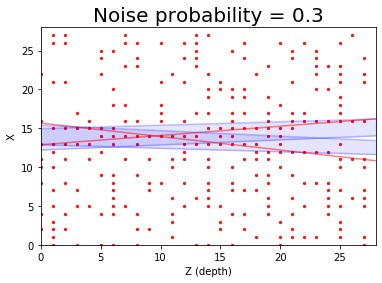

event_res_0.9_0.3_39.png


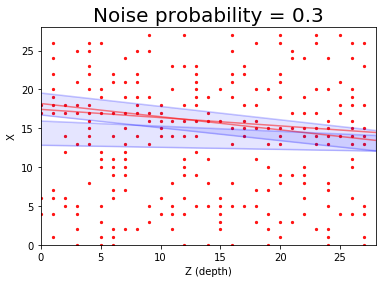

event_res_0.9_0.3_0.png


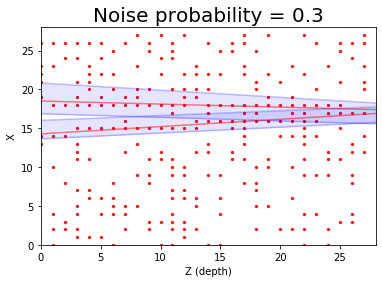

event_res_0.9_0.3_1.png


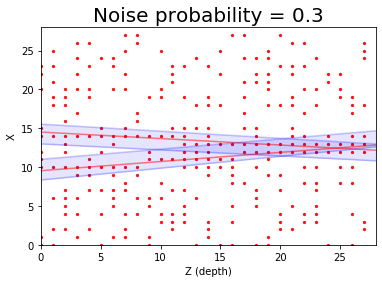

event_res_0.9_0.3_2.png


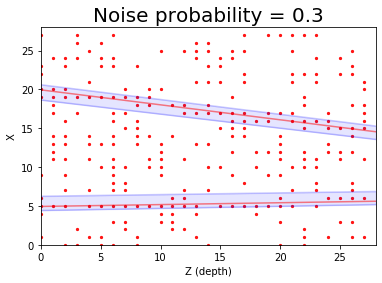

event_res_0.9_0.3_3.png


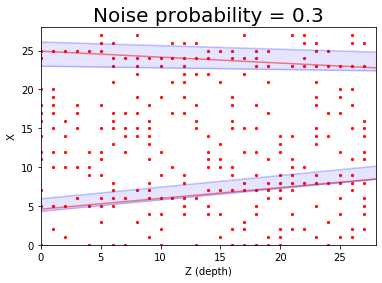

event_res_0.9_0.3_4.png


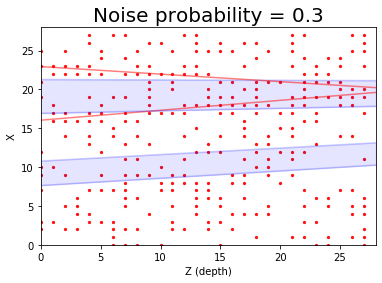

event_res_0.9_0.3_5.png


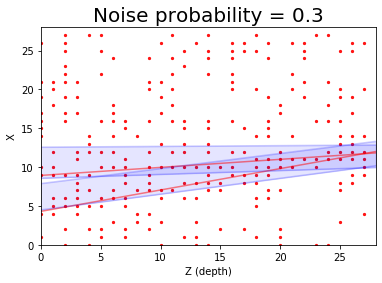

event_res_0.9_0.3_6.png


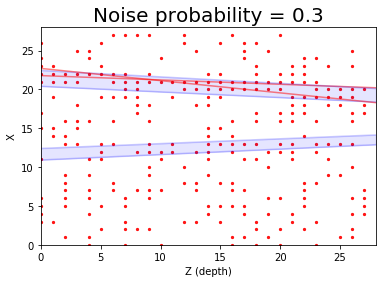

event_res_0.9_0.3_7.png


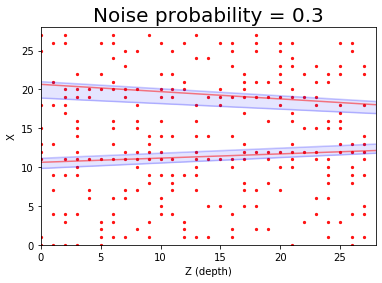

event_res_0.9_0.3_8.png


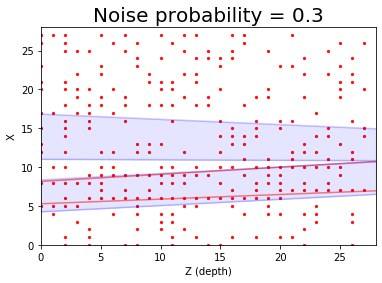

event_res_0.9_0.3_9.png


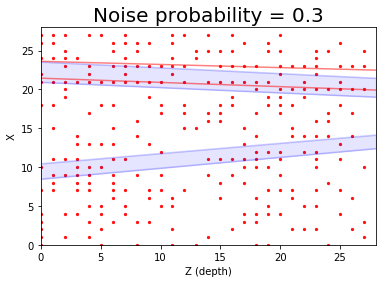

event_res_0.9_0.3_10.png


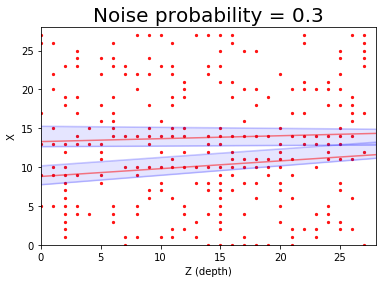

event_res_0.9_0.3_11.png


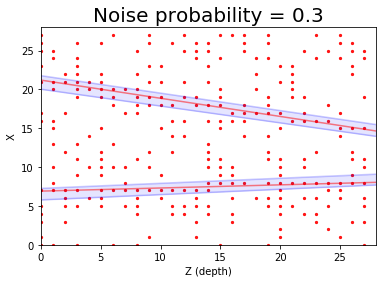

event_res_0.9_0.3_12.png


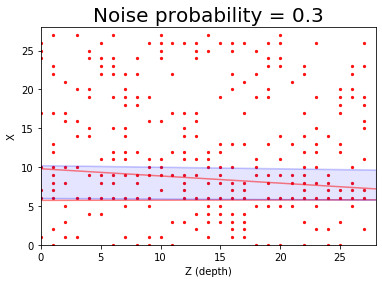

event_res_0.9_0.3_13.png


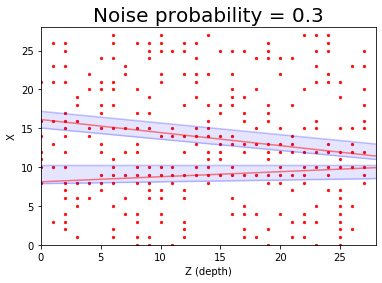

event_res_0.9_0.3_14.png


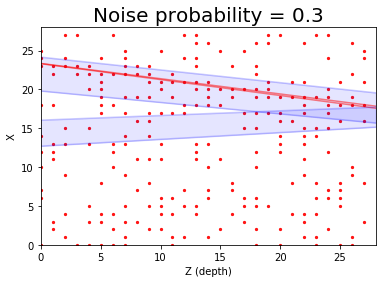

event_res_0.9_0.3_15.png


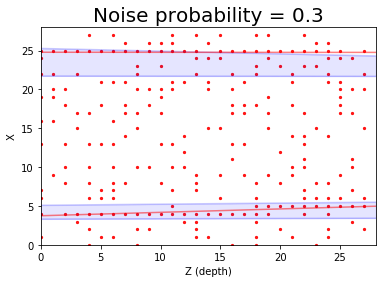

event_res_0.9_0.3_16.png


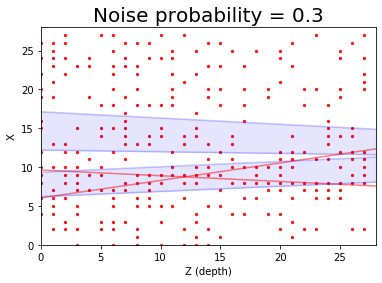

event_res_0.9_0.3_17.png


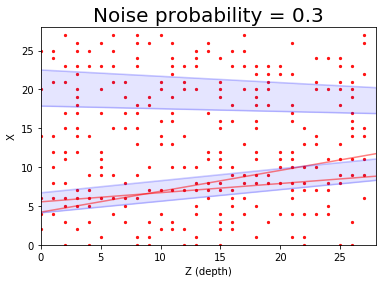

event_res_0.9_0.3_18.png


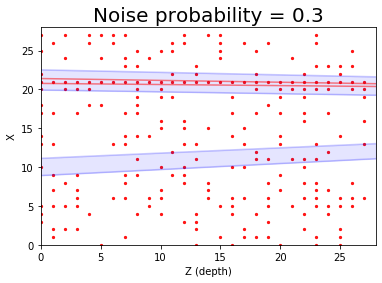

event_res_0.9_0.3_19.png


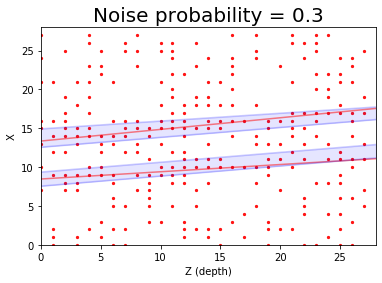

event_res_0.9_0.3_20.png


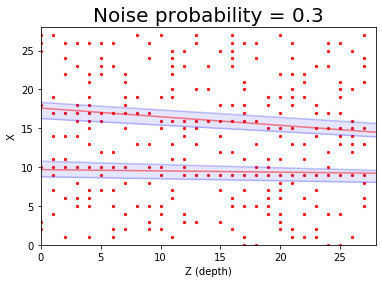

event_res_0.9_0.3_21.png


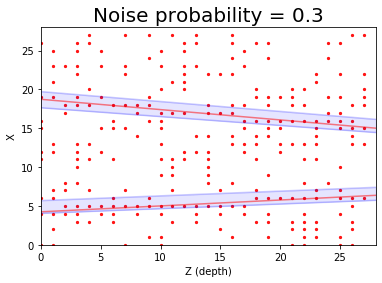

event_res_0.9_0.3_22.png


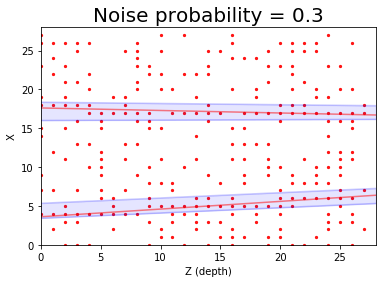

event_res_0.9_0.3_23.png


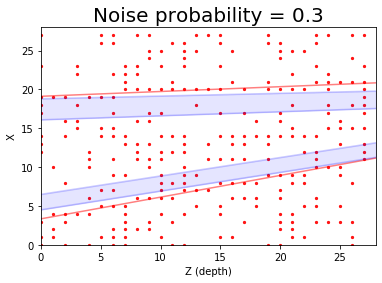

event_res_0.9_0.3_24.png


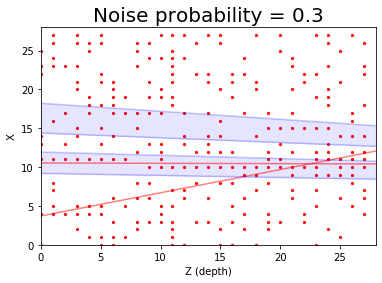

event_res_0.9_0.3_25.png


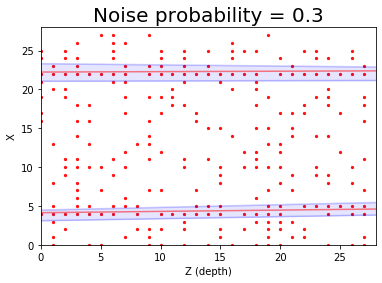

event_res_0.9_0.3_26.png


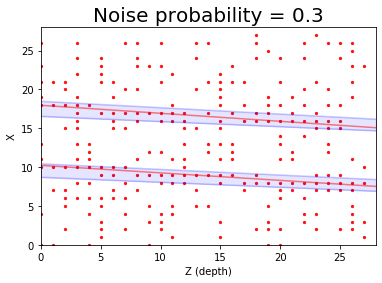

event_res_0.9_0.3_27.png


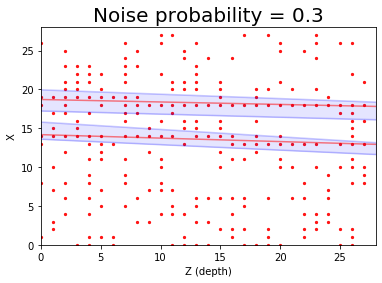

event_res_0.9_0.3_28.png


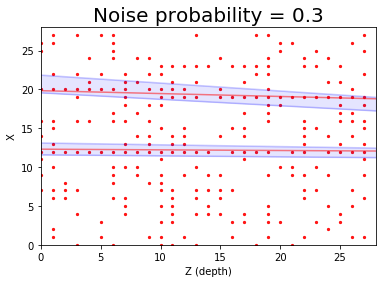

event_res_0.9_0.3_29.png


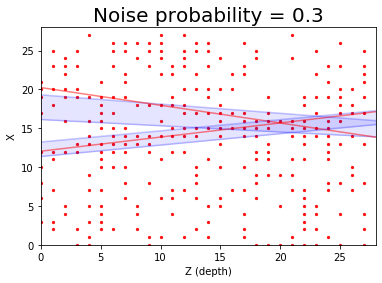

event_res_0.9_0.3_30.png


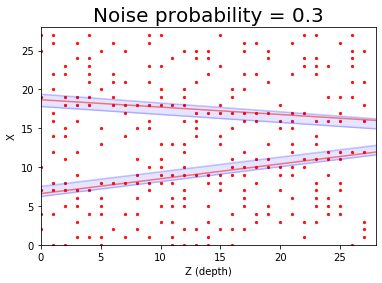

event_res_0.9_0.3_31.png


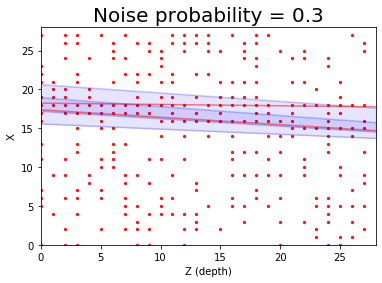

event_res_0.9_0.3_32.png


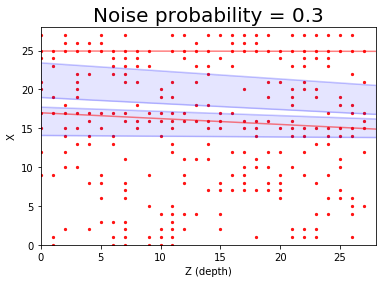

event_res_0.9_0.3_33.png


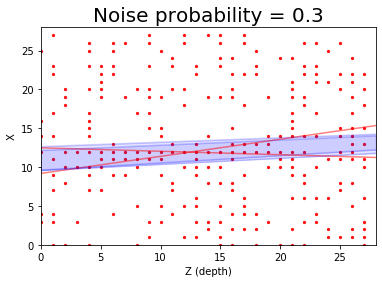

event_res_0.9_0.3_34.png


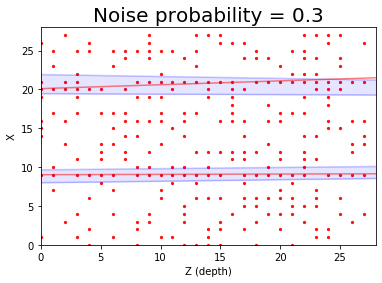

event_res_0.9_0.3_35.png


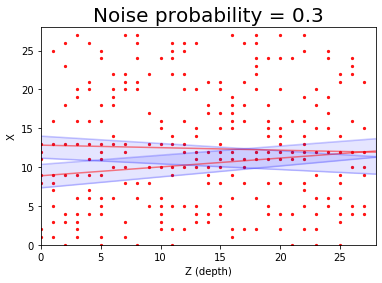

event_res_0.9_0.3_36.png


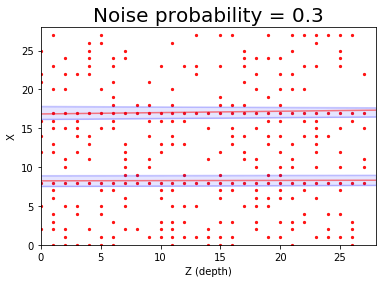

event_res_0.9_0.3_37.png


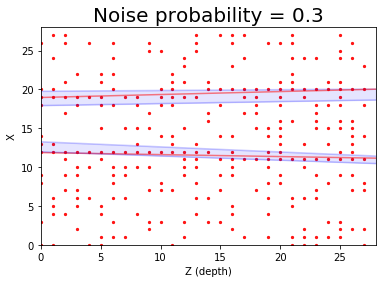

event_res_0.9_0.3_38.png


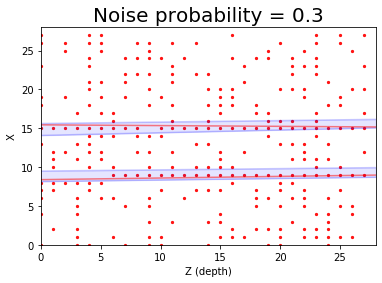

event_res_0.9_0.3_39.png


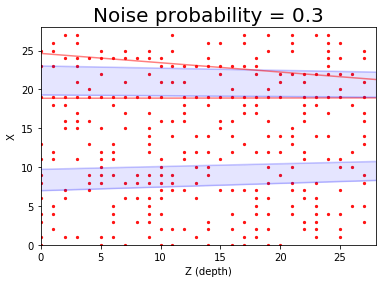

In [0]:
x_test, y_test = generate_testdata(prob_noise)
#plot_sample()
  
y_new = predict(model)
print("y_new shape: ",y_new.shape)
plot_predict(y_new)
plot_predict_event(y_new)

number of tracks  2
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 4s 264ms/step - loss: -4.7877
Epoch 2/64
16/16 [==============================] - 4s 269ms/step - loss: -5.2203
Epoch 3/64
16/16 [==============================] - 4s 266ms/step - loss: -5.1187
Epoch 4/64
16/16 [==============================] - 4s 264ms/step - loss: -5.3285
Epoch 5/64
16/16 [==============================] - 4s 265ms/step - loss: -5.3027
Epoch 6/64
16/16 [==============================] - 4s 264ms/step - loss: -5.4234
Epoch 7/64
16/16 [==============================] - 4s 266ms/step - loss: -5.4877
Epoch 8/64
16/16 [==============================] - 4s 262ms/step - loss: -5.5968
Epoch 9/64
16/16 [==============================] - 4s 263ms/step - loss: -5.5515
Epoch 10/64
16/16 [==============================] - 4s 269ms/step - loss: -5.5466
Epoch 11/64
16/16 [==============================] - 4s 266ms/step - loss:

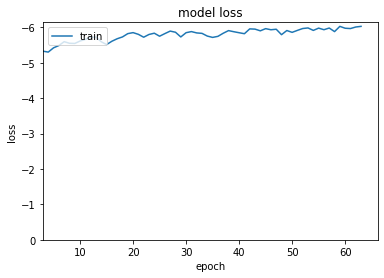

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     
_____

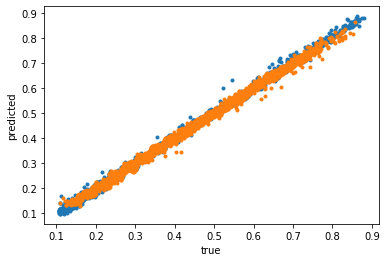

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:655: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:675: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.


mu, std:  -0.2606085435449926 0.8987868387240102
new_diff_0:  [ 0.63120202 -1.15096883  0.44312305 ...  0.46294044 -0.18724564
 -1.02046838]
new mu, std:  -0.2654129413220787 0.8746351985227269
bins_proposed: 49.45967496321337
mu, std:  0.03185888719223265 0.9737196070204336
new_diff_1:  [-0.24108977  0.42240474  0.78951938 ...  0.74793776 -2.18888634
  0.65281397]
bins_proposed: 56.397506554204995
params_1_0.9_0.png


<Figure size 432x288 with 0 Axes>

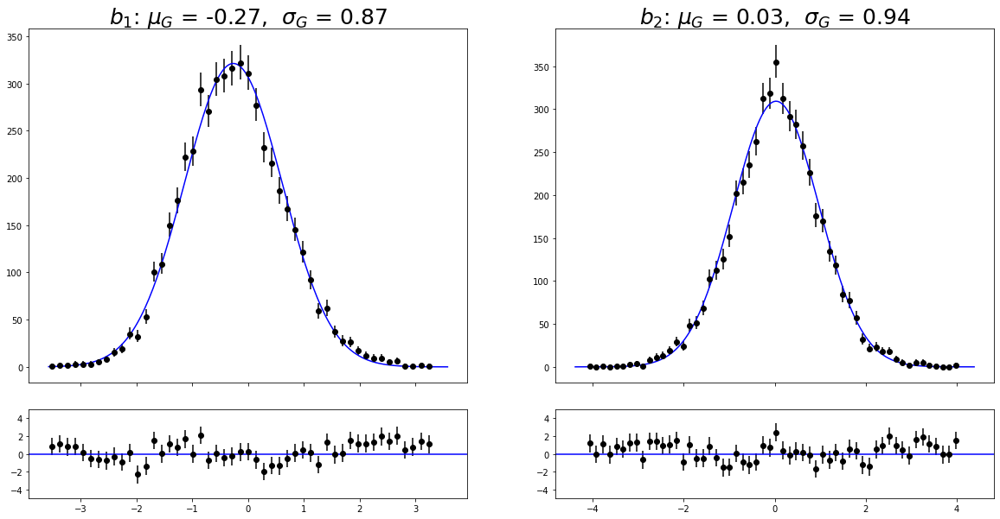

accuracy_tab:  [[99.33999999999999]]
avg_std_tab:  [[array([0.00869343, 0.00842408])]]
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0.05
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 4s 277ms/step - loss: -4.7754
Epoch 2/64
16/16 [==============================] - 4s 269ms/step - loss: -5.4358
Epoch 3/64
16/16 [==============================] - 4s 270ms/step - loss: -5.6829
Epoch 4/64
16/16 [==============================] - 4s 266ms/step - loss: -5.6815
Epoch 5/64
16/16 [==============================] - 4s 272ms/step - loss: -5.8550
Epoch 6/64
16/16 [==============================] - 4s 270ms/step - loss: -5.8059
Epoch 7/64
16/16 [==============================] - 4s 265ms/step - loss: -5.8652
Epoch 8/64
16/16 [==============================] - 4s 267ms/step - loss: -5.9107
Epoch 9/64
16/16 [==============================] - 4s 275ms/step - loss: -5.9025
Epoch 10/64
16/16 [==============================] - 4s 265ms/step - loss: -5.8889
Epoc

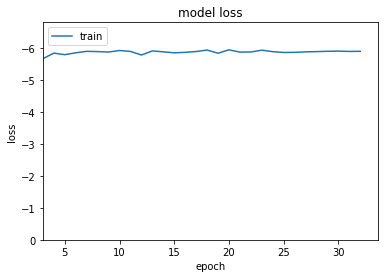

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0.05
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.05
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     

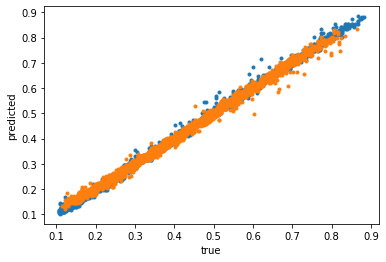

mu, std:  -0.03128172839473975 0.824067822005728
new_diff_0:  [ 1.45605087 -0.26802185 -0.47115044 ... -1.6544785   0.02001637
  0.25370771]
new mu, std:  -0.04051691171134863 0.7905204598582853
bins_proposed: 58.930680370456415
mu, std:  0.16547688671621463 0.7651789612753499
new_diff_1:  [ 1.89715255  0.32680228  0.26052044 ... -0.27396564 -0.05472974
  0.84326252]
bins_proposed: 83.15517092018189
params_1_0.9_0.05.png


<Figure size 432x288 with 0 Axes>

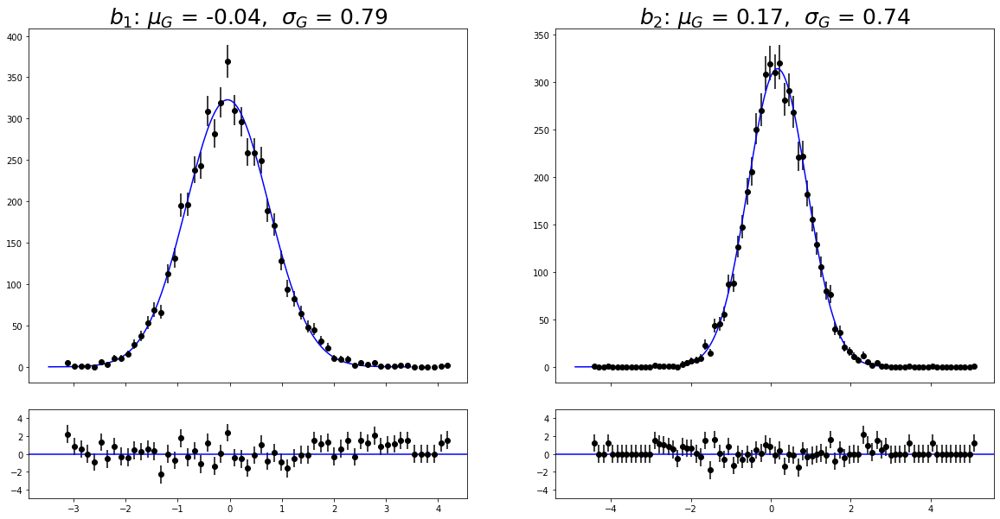

accuracy_tab:  [[99.33999999999999], [99.69]]
avg_std_tab:  [[array([0.00869343, 0.00842408])], [array([0.00923247, 0.010298  ])]]
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0.1
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 4s 272ms/step - loss: -5.7694
Epoch 2/64
16/16 [==============================] - 4s 268ms/step - loss: -5.7962
Epoch 3/64
16/16 [==============================] - 4s 270ms/step - loss: -5.8082
Epoch 4/64
16/16 [==============================] - 4s 270ms/step - loss: -5.8395
Epoch 5/64
16/16 [==============================] - 4s 266ms/step - loss: -5.7657
Epoch 6/64
16/16 [==============================] - 4s 268ms/step - loss: -5.7611
Epoch 7/64
16/16 [==============================] - 4s 271ms/step - loss: -5.8298
Epoch 8/64
16/16 [==============================] - 4s 269ms/step - loss: -5.8325
Epoch 9/64
16/16 [==============================] - 4s 266ms/step - loss: -5.8402
Epoch 10/64
16/16 [=========================

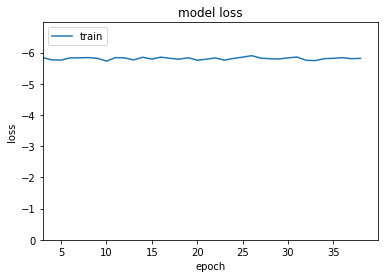

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0.1
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.1
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     
_

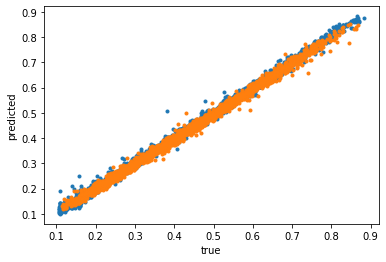

mu, std:  0.24186279627758922 0.8550189546877915
new_diff_0:  [ 0.71181746  1.27510317 -1.87410132 ... -0.37367006  0.12552748
  0.05988698]
new mu, std:  0.23973505914224877 0.8287394532568747
bins_proposed: 69.51311122341271
mu, std:  -0.3042815856280623 0.818417418965018
new_diff_1:  [-0.69115682 -0.2362835   1.34743852 ... -0.00480993  0.06728635
 -0.77110024]
bins_proposed: 73.11534056637093
params_1_0.9_0.1.png


<Figure size 432x288 with 0 Axes>

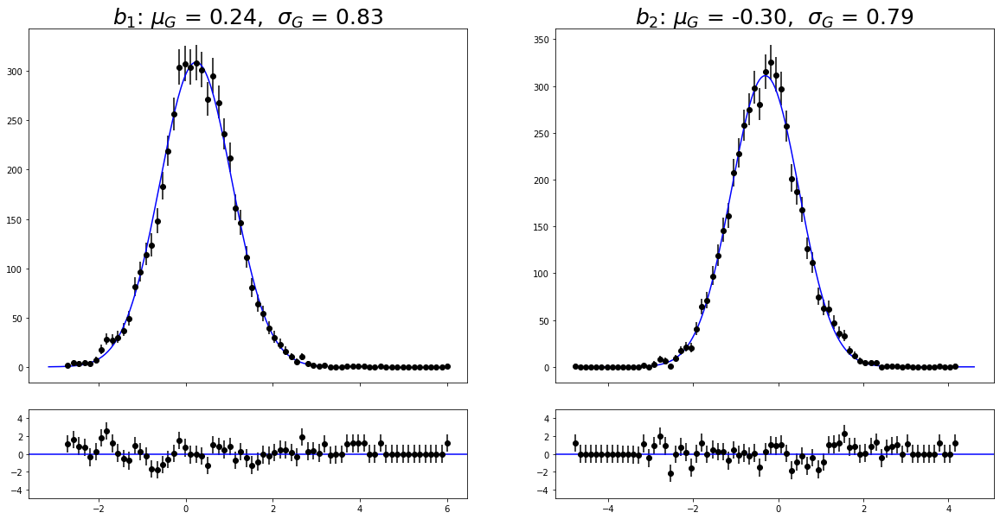

accuracy_tab:  [[99.33999999999999], [99.69], [99.61]]
avg_std_tab:  [[array([0.00869343, 0.00842408])], [array([0.00923247, 0.010298  ])], [array([0.00974922, 0.01070879])]]
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0.15
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 4s 280ms/step - loss: -5.6291
Epoch 2/64
16/16 [==============================] - 4s 274ms/step - loss: -5.6261
Epoch 3/64
16/16 [==============================] - 4s 277ms/step - loss: -5.6834
Epoch 4/64
16/16 [==============================] - 4s 274ms/step - loss: -5.6913
Epoch 5/64
16/16 [==============================] - 5s 282ms/step - loss: -5.6704
Epoch 6/64
16/16 [==============================] - 4s 276ms/step - loss: -5.6558
Epoch 7/64
16/16 [==============================] - 4s 275ms/step - loss: -5.7046
Epoch 8/64
16/16 [==============================] - 4s 274ms/step - loss: -5.5961
Epoch 9/64
16/16 [==============================] - 4s 280ms/step - loss: -5.6165

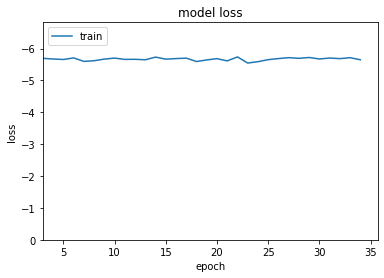

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0.15
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.15
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     

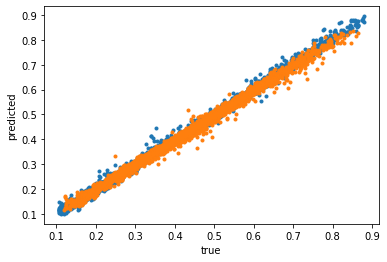

mu, std:  0.07632403061756846 0.9526745123318742
new_diff_0:  [-0.13297645 -0.19039748 -1.36601091 ... -0.19067138  0.83906531
  1.61970568]
new mu, std:  0.07346430085530482 0.9025606994446458
bins_proposed: 67.68194147376381
mu, std:  -0.2837763937467663 0.9225484014431864
new_diff_1:  [ 0.35288087 -0.1081055  -0.18363563 ... -1.78640545 -0.1217084
 -2.53006267]
bins_proposed: 101.33935172387243
params_1_0.9_0.15.png


<Figure size 432x288 with 0 Axes>

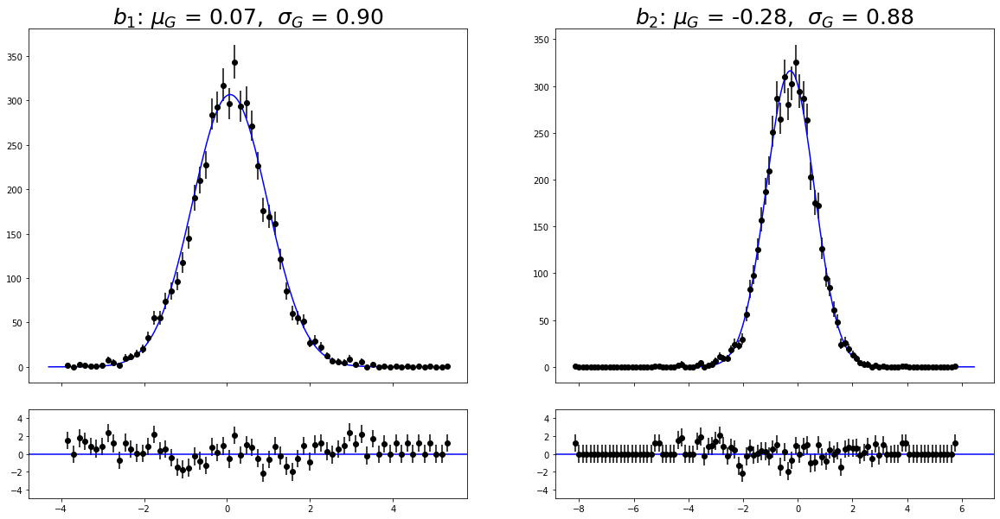

accuracy_tab:  [[99.33999999999999], [99.69], [99.61], [99.03999999999999]]
avg_std_tab:  [[array([0.00869343, 0.00842408])], [array([0.00923247, 0.010298  ])], [array([0.00974922, 0.01070879])], [array([0.00969588, 0.01073306])]]
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0.2
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 4s 279ms/step - loss: -5.3719
Epoch 2/64
16/16 [==============================] - 4s 270ms/step - loss: -5.4846
Epoch 3/64
16/16 [==============================] - 4s 271ms/step - loss: -5.3984
Epoch 4/64
16/16 [==============================] - 4s 272ms/step - loss: -5.5015
Epoch 5/64
16/16 [==============================] - 4s 273ms/step - loss: -5.4368
Epoch 6/64
16/16 [==============================] - 4s 271ms/step - loss: -5.4034
Epoch 7/64
16/16 [==============================] - 4s 271ms/step - loss: -5.4958
Epoch 8/64
16/16 [==============================] - 4s 270ms/step - loss: -5.4536
Epoch 9/64
16/16 [========

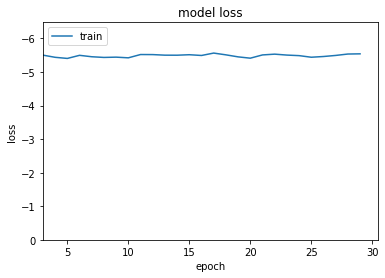

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0.2
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.2
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     
_

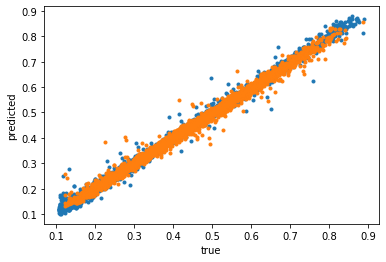

mu, std:  -0.0484441222633805 0.9118166985729287
new_diff_0:  [ 0.11247729  1.07043476  1.82012714 ...  1.73965008  1.52384205
 -0.59388974]
new mu, std:  -0.05213719428085545 0.8561530900586034
bins_proposed: 154.8133081914044
mu, std:  -0.11173175857000338 0.8979580997280124
new_diff_1:  [ 0.14720308 -1.8538905  -1.1824896  ... -1.0053122   0.06875311
  0.23712797]
bins_proposed: 104.61594694023296
params_1_0.9_0.2.png


<Figure size 432x288 with 0 Axes>

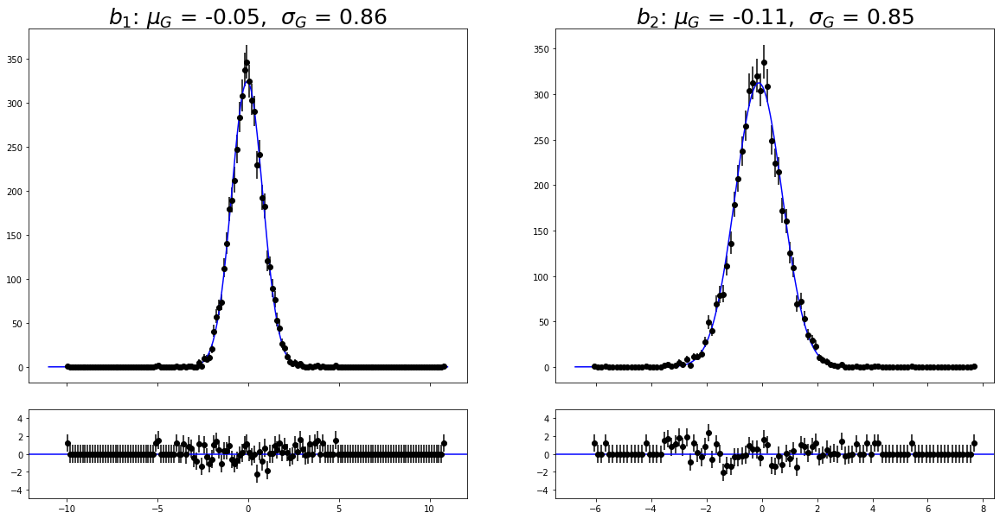

accuracy_tab:  [[99.33999999999999], [99.69], [99.61], [99.03999999999999], [99.2]]
avg_std_tab:  [[array([0.00869343, 0.00842408])], [array([0.00923247, 0.010298  ])], [array([0.00974922, 0.01070879])], [array([0.00969588, 0.01073306])], [array([0.01156199, 0.0118545 ])]]
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0.25
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 4s 281ms/step - loss: -5.2608
Epoch 2/64
16/16 [==============================] - 4s 280ms/step - loss: -5.2943
Epoch 3/64
16/16 [==============================] - 4s 278ms/step - loss: -5.2894
Epoch 4/64
16/16 [==============================] - 4s 278ms/step - loss: -5.2283
Epoch 5/64
16/16 [==============================] - 4s 275ms/step - loss: -5.2987
Epoch 6/64
16/16 [==============================] - 4s 280ms/step - loss: -5.2442
Epoch 7/64
16/16 [==============================] - 4s 275ms/step - loss: -5.2693
Epoch 8/64
16/16 [==============================] - 4s 278ms/ste

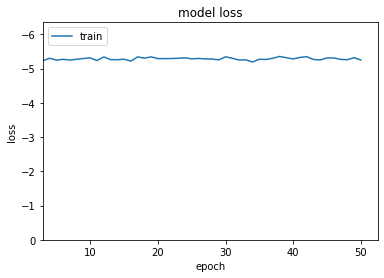

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0.25
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.25
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     

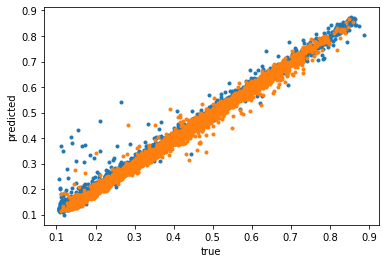

mu, std:  0.39758282506850384 0.946708509749884
new_diff_0:  [ 0.16720607  0.29860625 -1.12561686 ... -1.18365735 -0.57256119
  2.31873416]
new mu, std:  0.3893026545851119 0.8381536549025598
bins_proposed: 151.66048988309595
mu, std:  -0.5241752011778864 0.9948732751387079
new_diff_1:  [-0.77480746 -1.55516605  0.67839257 ...  0.73183893 -1.15083128
 -0.530937  ]
bins_proposed: 115.23892759470384
params_1_0.9_0.25.png


<Figure size 432x288 with 0 Axes>

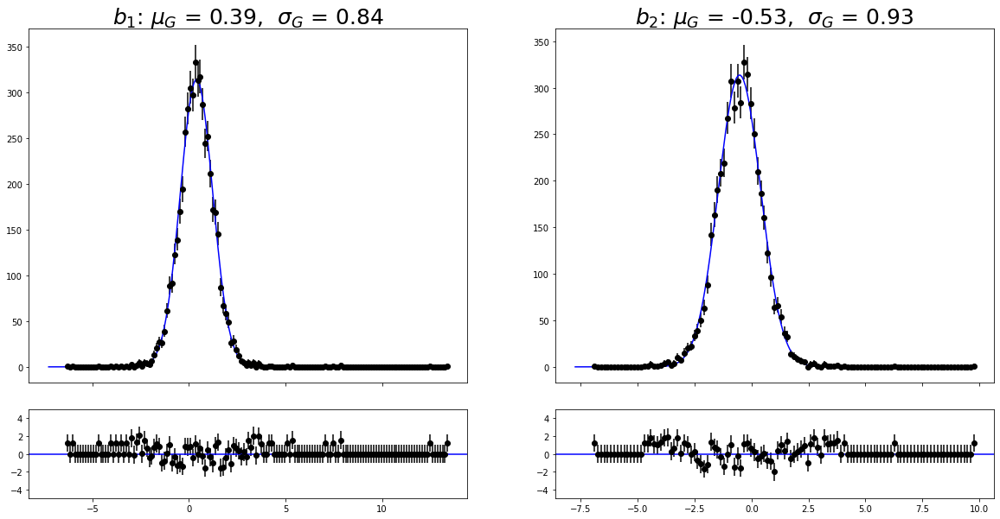

accuracy_tab:  [[99.33999999999999], [99.69], [99.61], [99.03999999999999], [99.2], [98.19]]
avg_std_tab:  [[array([0.00869343, 0.00842408])], [array([0.00923247, 0.010298  ])], [array([0.00974922, 0.01070879])], [array([0.00969588, 0.01073306])], [array([0.01156199, 0.0118545 ])], [array([0.01222703, 0.01238003])]]
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0.3
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 5s 281ms/step - loss: -4.9642
Epoch 2/64
16/16 [==============================] - 5s 284ms/step - loss: -5.0682
Epoch 3/64
16/16 [==============================] - 4s 275ms/step - loss: -5.0552
Epoch 4/64
16/16 [==============================] - 4s 274ms/step - loss: -4.9667
Epoch 5/64
16/16 [==============================] - 5s 282ms/step - loss: -4.9087
Epoch 6/64
16/16 [==============================] - 5s 283ms/step - loss: -4.9990
Epoch 7/64
16/16 [==============================] - 5s 282ms/step - loss: -5.0567
Epoch 8/64
16/16 [===

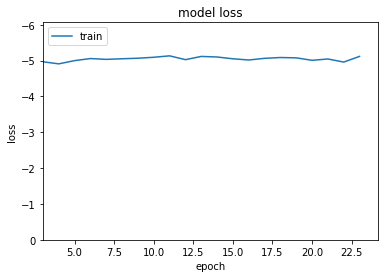

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0.3
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.3
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     
_

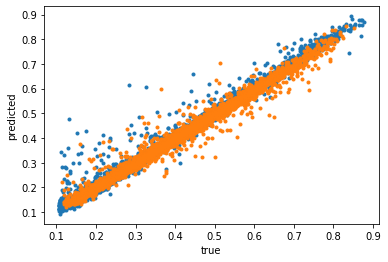

mu, std:  0.15354413278466833 0.9171328216452952
new_diff_0:  [-0.74442339 -0.56446656  0.64184647 ...  0.4979378   0.79634242
  1.29779628]
new mu, std:  0.14264409397122546 0.8316495158793342
bins_proposed: 118.21271087715017
mu, std:  -0.25910508322033504 0.9930316607982616
new_diff_1:  [ 0.56180813 -0.32280738 -0.30289509 ... -1.32832486  0.93514059
 -1.58475795]
bins_proposed: 175.70815504830105
params_1_0.9_0.3.png


<Figure size 432x288 with 0 Axes>

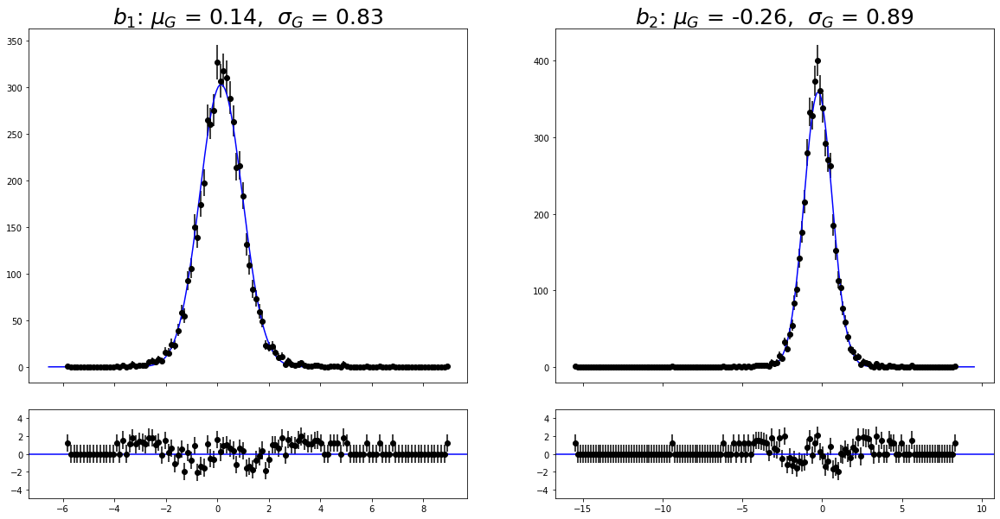

accuracy_tab:  [[99.33999999999999], [99.69], [99.61], [99.03999999999999], [99.2], [98.19], [98.28]]
avg_std_tab:  [[array([0.00869343, 0.00842408])], [array([0.00923247, 0.010298  ])], [array([0.00974922, 0.01070879])], [array([0.00969588, 0.01073306])], [array([0.01156199, 0.0118545 ])], [array([0.01222703, 0.01238003])], [array([0.01530404, 0.01507574])]]
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0.35
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 5s 283ms/step - loss: -4.7405
Epoch 2/64
16/16 [==============================] - 4s 278ms/step - loss: -4.8008
Epoch 3/64
16/16 [==============================] - 5s 282ms/step - loss: -4.7592
Epoch 4/64
16/16 [==============================] - 4s 279ms/step - loss: -4.7542
Epoch 5/64
16/16 [==============================] - 5s 283ms/step - loss: -4.7658
Epoch 6/64
16/16 [==============================] - 5s 283ms/step - loss: -4.8418
Epoch 7/64
16/16 [==============================] - 4s 280

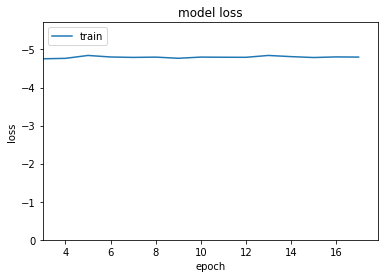

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0.35
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.35
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     

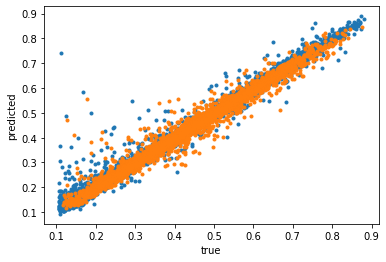

mu, std:  -0.08352810894600925 1.1421267208715493
new_diff_0:  [ 0.55491282  0.22376838 -0.43640305 ...  0.78187193  0.60130601
  0.16775985]
new mu, std:  -0.10030845904116349 0.982305831046532
bins_proposed: 148.63499794438735
mu, std:  -0.23713784878653438 1.116786005658509
new_diff_1:  [ 0.1265936   0.41750949 -1.8588541  ... -0.12687127  0.38665748
 -0.97330606]
bins_proposed: 196.89037630159882
params_1_0.9_0.35.png


<Figure size 432x288 with 0 Axes>

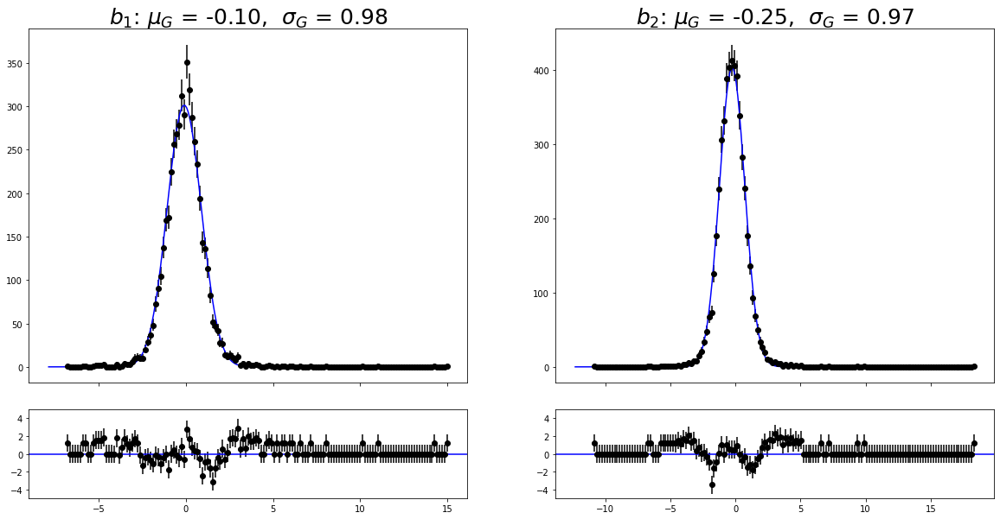

accuracy_tab:  [[99.33999999999999], [99.69], [99.61], [99.03999999999999], [99.2], [98.19], [98.28], [96.7]]
avg_std_tab:  [[array([0.00869343, 0.00842408])], [array([0.00923247, 0.010298  ])], [array([0.00974922, 0.01070879])], [array([0.00969588, 0.01073306])], [array([0.01156199, 0.0118545 ])], [array([0.01222703, 0.01238003])], [array([0.01530404, 0.01507574])], [array([0.01563379, 0.01583099])]]
Training with ADAM optimizer, efficiency, prob_noise =  0.9 0.4
Model loaded from disk
Epoch 1/64
16/16 [==============================] - 4s 281ms/step - loss: -4.3130
Epoch 2/64
16/16 [==============================] - 5s 282ms/step - loss: -4.4867
Epoch 3/64
16/16 [==============================] - 5s 282ms/step - loss: -4.4199
Epoch 4/64
16/16 [==============================] - 5s 283ms/step - loss: -4.4699
Epoch 5/64
16/16 [==============================] - 4s 278ms/step - loss: -4.5036
Epoch 6/64
16/16 [==============================] - 4s 278ms/step - loss: -4.5037
Epoch 7/64
16/16

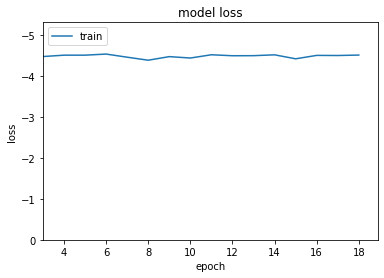

<Figure size 432x288 with 0 Axes>

Generate test data, efficiency, prob_noise =  0.9 0.4
3920000
Predict with trained NN, efficiency, prob_noise =  0.9 0.4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 11, 11, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 128)         36992     
_

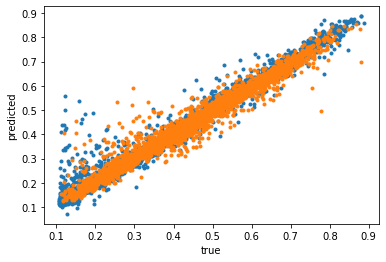

mu, std:  0.1783262663901034 1.1328484859346
new_diff_0:  [-0.2974705   1.47389899  1.30817773 ...  1.69152552 -0.58558901
  2.76493101]
new mu, std:  0.14852658488247153 0.8729959461615546
bins_proposed: 277.0562360706394
mu, std:  0.04961015191700697 1.1848624202325502
new_diff_1:  [0.62171759 0.48995655 0.79275995 ... 1.75892232 0.08076992 3.47499837]
bins_proposed: 280.1424688052147
params_1_0.9_0.4.png


<Figure size 432x288 with 0 Axes>

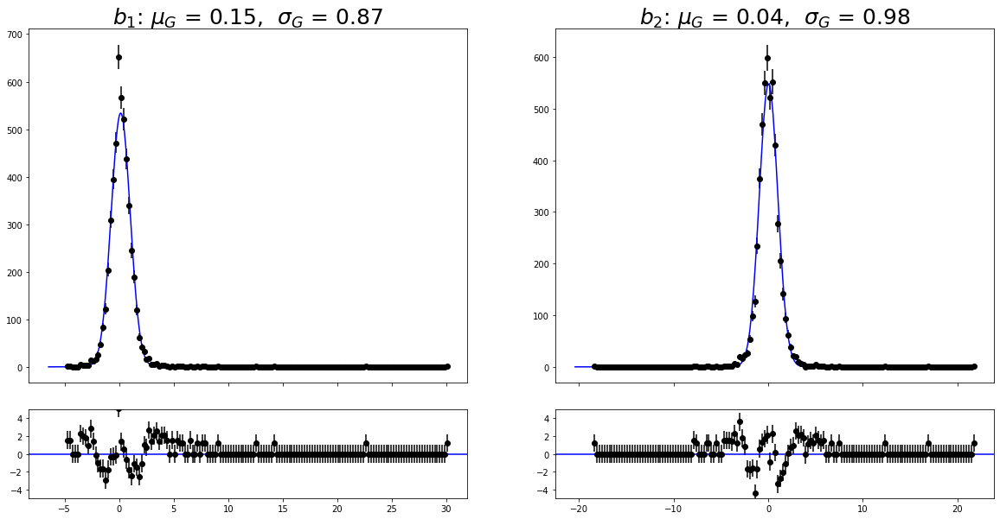

accuracy_tab:  [[99.33999999999999], [99.69], [99.61], [99.03999999999999], [99.2], [98.19], [98.28], [96.7], [96.78]]
avg_std_tab:  [[array([0.00869343, 0.00842408])], [array([0.00923247, 0.010298  ])], [array([0.00974922, 0.01070879])], [array([0.00969588, 0.01073306])], [array([0.01156199, 0.0118545 ])], [array([0.01222703, 0.01238003])], [array([0.01530404, 0.01507574])], [array([0.01563379, 0.01583099])], [array([0.0211435 , 0.01906385])]]


<Figure size 432x288 with 0 Axes>

In [0]:
file=open('acc.txt','w+')
file2=open('std.txt','w+')

print("number of tracks ",mean_tracks)

accuracy_tab = []
avg_std_tab = []

#for prob_noise in [0, 0.050, 0.100, 0.150, 0.200,0.25,0.3,0.35,0.4]:
for prob_noise in [0.001, 0.050, 0.150]:
  tmp_acc=[]
  tmp_std=[]
#   train_model(model, prob_noise, epochs)
  for i in range(1):
    train_model(model, prob_noise, 64)


    x_test, y_test = generate_testdata(prob_noise)
  
#   plot_sample()
  
    y_new = predict(model)
#   print("y_new shape: ",y_new.shape)
#   plot_predict(y_new)
#   plot_predict_event(y_new)
  
    tmp_acc.append(get_accuracy(y_new = y_new, sigmas = 3))
    tmp_std.append(get_std(y_new = y_new))
  
#   write_predict(y_new)
  
  #!zip  /content/dnn_output_0.zip /content/*.png /content/*.txt
  accuracy_tab.append(tmp_acc)
  avg_std_tab.append(tmp_std)
  plot_predict(y_new)
  print("accuracy_tab: ", accuracy_tab)
  print("avg_std_tab: ", avg_std_tab)
  
  file.write(str(accuracy_tab))
  file2.write(str(avg_std_tab))
  
file.close()
file2.close()

In [0]:



end_training_time = time.time()



!zip  /content/dnn_output_final.zip /content/*.png /content/*.txt



print ("    ")
print ("###########################################################")
print ("    ")
print ("CPU usage: ")
print ("Deep NN training:      ", end_training_time-start_training_time)
#print ("Pattern recognition:   ", end_pattern_time-start_pattern_time)
#print ("Track fitting:         ", end_fit_time-start_fit_time)
print ("    ")
print ("###########################################################")
print ("    ")



  adding: content/event_0.9_0.2_0.png (deflated 3%)
  adding: content/event_0.9_0.2_10.png (deflated 3%)
  adding: content/event_0.9_0.2_11.png (deflated 3%)
  adding: content/event_0.9_0.2_12.png (deflated 3%)
  adding: content/event_0.9_0.2_13.png (deflated 3%)
  adding: content/event_0.9_0.2_14.png (deflated 3%)
  adding: content/event_0.9_0.2_15.png (deflated 3%)
  adding: content/event_0.9_0.2_16.png (deflated 3%)
  adding: content/event_0.9_0.2_17.png (deflated 3%)
  adding: content/event_0.9_0.2_18.png (deflated 3%)
  adding: content/event_0.9_0.2_19.png (deflated 3%)
  adding: content/event_0.9_0.2_1.png (deflated 3%)
  adding: content/event_0.9_0.2_20.png (deflated 3%)
  adding: content/event_0.9_0.2_21.png (deflated 3%)
  adding: content/event_0.9_0.2_22.png (deflated 3%)
  adding: content/event_0.9_0.2_23.png (deflated 3%)
  adding: content/event_0.9_0.2_24.png (deflated 3%)
  adding: content/event_0.9_0.2_25.png (deflated 3%)
  adding: content/event_0.9_0.2_26.png (deflated

[99.78399999999999, 99.554, 99.41, 98.908, 98.50399999999999, 97.95, 97.73400000000001, 96.98600000000002, 96.11399999999999]


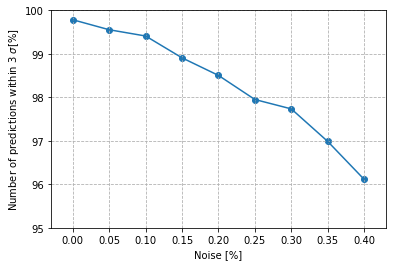

In [0]:
acc=[[99.87, 99.92, 99.64, 99.76, 99.72999999999999], [99.77000000000001, 99.37, 99.67, 99.5, 99.46000000000001], [99.25, 99.52, 99.39, 99.5, 99.39], [98.87, 98.87, 99.17, 98.99, 98.64], [98.31, 98.35000000000001, 98.59, 98.64, 98.63], [97.58, 97.47, 97.88, 98.41, 98.41], [97.87, 97.37, 97.72, 97.55, 98.16], [96.93, 97.28999999999999, 97.39, 97.33000000000001, 95.99], [95.96000000000001, 96.50999999999999, 95.48, 96.72, 95.89999999999999]]
avg_acc=[sum(i)/5 for i in acc]
print(avg_acc)
fig=plt.figure()
ax=fig.add_subplot(111)
ax.scatter([0.05*i for i in range(9)],np.asarray(avg_acc))
ax.plot([0.05* i for i in range(9)],avg_acc)
ax.set_ylim(95,100)
ax.set_ylabel('Number of predictions within 3 $\sigma$[%]')
ax.set_xlabel('Noise [%]')
ax.grid(True,linestyle='--')
ax.set_xticks([0.05*i for i in range(9)])
plt.show()

[array([0.00882809, 0.00899133]), array([0.00903696, 0.00949587]), array([0.00986067, 0.01019962]), array([0.01023558, 0.01048849]), array([0.010994  , 0.01151902]), array([0.01190187, 0.01219484]), array([0.01372185, 0.01377528]), array([0.01553839, 0.01505893]), array([0.01736728, 0.01674752])]


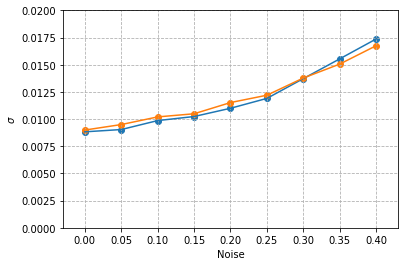

In [0]:
std=[[[0.00846686, 0.00924438], [0.01022341, 0.00985734], [0.0083644 , 0.00887753], [0.00850845, 0.00874698], [0.00857732, 0.00823043]], [[0.0096002 , 0.01020002], [0.00840839, 0.00911807], [0.0093949 , 0.00979111], [0.00909454, 0.00930789], [0.00868675, 0.00906226]], [[0.00958986, 0.01002555], [0.01007113, 0.00979181], [0.0091244 , 0.00977143], [0.01026006, 0.01138294], [0.01025792, 0.01002638]], [[0.01042364, 0.01058761], [0.00960763, 0.01012799], [0.01090514, 0.01097636], [0.01030174, 0.01108631], [0.00993975, 0.0096642 ]], [[0.01089113, 0.011723  ], [0.01073421, 0.01105192], [0.01080831, 0.01108301], [0.01138605, 0.01171114], [0.0111503 , 0.01202605]], [[0.01181397, 0.01187586], [0.01170932, 0.01198603], [0.01132837, 0.01177775], [0.01201325, 0.01289862], [0.01264442, 0.01243592]], [[0.01422562, 0.01410416], [0.01322689, 0.01358494], [0.0140029, 0.013372 ], [0.01320539, 0.01366815], [0.01394845, 0.01414715]], [[0.01532031, 0.01498776], [0.0153657 , 0.01494249], [0.01649065, 0.01567658], [0.0158827 , 0.01535506], [0.01463258, 0.01433275]], [[0.01660015, 0.01611003], [0.02007521, 0.01812319], [0.0164027, 0.0158117], [0.01667963, 0.01771685], [0.01707871, 0.01597585]]]
avg_std=[np.average(i,axis=0) for i in std]
print(avg_std)
fig=plt.figure()
ax=fig.add_subplot(111)
ax.scatter([0.05*i for i in range(9)],np.asarray(avg_std)[:,0])
ax.set_ylim(0,0.020)
ax.scatter([0.05*i for i in range(9)],np.asarray(avg_std)[:,1])
ax.set_ylabel('$\sigma$')
ax.set_xlabel('Noise')
ax.set_xticks([0.05*i for i in range(9)])
ax.plot([0.05*i for i in range(9)],np.asarray(avg_std)[:,0])
ax.plot([0.05*i for i in range(9)],np.asarray(avg_std)[:,1])
ax.grid(True,linestyle='--')
plt.show()